# GUC NETW 1003 Kmeans Assginmnet 

Objective: exercise is to learn how to use build and use  kmeans clustering algortrithm    

At the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means Algorithm 
> 2. Understand the effect of the parmeters ont he perfromance of the algorithm .
> 3. Understand the effect of distance.

## 1. Wirte K means function 

import required libraries 

In [1]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons

> ### 1.1. Code for the distance function 

write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type) 
* The function shoud be able to handel data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Ecluidian distance
    - Pearson correlation distance
  

In [2]:
import numpy as np

def GUC_Distance(Cluster_Centroids, Data_points, Distance_Type='euclidean'):
    """
    Calculate distances between cluster centroids and data points.

    Parameters:
    - Cluster_Centroids: NumPy array with shape (K, num_features) representing K cluster centroids.
    - Data_points: NumPy array with shape (num_points, num_features) representing data points.
    - Distance_Type: String specifying the distance type ('euclidean' or 'pearson').

    Returns:
    - distances: NumPy array with shape (num_points, K) containing distances between each data point and each cluster centroid.
    """

    if Distance_Type == 'euclidean':
        # Euclidean distance
        distances = np.linalg.norm(Data_points[:, np.newaxis, :] - Cluster_Centroids, axis=2)

    elif Distance_Type == 'pearson':
        # Pearson correlation distance
        centered_data = Data_points - np.mean(Data_points, axis=0)
        centered_centroids = Cluster_Centroids - np.mean(Cluster_Centroids, axis=0)

        numerator = np.dot(centered_data, centered_centroids.T)
        denominator = np.sqrt(np.sum(centered_data ** 2, axis=1)[:, np.newaxis] * np.sum(centered_centroids ** 2, axis=1))

        distances = 1 - (numerator / denominator)

    else:
        raise ValueError("Invalid Distance_Type. Choose 'euclidean' or 'pearson'.")

    return distances



In [3]:
# # Example usage:
# K = 3  # Number of cluster centroids
# num_features = 2  # Number of features in data points and centroids
# num_points = 10  # Number of data points

# # Generate random data for testing

# # Cluster_Centroids = np.random.rand(K, num_features)
# # Data_points = np.random.rand(num_points, num_features)

# Cluster_Centroids = np.random.randint(low=0, high=100, size=(K, num_features))
# Data_points = np.random.randint(low=0, high=100, size=(num_points, num_features))

# print("Cluster Centroids:")
# print (Cluster_Centroids)

# print("\nData Points:")
# print (Data_points)

# # Calculate Euclidean distances
# euclidean_distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type='euclidean')

# # Calculate Pearson correlation distances
# pearson_distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type='pearson')

# print("\nEuclidean Distances:")
# print(euclidean_distances)

# print("\nPearson Correlation Distances:")
# print(pearson_distances)


> ### 1.2. Code for K means function 

> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assginmnet 
> > > * Use the GUC_Distance to calculate between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * for each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Updtate Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [4]:
def GUC_Kmean(Data_points, Number_of_Clusters, Distance_Type, max_iter=100, tol=1e-6, consecutive_iterations_tol=2):
    
    num_points, num_features = Data_points.shape
    
    #Cluster_Centroids = np.random.rand(Number_of_Clusters, num_features) * np.max(Data_points, axis=0)
    #Initialize cluster centroids randomly
    initial_indices = np.random.choice(num_points, Number_of_Clusters, replace=False)
    Cluster_Centroids = Data_points[initial_indices, :]
    
#     print ("\nCluster_Centroids:")
#     print (Cluster_Centroids)

    prev_mean_square_distances = np.zeros(Number_of_Clusters)
    
    for iteration in range(max_iter):
        # 1. Cluster Assignment
        distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
        cluster_assignments = np.argmin(distances, axis=1)

        # Calculate mean square distance for each cluster
        mean_square_distances = np.array([np.mean(distances[cluster_assignments == k, k]) for k in range(Number_of_Clusters)])
        
        # Stopping conditions
        if iteration > 0 and np.all(np.abs(mean_square_distances - prev_mean_square_distances) < tol):
            print(f"\nStopping condition 1 met: Mean square distances have not changed significantly for {consecutive_iterations_tol} consecutive iterations.")
            break
        
        if np.sum(mean_square_distances) < tol:
            print("\nStopping condition 2 met: Sum of mean square distances is less than the tolerance.")
            break
        
        prev_mean_square_distances = mean_square_distances.copy()
        
        # 2. Update Centroids
        for k in range(Number_of_Clusters):
            Cluster_Centroids[k, :] = np.mean(Data_points[cluster_assignments == k, :], axis=0)
        
    # Calculate final cluster distances and cluster metric (Distortion Function)
    final_cluster_distances = GUC_Distance(Cluster_Centroids, Data_points, Distance_Type)
    cluster_metric = np.sum(mean_square_distances)
    
    return final_cluster_distances, cluster_metric ,Cluster_Centroids , cluster_assignments


Data Points:
[[7 0]
 [1 6]
 [2 7]
 [7 3]
 [6 1]
 [3 6]
 [2 0]
 [1 4]
 [6 3]
 [9 7]
 [8 2]
 [5 6]
 [8 7]
 [2 3]
 [0 5]
 [5 0]
 [3 9]
 [2 6]
 [1 5]
 [4 1]
 [4 7]
 [8 8]
 [5 3]
 [9 1]
 [2 4]
 [6 5]
 [2 4]
 [0 1]
 [7 8]
 [8 6]]


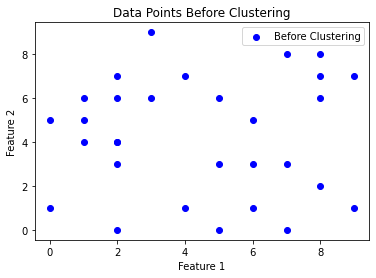


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

cluster_assignments
[0 1 1 0 0 1 1 1 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 0 1 0 1 1 0 0]
\Cluster_Centroids
[[6 3]
 [1 4]]


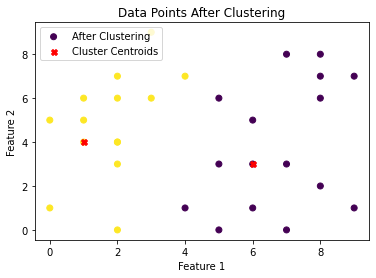

Final Cluster Distances:
[[3.16227766 7.21110255]
 [5.83095189 2.        ]
 [5.65685425 3.16227766]
 [1.         6.08276253]
 [2.         5.83095189]
 [4.24264069 2.82842712]
 [5.         4.12310563]
 [5.09901951 0.        ]
 [0.         5.09901951]
 [5.         8.54400375]
 [2.23606798 7.28010989]
 [3.16227766 4.47213595]
 [4.47213595 7.61577311]
 [4.         1.41421356]
 [6.32455532 1.41421356]
 [3.16227766 5.65685425]
 [6.70820393 5.38516481]
 [5.         2.23606798]
 [5.38516481 1.        ]
 [2.82842712 4.24264069]
 [4.47213595 4.24264069]
 [5.38516481 8.06225775]
 [1.         4.12310563]
 [3.60555128 8.54400375]
 [4.12310563 1.        ]
 [2.         5.09901951]
 [4.12310563 1.        ]
 [6.32455532 3.16227766]
 [5.09901951 7.21110255]
 [3.60555128 7.28010989]]

Cluster Metric (Distortion Function): 
5.3373068366379

(array([[3.16227766, 7.21110255],
       [5.83095189, 2.        ],
       [5.65685425, 3.16227766],
       [1.        , 6.08276253],
       [2.        , 5.83095189],
 

In [5]:
# QUICK TEST ###

# Generate random data points
np.random.seed(523)
data_points = np.random.randint(low=0 ,high= 10,size= (30, 2))  # 100 points in 2D space
print("\nData Points:")
print (data_points)
# Number of clusters
num_clusters = 2

# Distance type ('euclidean' or 'pearson')
distance_type = 'euclidean'

# Plot data points before clustering
plt.scatter(data_points[:, 0], data_points[:, 1], color='blue', label='Before Clustering')
plt.title('Data Points Before Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# Run K-means clustering
km = GUC_Kmean(data_points, num_clusters, distance_type)

# Extract cluster assignments from final distances
# cluster_assignments = np.argmin(final_cluster_distances, axis=1)
print("\ncluster_assignments")
print(km[3])
print("\Cluster_Centroids")
print(km[2])

# Plot data points after clustering
plt.scatter(data_points[:, 0], data_points[:, 1], c=km[3], cmap='viridis', label='After Clustering')
plt.scatter(km[2][:, 0], km[2][:, 1], c='red', marker='X', label='Cluster Centroids')
plt.title('Data Points After Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# # Plot data points after clustering
# plt.scatter(data_points[:, 0], data_points[:, 1], c=cluster_assignments, cmap='viridis', label='After Clustering')
# plt.scatter(Cluster_Centroids[:, 0], Cluster_Centroids[:, 1], c='red', marker='X', label='Final Cluster Centroids')
# plt.title('Data Points After Clustering')
# plt.xlabel('Feature 1')
# plt.ylabel('Feature 2')
# plt.legend()
# plt.show()


print(f'Final Cluster Distances:\n{km[0]}\n')
print(f'Cluster Metric (Distortion Function): \n{km[1]}\n')
print(km)


## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [6]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [7]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

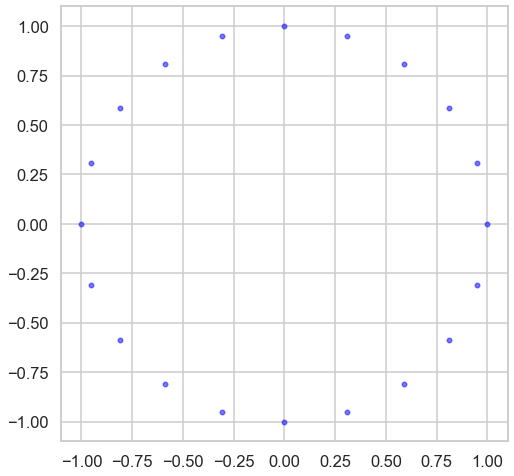

In [8]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")
# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

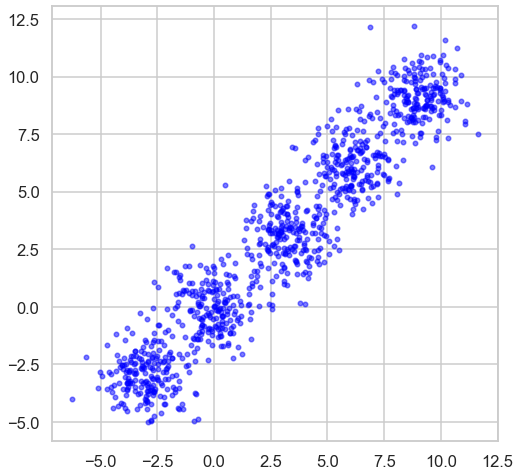

In [9]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
Y, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Y)




#### 2.3. Example 3 : moons Data Gen and display 

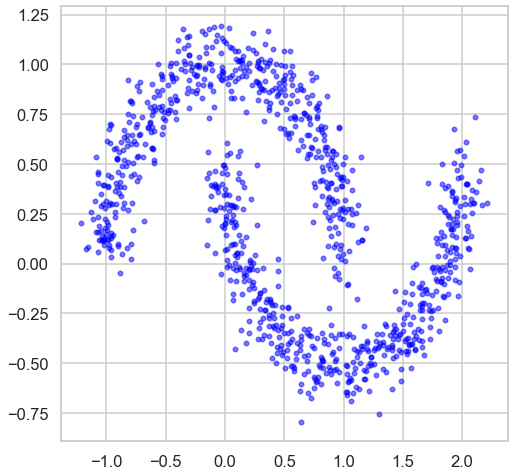

In [10]:
n_samples = 1000
Z, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(Z)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

In [11]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    #color = 'brgcmyk'  #List colors
    color = ['black','blue','red','yellow','green','brown','orange','violet','lightpink','aqua']
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            cluster_points = X[np.array(km[3])==i]
            #plt.scatter(X[km[3]==i,0],X[km[3]==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(cluster_points [ :,0],cluster_points [ :,1] ,c = color[i],alpha = alpha,s=s)
            plt.scatter(km[2][i][0],km[2][i][1],c = color[i], marker = 'x', s = 100)
          

Example 1 using Euclidean Distance:


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


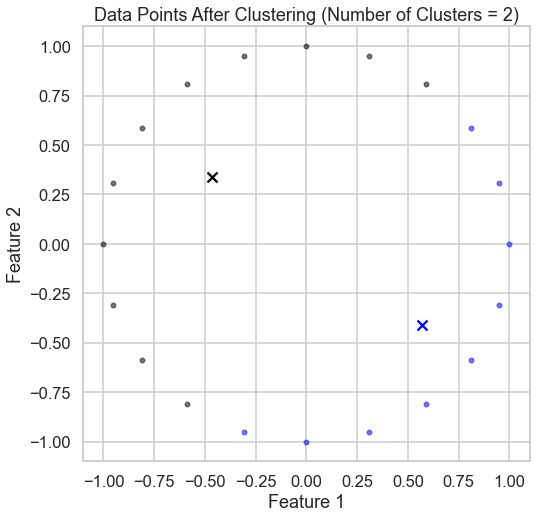


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


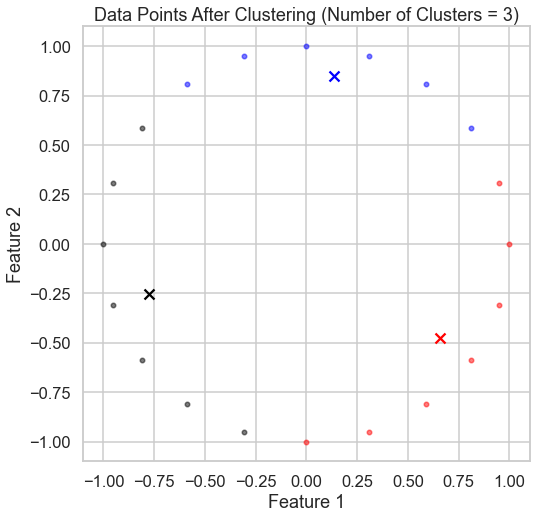


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


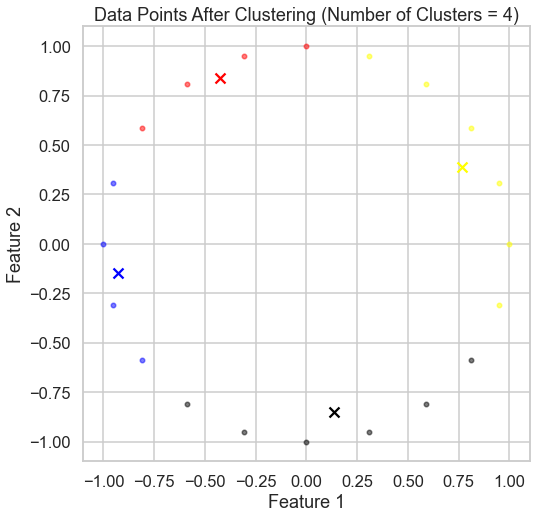


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


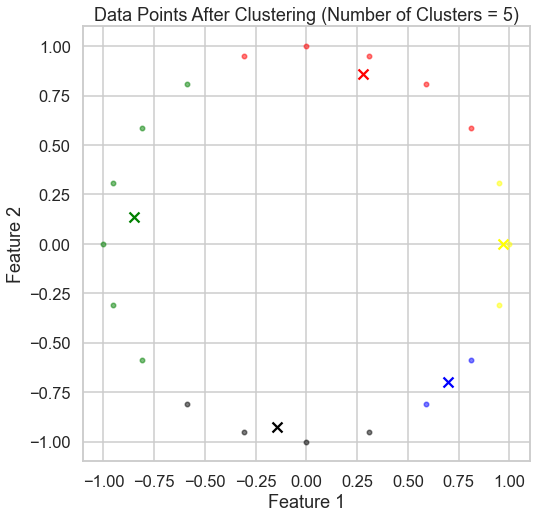


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


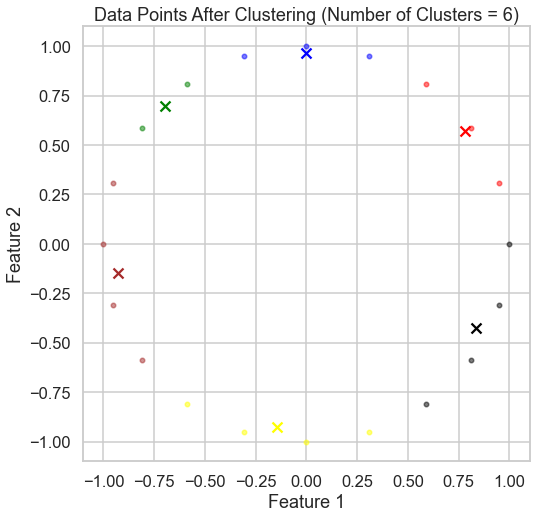


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


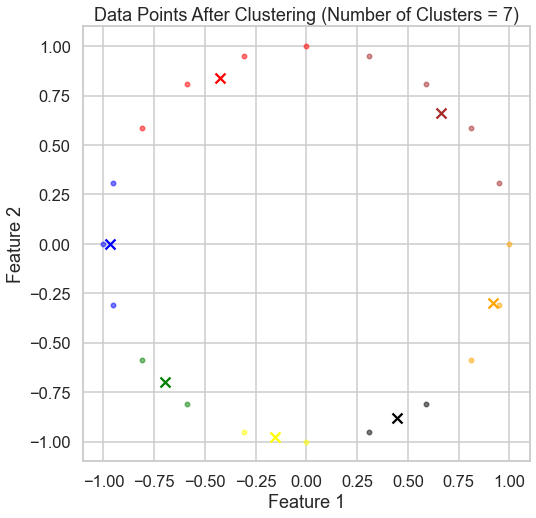


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


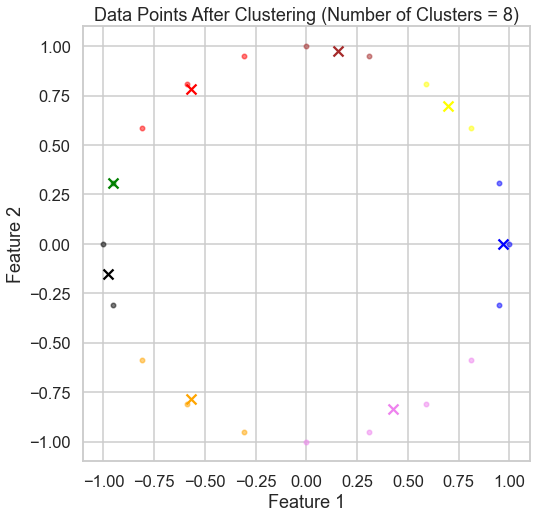


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


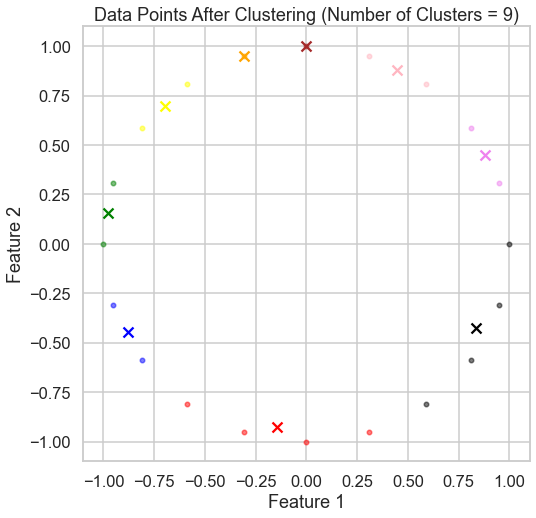


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


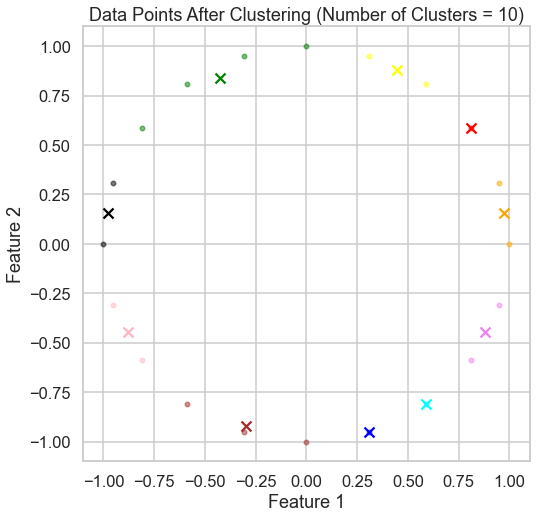

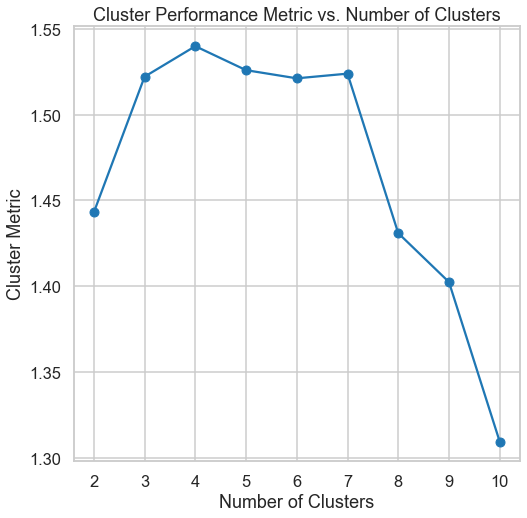


Example 1 using Pearson Distance:


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


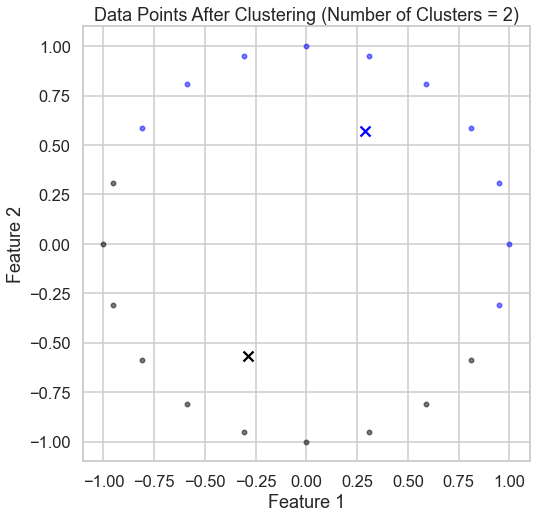


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


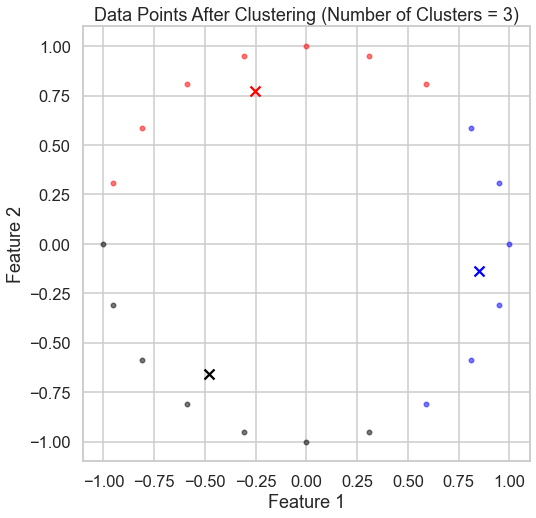


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


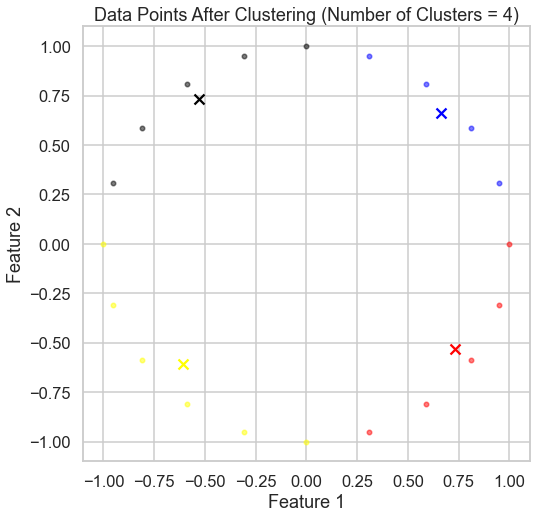


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


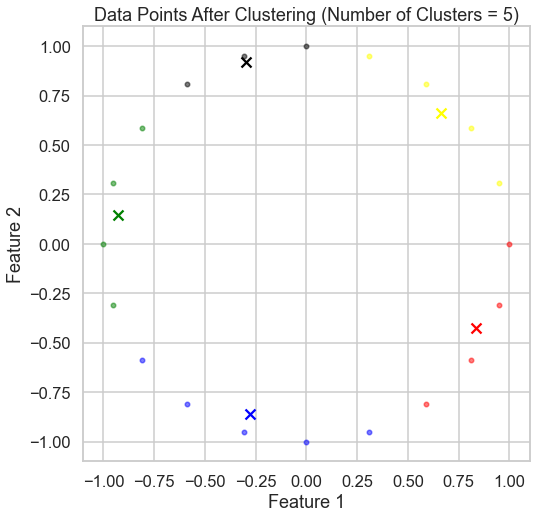


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


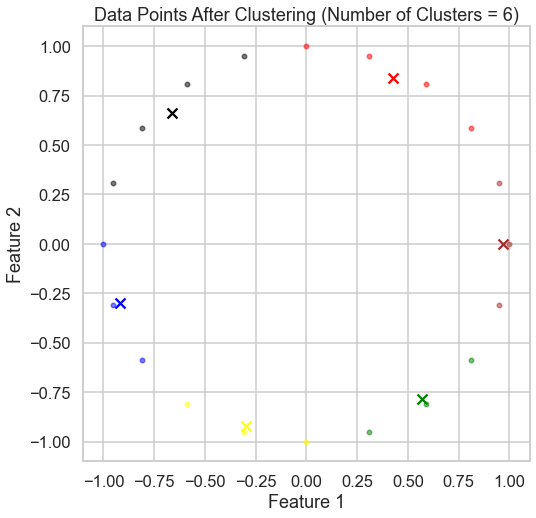


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


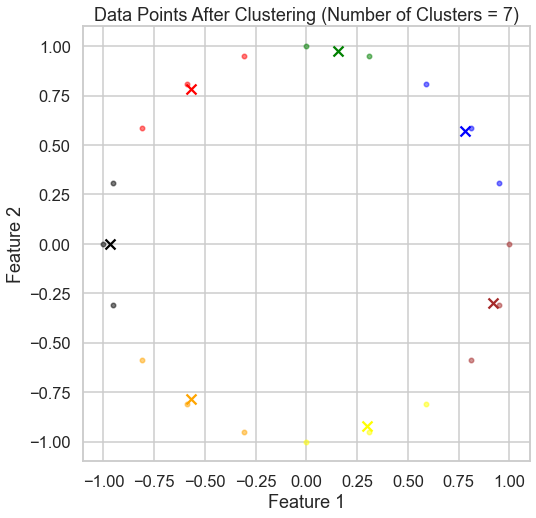


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


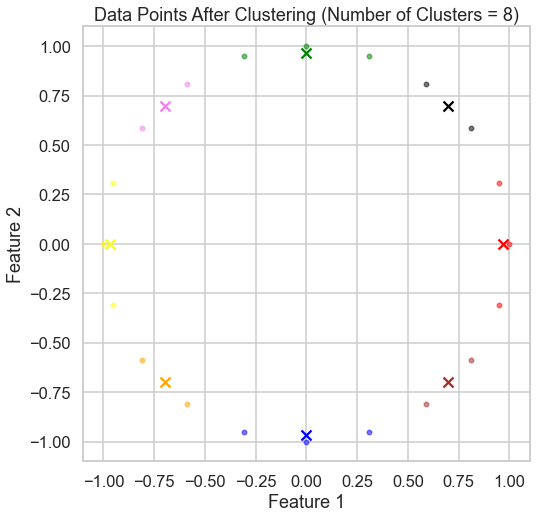


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


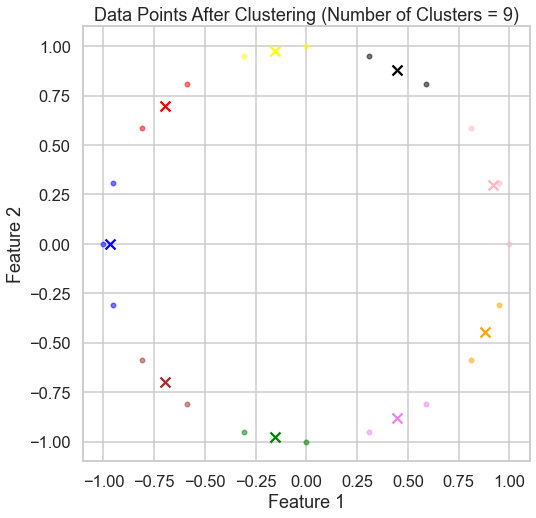


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


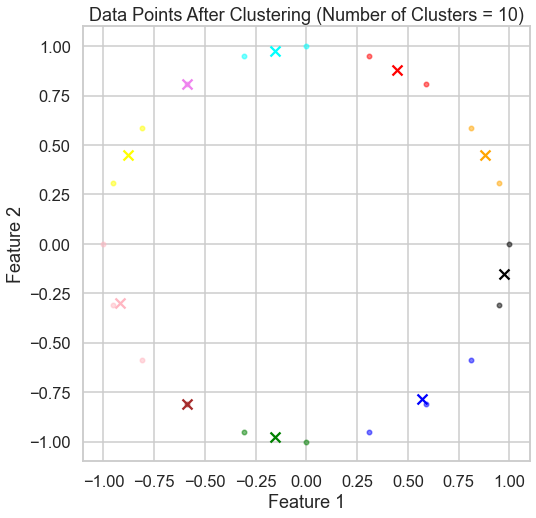

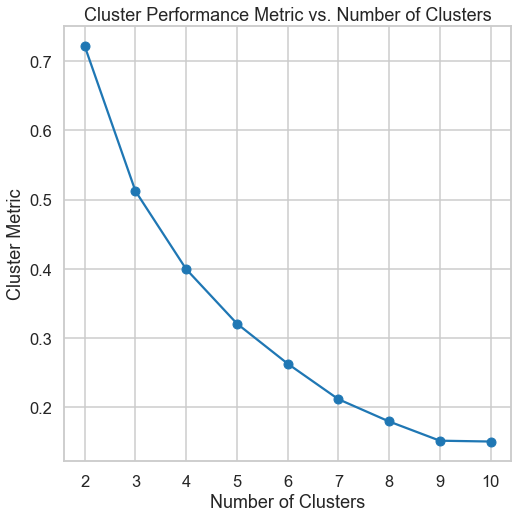

In [12]:
# Euclidean
print("Example 1 using Euclidean Distance:\n")
# Loop over different numbers of clusters
clusters=[]
cluster_metric=[]

for num_clusters in range(2, 11):
    # Apply K-means clustering
    distance_type = 'euclidean'
    km = GUC_Kmean(X, num_clusters, distance_type)
    
    clusters.append(num_clusters)
    cluster_metric.append(km[1])
    # Display clustered data
    display_cluster(X, km, num_clusters=num_clusters)
    
    plt.title(f'Data Points After Clustering (Number of Clusters = {num_clusters})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
    
plt.plot(clusters, cluster_metric , marker='o')
plt.title('Cluster Performance Metric vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show() 
    
# Pearson
print("\nExample 1 using Pearson Distance:\n")
clusters=[]
cluster_metric=[]

for num_clusters in range(2, 11):
    # Apply K-means clustering
    distance_type = 'pearson'
    km = GUC_Kmean(X, num_clusters, distance_type)
    
    clusters.append(num_clusters)
    cluster_metric.append(km[1])
    
    # Display clustered data
    display_cluster(X, km, num_clusters=num_clusters)
    
    plt.title(f'Data Points After Clustering (Number of Clusters = {num_clusters})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
    
plt.plot(clusters, cluster_metric , marker='o')
plt.title('Cluster Performance Metric vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()     

    
   

Example 2 using Euclidean Distance:


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


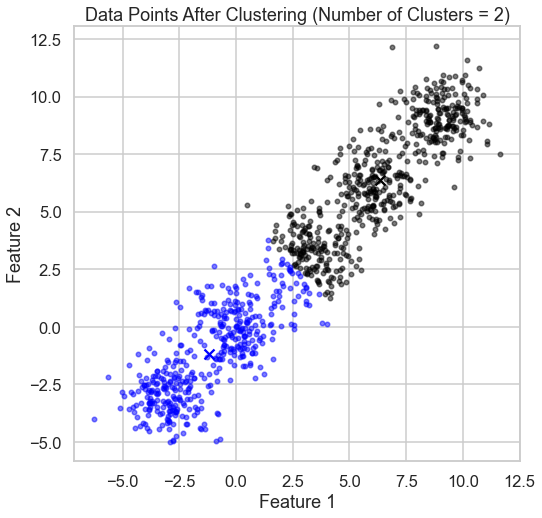


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


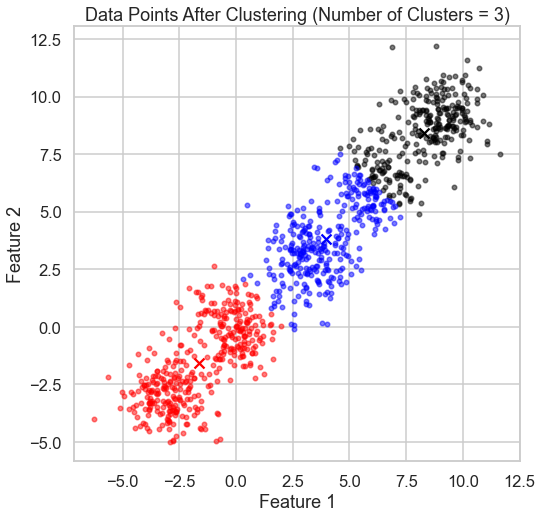


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


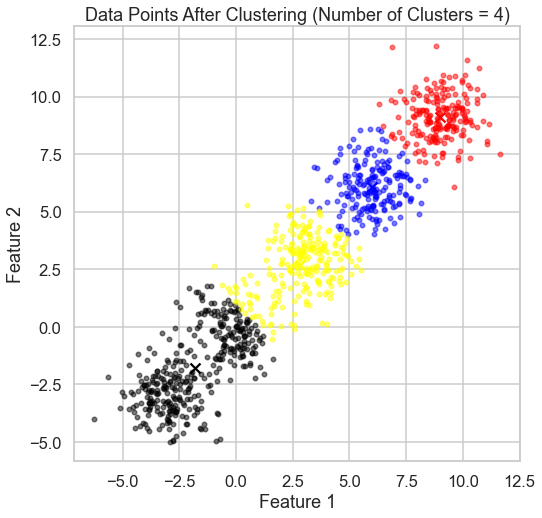


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


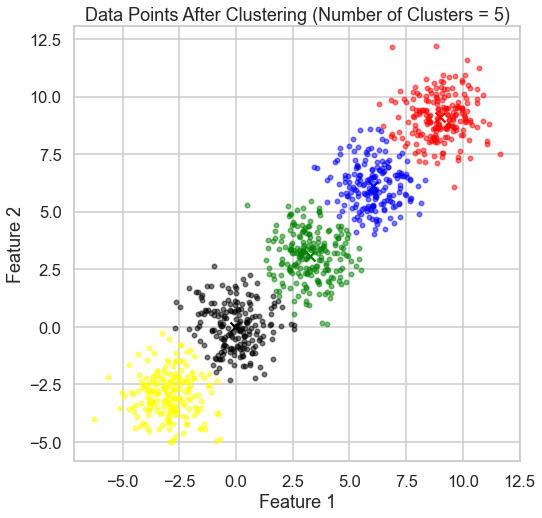


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


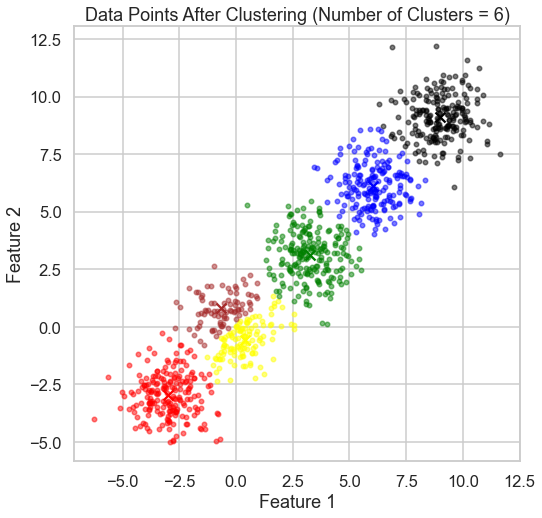


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


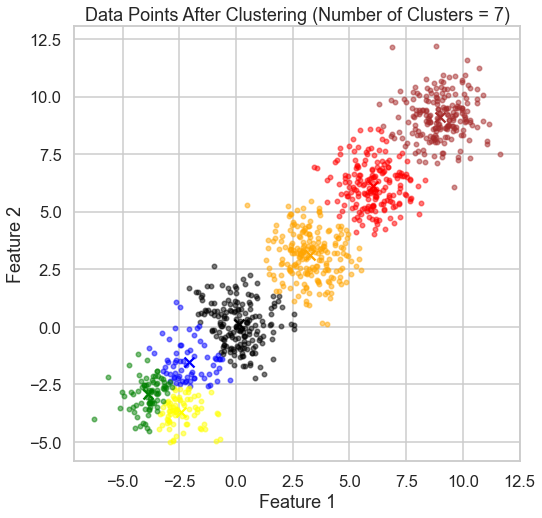


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


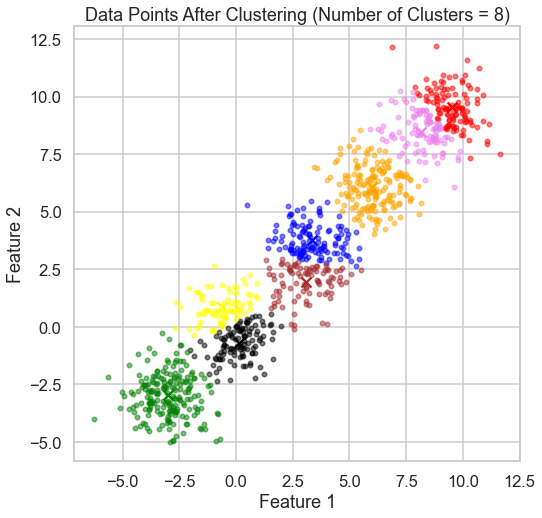


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


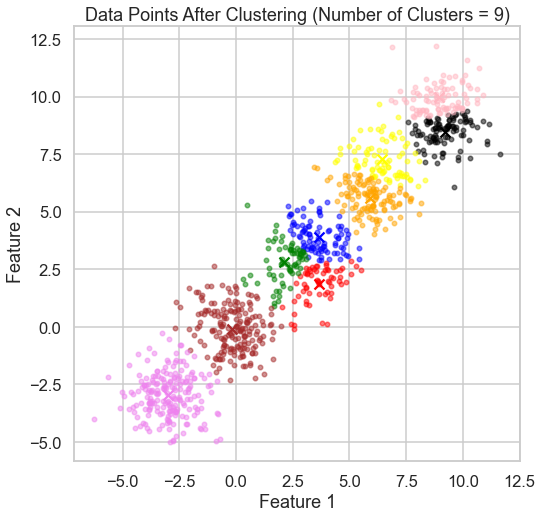


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


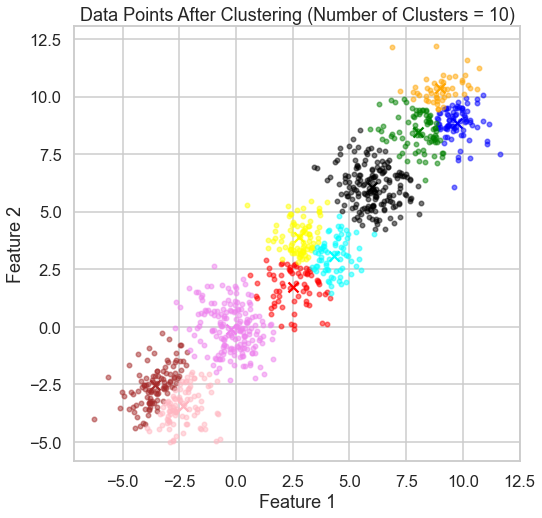

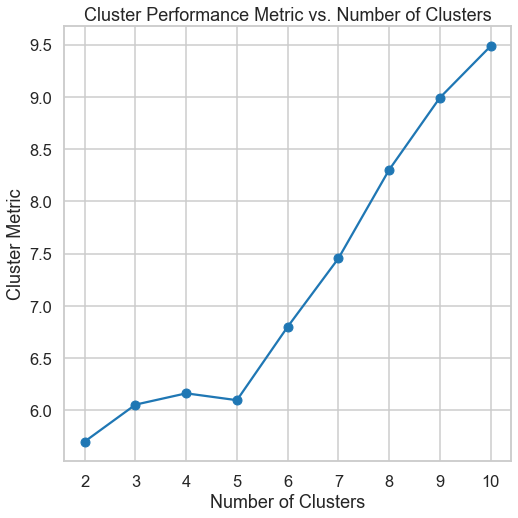


Example 2 using Pearson Distance:


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


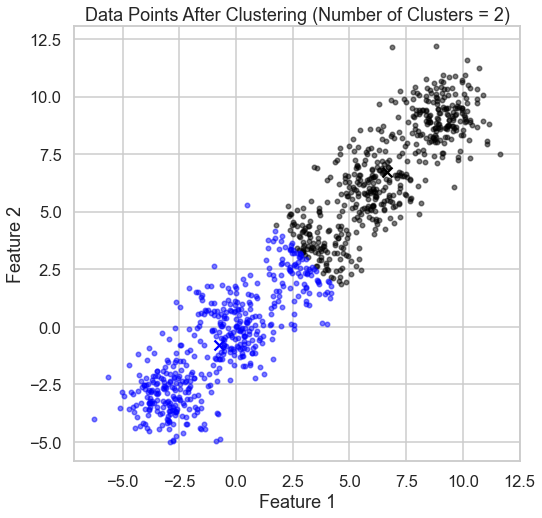


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


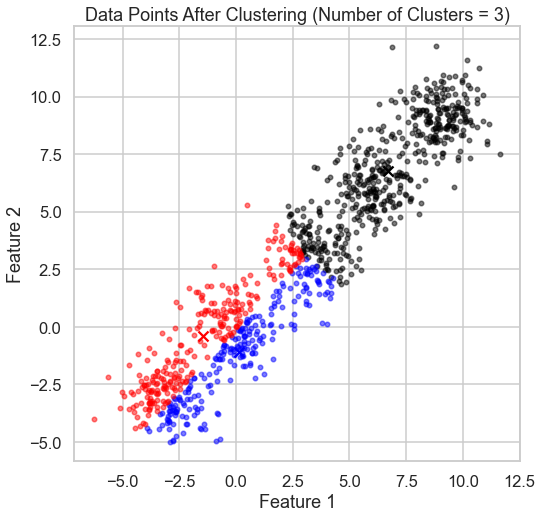


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


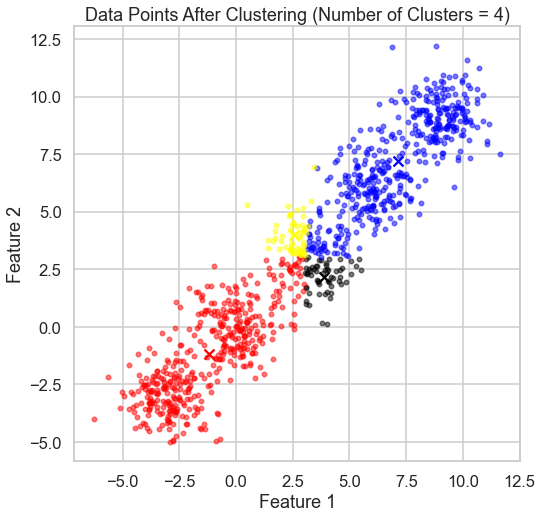


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


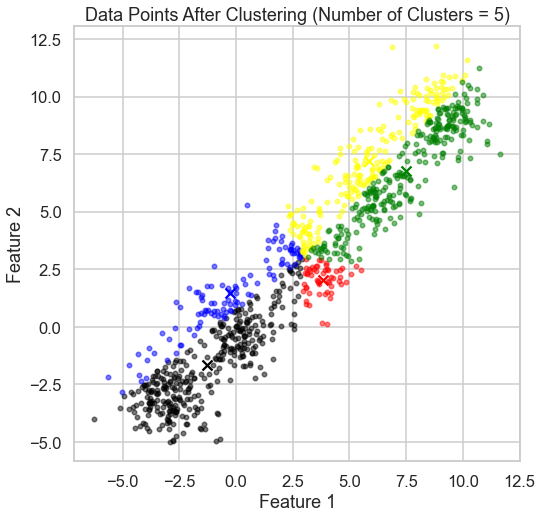


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


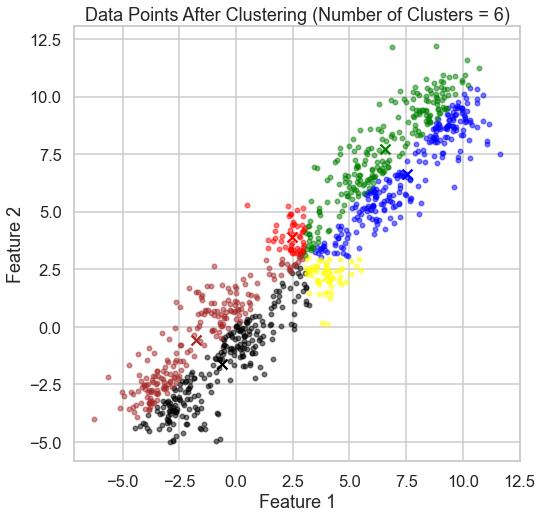


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


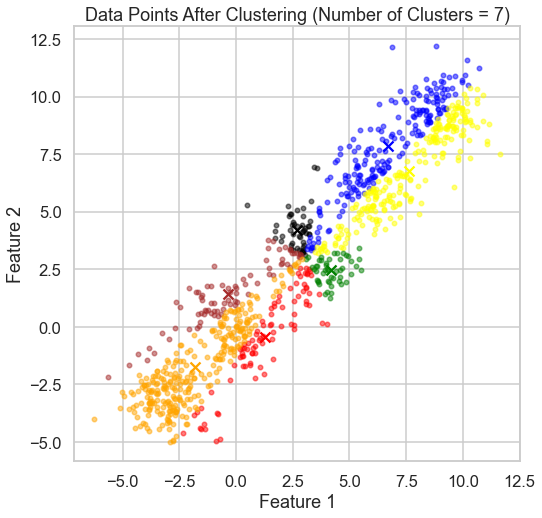


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


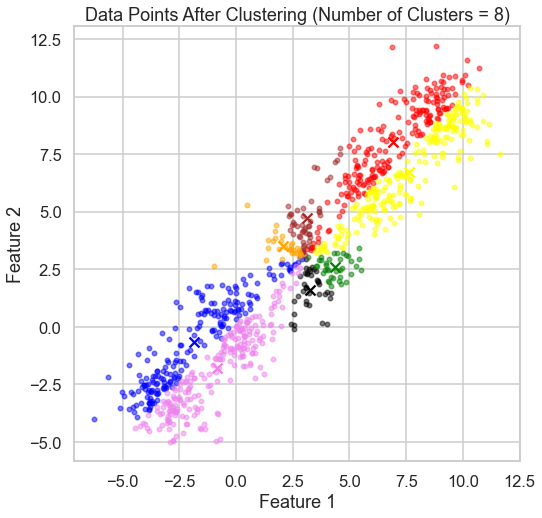


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


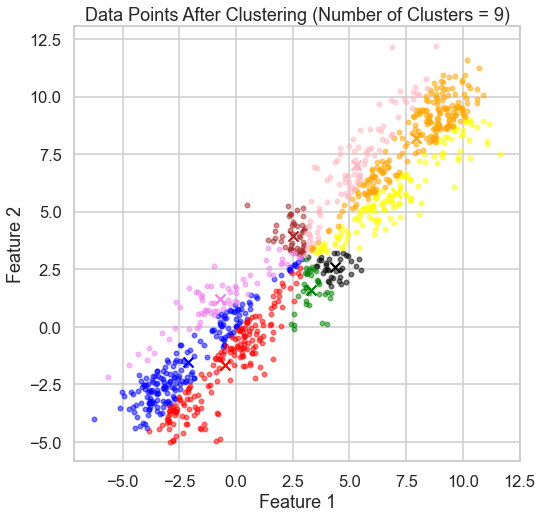


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


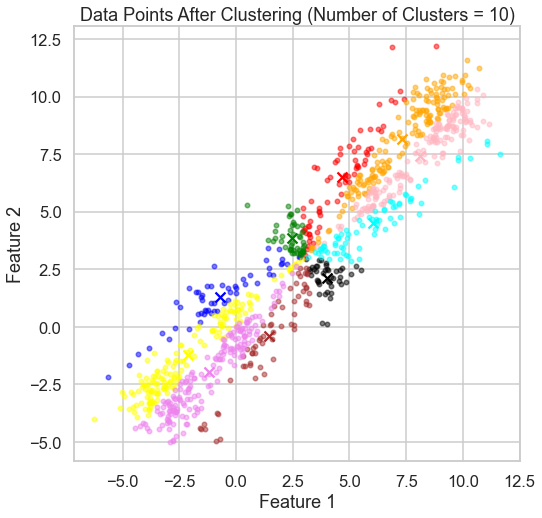

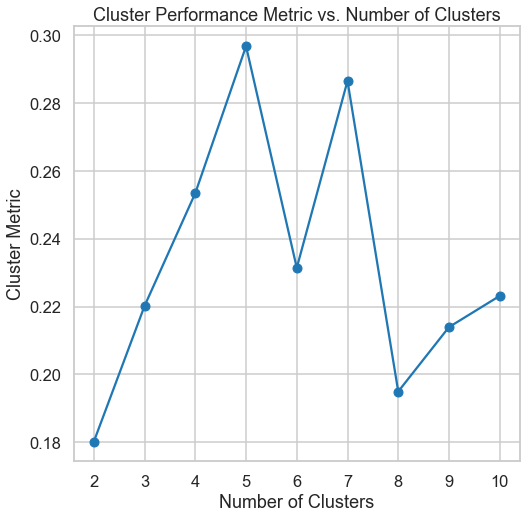

In [13]:
# Euclidean
print("Example 2 using Euclidean Distance:\n")
# Loop over different numbers of clusters
clusters=[]
cluster_metric=[]

for num_clusters in range(2, 11):
    # Apply K-means clustering
    distance_type = 'euclidean'
    km = GUC_Kmean(Y, num_clusters, distance_type)
    
    clusters.append(num_clusters)
    cluster_metric.append(km[1])
    # Display clustered data
    display_cluster(Y, km, num_clusters=num_clusters)
    
    plt.title(f'Data Points After Clustering (Number of Clusters = {num_clusters})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
    
plt.plot(clusters, cluster_metric , marker='o')
plt.title('Cluster Performance Metric vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show() 
    
# Pearson
print("\nExample 2 using Pearson Distance:\n")
clusters=[]
cluster_metric=[]

for num_clusters in range(2, 11):
    # Apply K-means clustering
    distance_type = 'pearson'
    km = GUC_Kmean(Y, num_clusters, distance_type)
    
    clusters.append(num_clusters)
    cluster_metric.append(km[1])
    
    # Display clustered data
    display_cluster(Y, km, num_clusters=num_clusters)
    
    plt.title(f'Data Points After Clustering (Number of Clusters = {num_clusters})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
    
plt.plot(clusters, cluster_metric , marker='o')
plt.title('Cluster Performance Metric vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()     

    
   

Example 3 using Euclidean Distance:


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


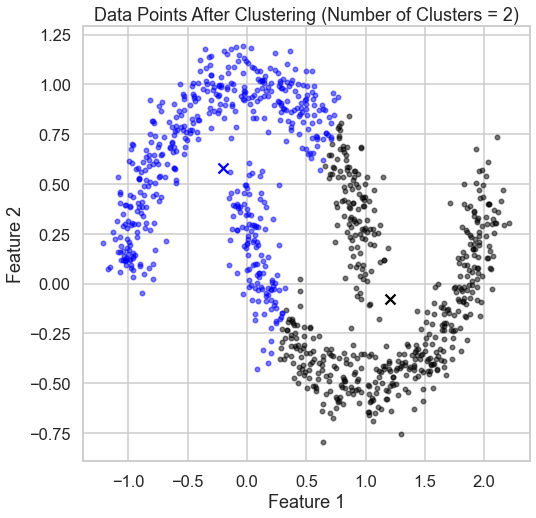


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


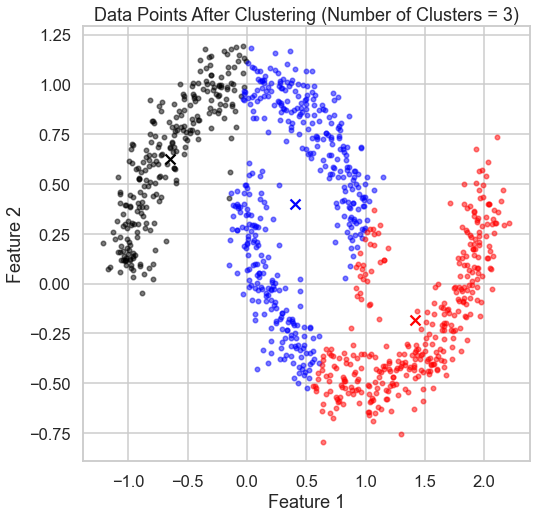


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


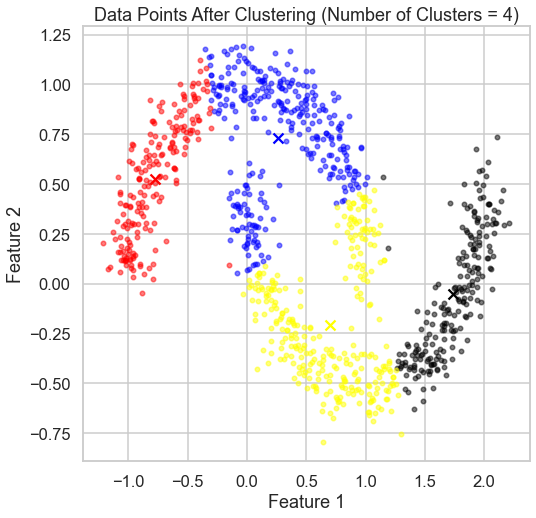


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


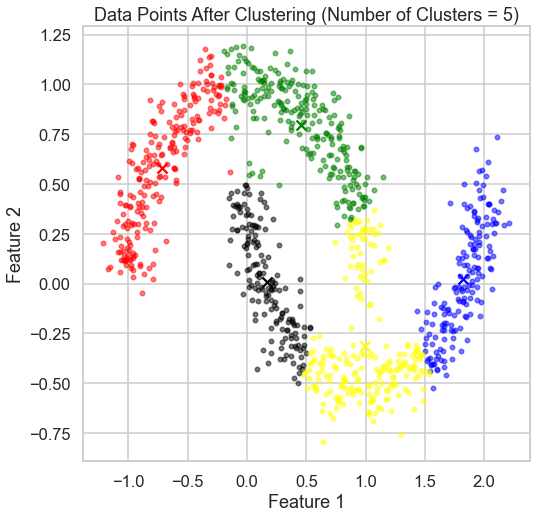


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


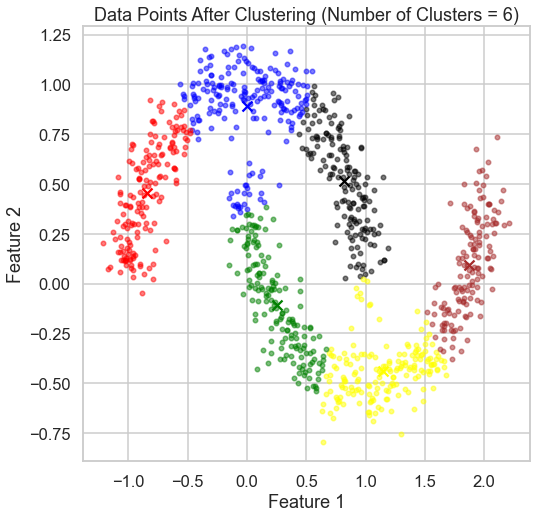


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


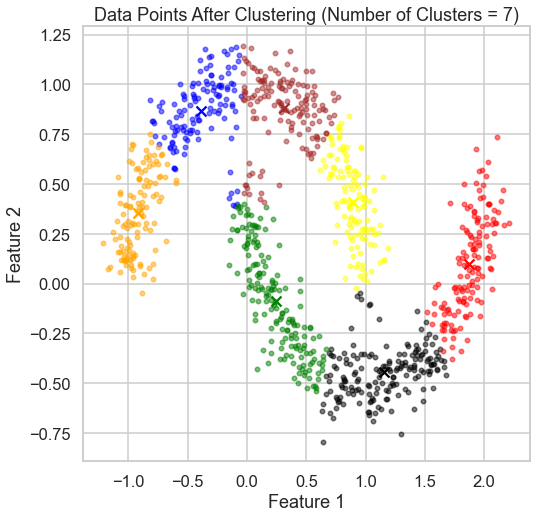


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


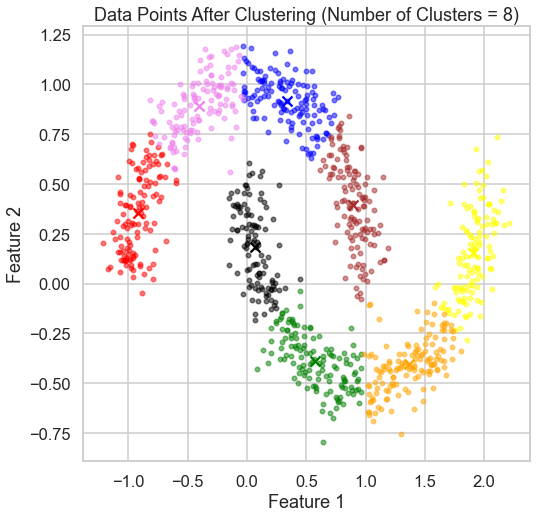


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


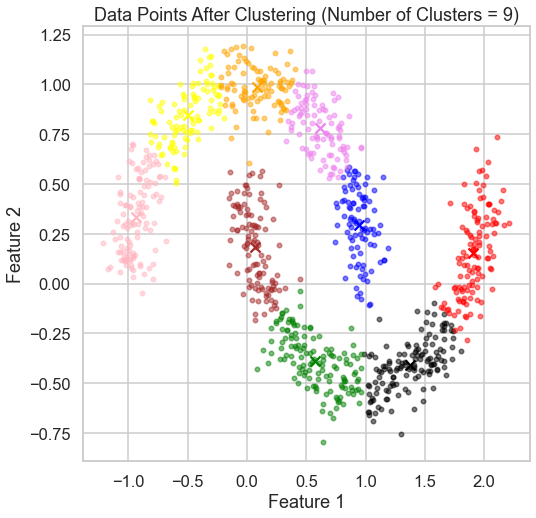


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


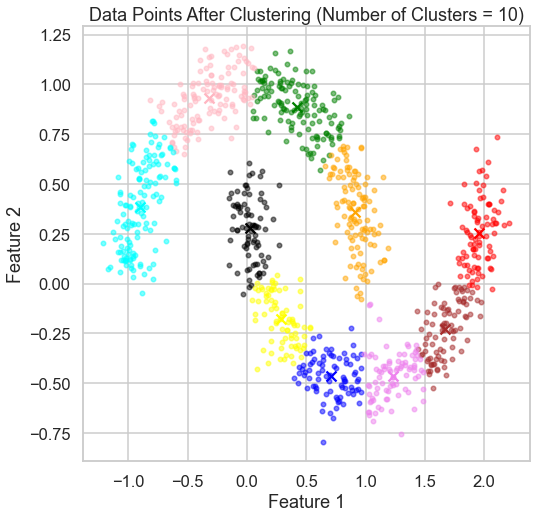

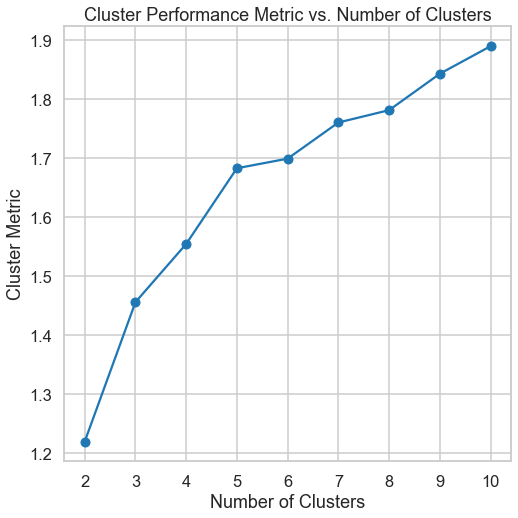


Example 3 using Pearson Distance:


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


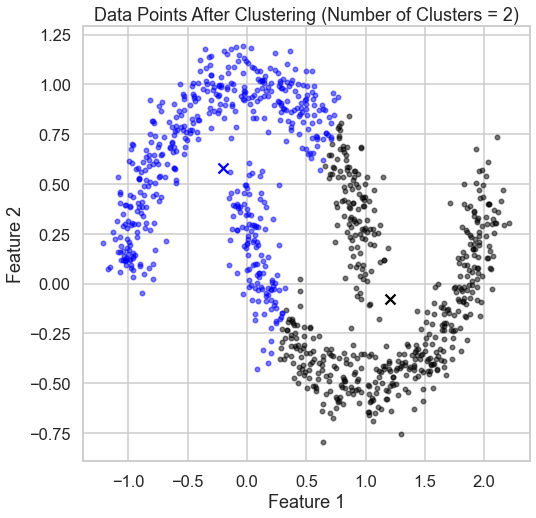


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


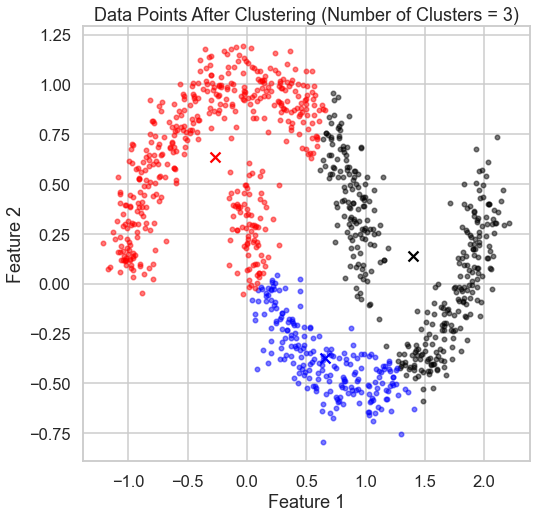


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


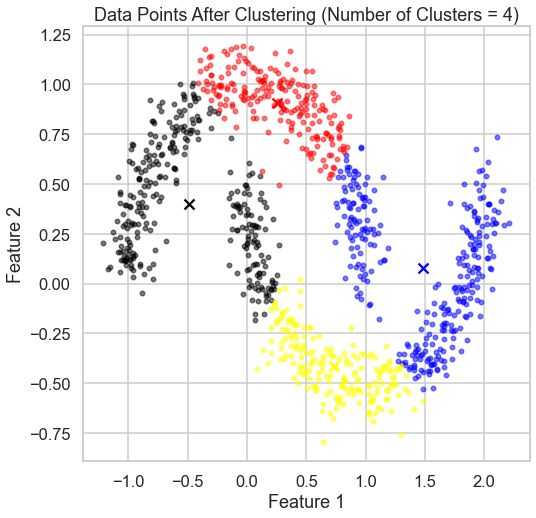


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


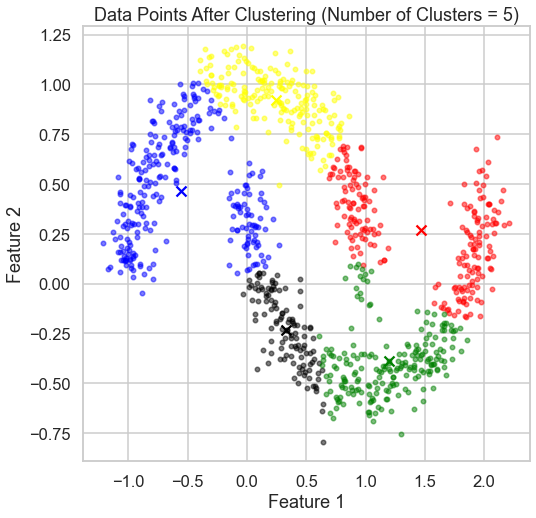


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


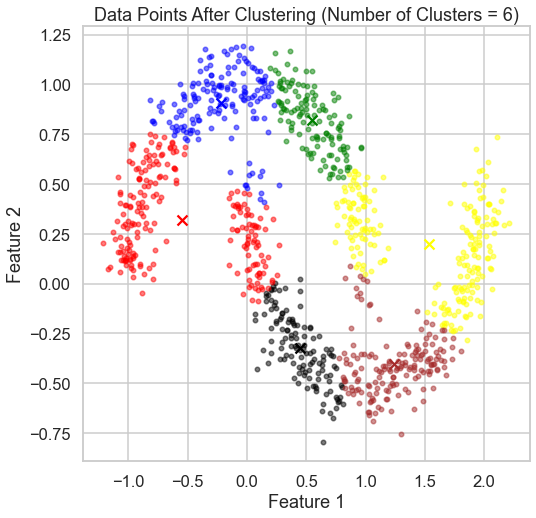


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


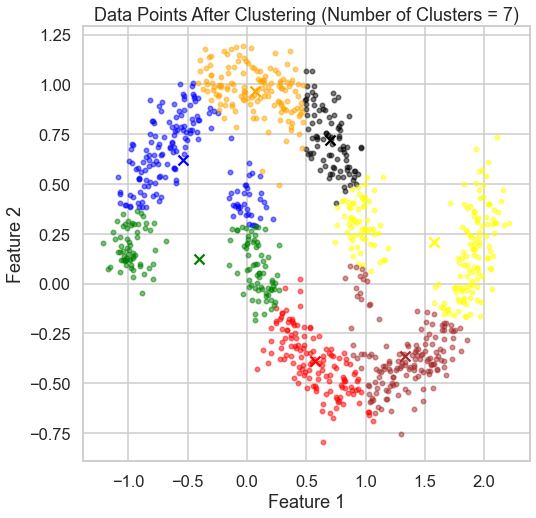


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


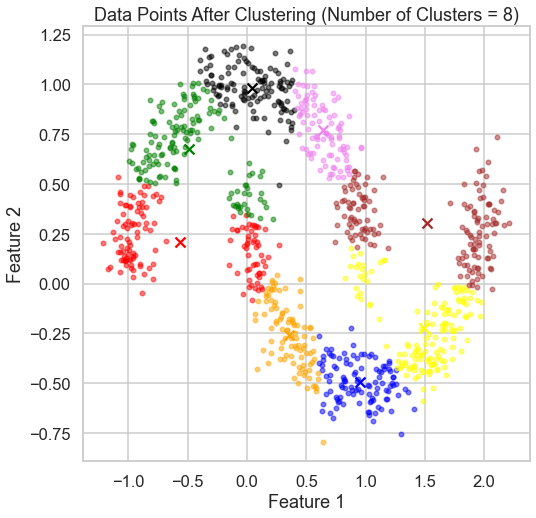


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


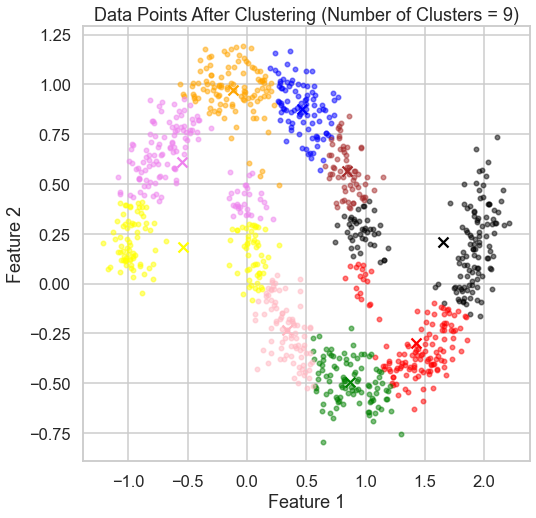


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


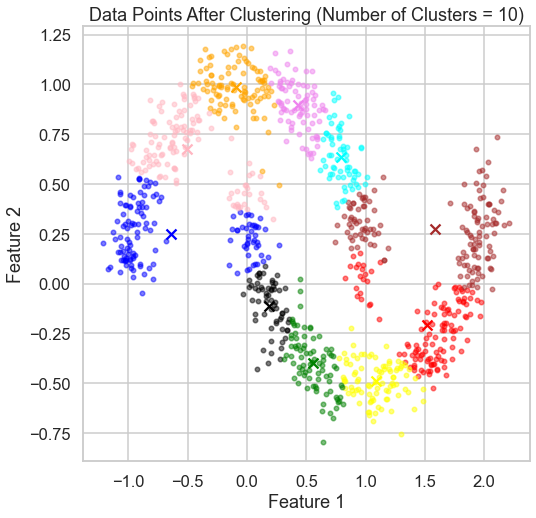

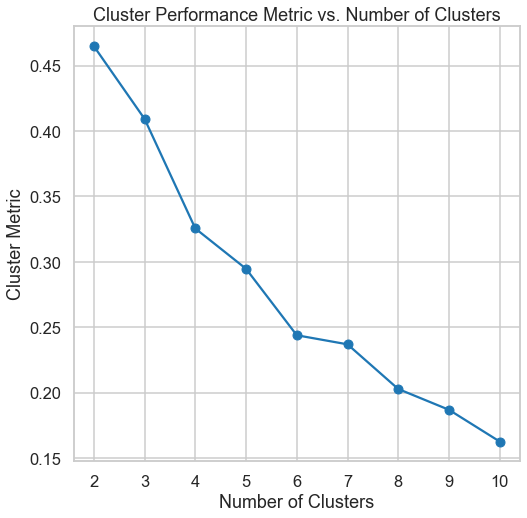

In [14]:
# Euclidean
print("Example 3 using Euclidean Distance:\n")
# Loop over different numbers of clusters
clusters=[]
cluster_metric=[]

for num_clusters in range(2, 11):
    # Apply K-means clustering
    distance_type = 'euclidean'
    km = GUC_Kmean(Z, num_clusters, distance_type)
    
    clusters.append(num_clusters)
    cluster_metric.append(km[1])
    # Display clustered data
    display_cluster(Z, km, num_clusters=num_clusters)
    
    plt.title(f'Data Points After Clustering (Number of Clusters = {num_clusters})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
    
plt.plot(clusters, cluster_metric , marker='o')
plt.title('Cluster Performance Metric vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show() 
    
# Pearson
print("\nExample 3 using Pearson Distance:\n")

clusters=[]
cluster_metric=[]

for num_clusters in range(2, 11):
    # Apply K-means clustering
    distance_type = 'pearson'
    km = GUC_Kmean(Z, num_clusters, distance_type)
    
    clusters.append(num_clusters)
    cluster_metric.append(km[1])
    
    # Display clustered data
    display_cluster(Z, km, num_clusters=num_clusters)
    
    plt.title(f'Data Points After Clustering (Number of Clusters = {num_clusters})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()
    
plt.plot(clusters, cluster_metric , marker='o')
plt.title('Cluster Performance Metric vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Metric')
plt.show()     

    
   

In [15]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.datasets import make_moons
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

# # Define the GUC_Kmean function here...

# # Calculate the silhouette score for a given clustering
# def calculate_silhouette(X, labels):
#     return silhouette_score(X, labels)

# # Vary the number of clusters and record silhouette scores
# num_clusters_range = range(2, 10)  # Try different numbers of clusters
# silhouette_scores = []

# for num_clusters in num_clusters_range:
#     km = KMeans(n_clusters=num_clusters, random_state=42).fit(X)
#     final_cluster_distances, _ = GUC_Kmean(X, num_clusters, 'euclidean')
#     silhouette = calculate_silhouette(X, km.labels_)
#     silhouette_scores.append(silhouette)

# # Plot the Cluster Performance Metric (Silhouette Score) versus the Number of Clusters
# plt.plot(num_clusters_range, silhouette_scores, marker='o')
# plt.title('Cluster Performance Metric vs. Number of Clusters')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Silhouette Score')
# plt.show()


## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

In [43]:
customer_df = pd.read_csv('/Users/mahmoudelnakib/Desktop/Machine Learning/Assignment 1/Customer data.csv')

In [44]:
customer_df

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...,...
1995,100001996,1,0,47,1,123525,0,0
1996,100001997,1,1,27,1,117744,1,0
1997,100001998,0,0,31,0,86400,0,0
1998,100001999,1,1,24,1,97968,0,0


In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


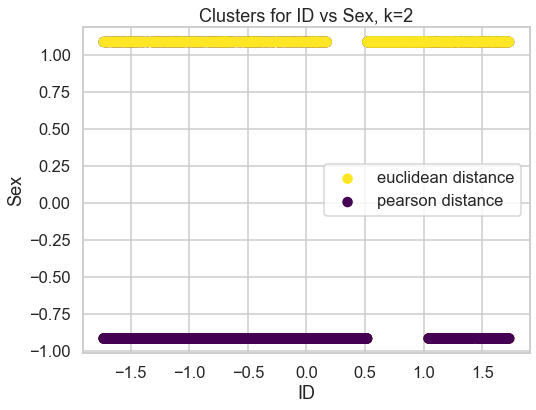


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


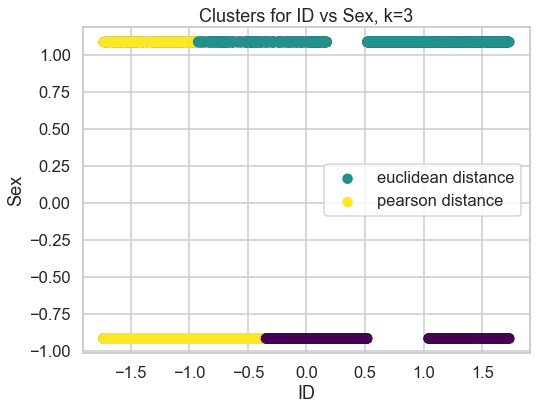


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


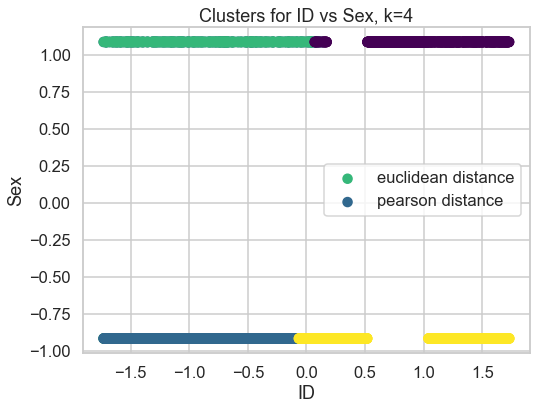


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


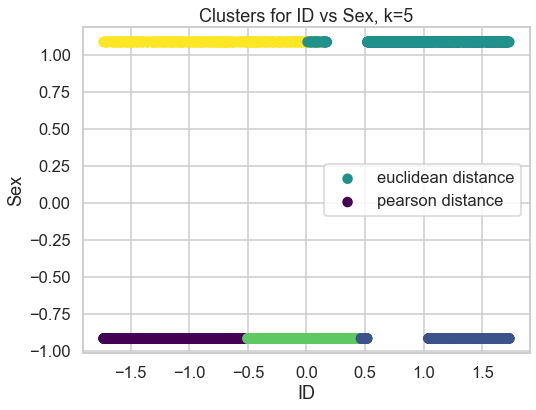


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


/Users/mahmoudelnakib/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mahmoudelnakib/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/mahmoudelnakib/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


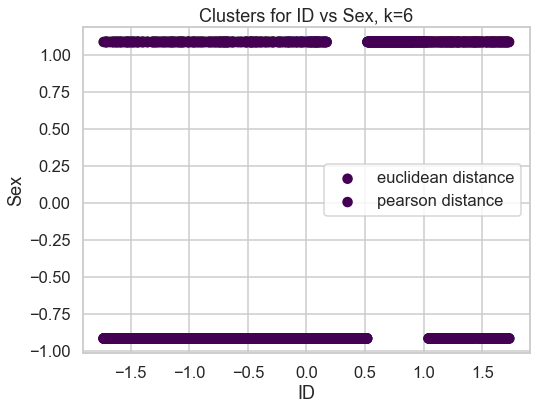


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


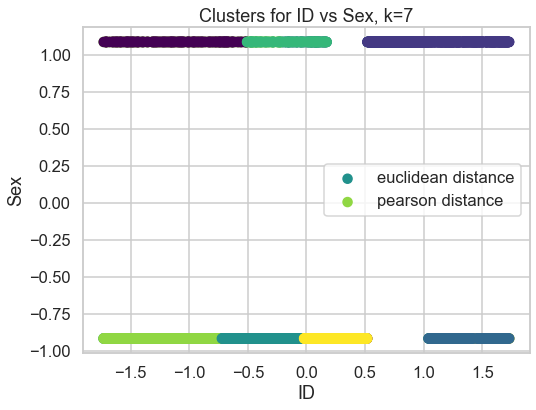


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


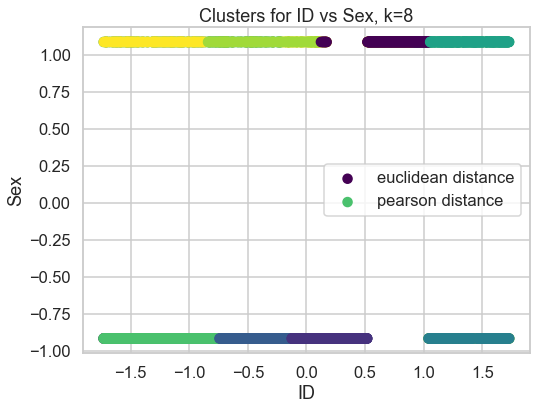


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


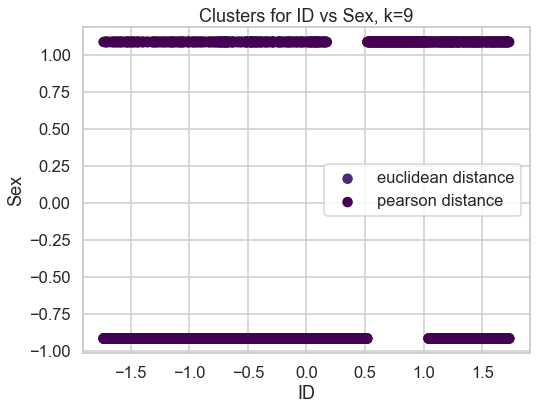


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


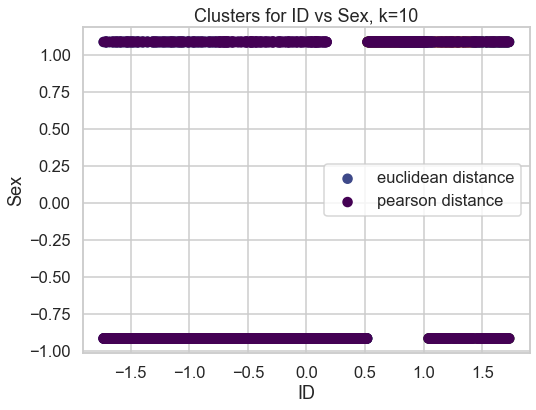


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


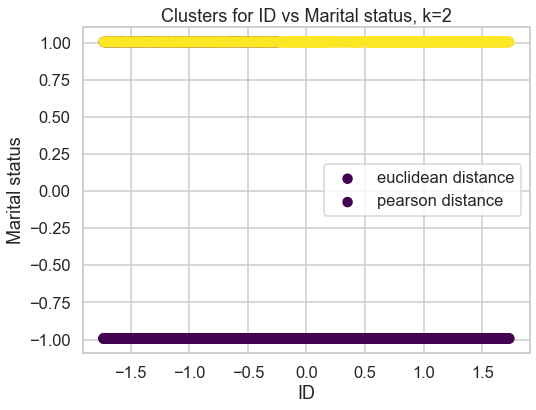


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


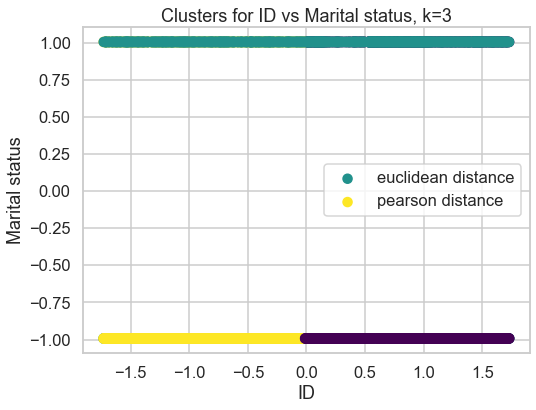


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


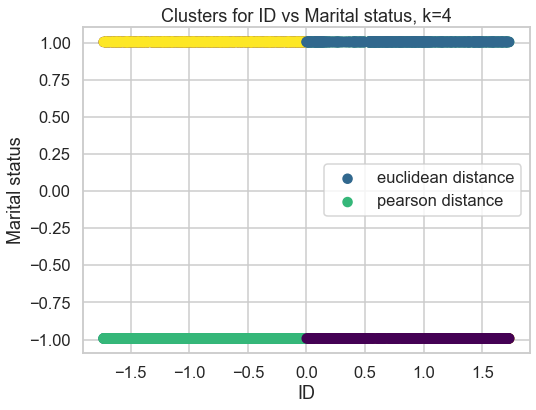


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


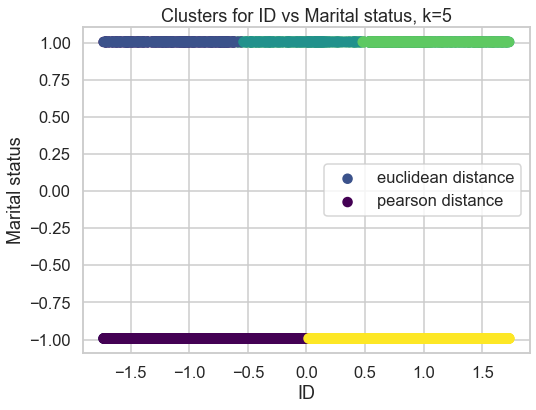


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


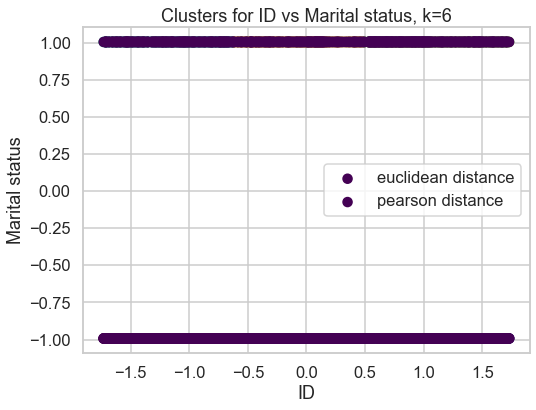


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


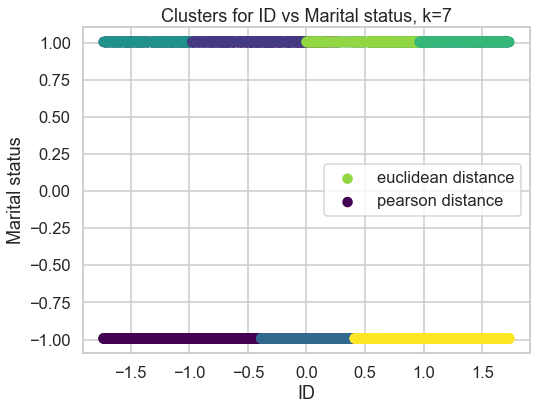


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


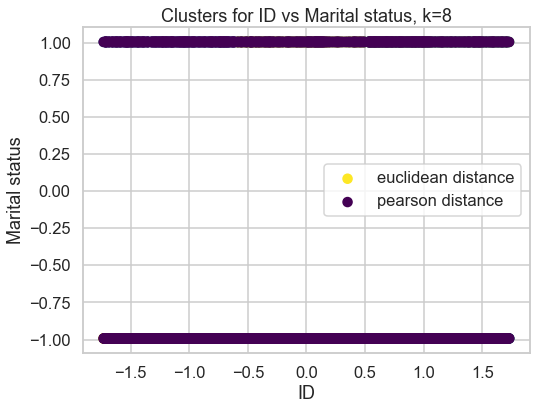


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


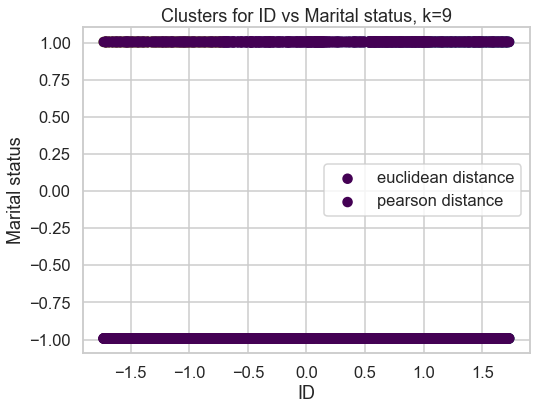


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


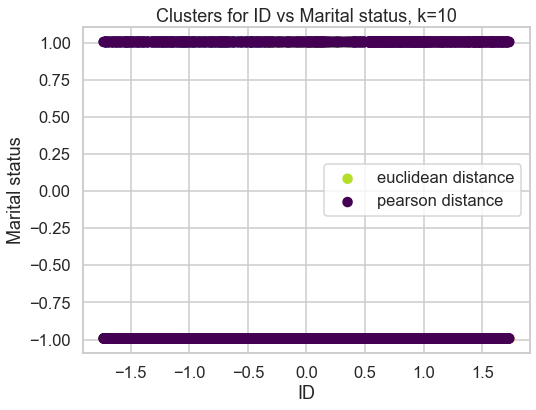


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


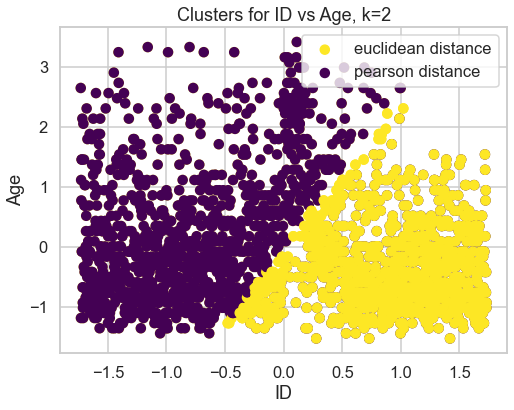


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


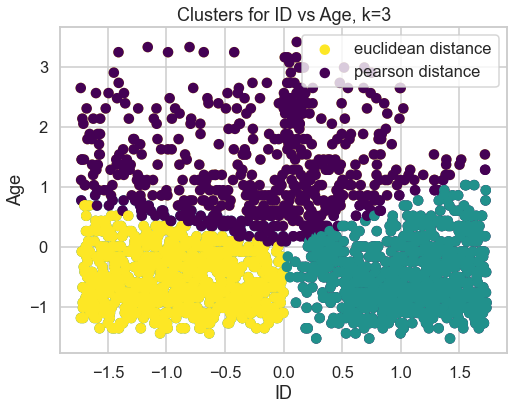


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


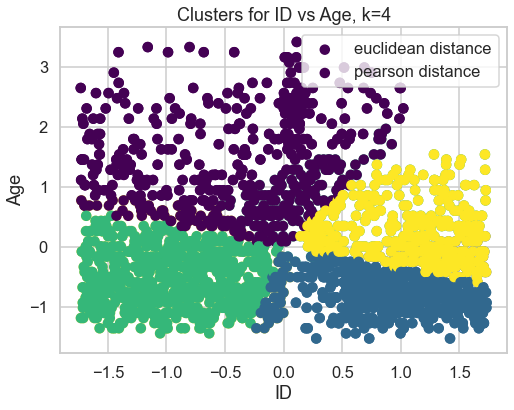


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


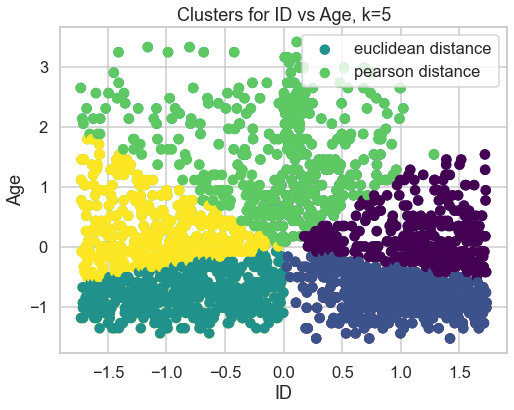


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


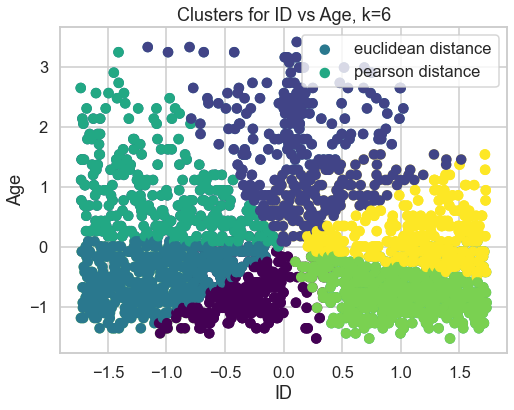


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


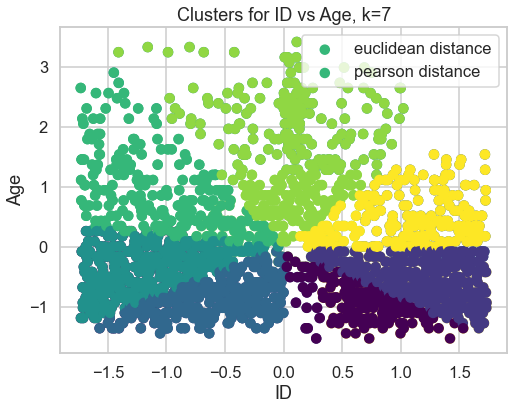


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


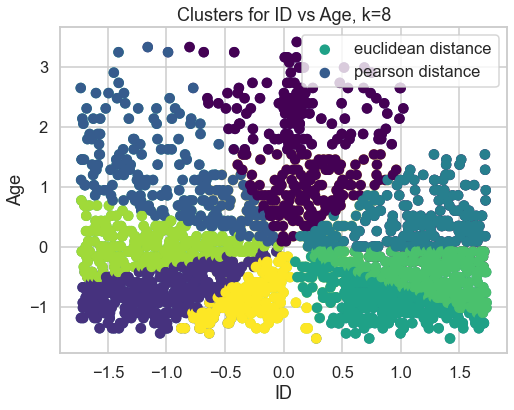


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


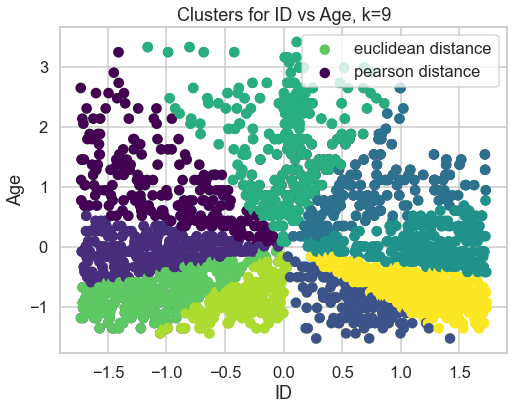


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


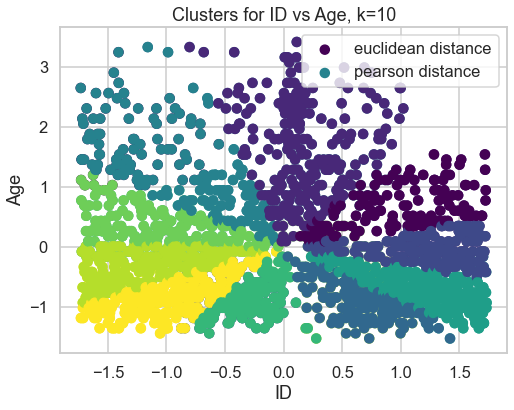


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


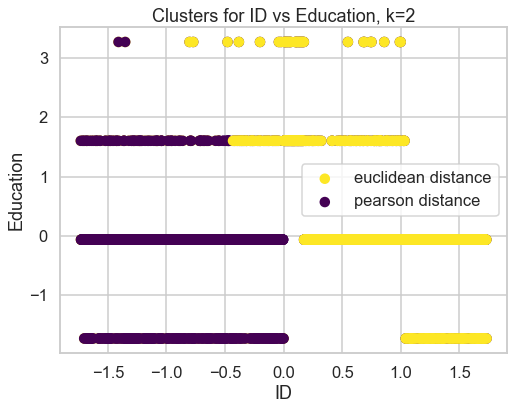


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


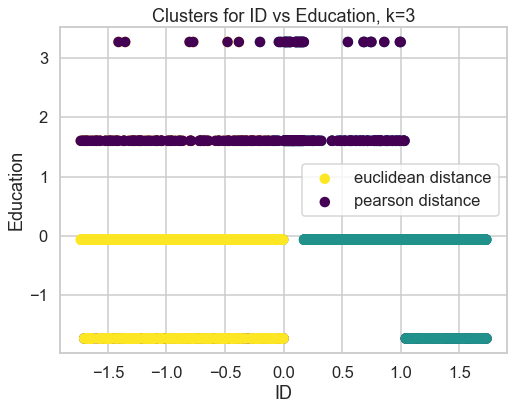


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


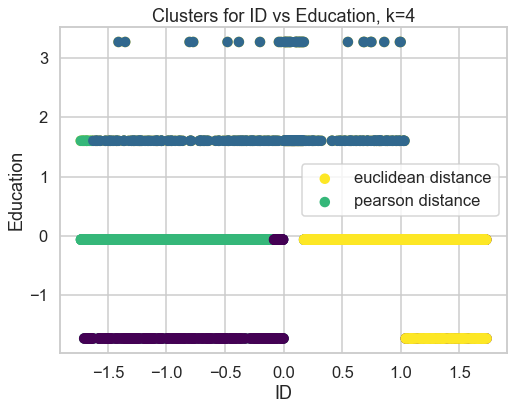


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


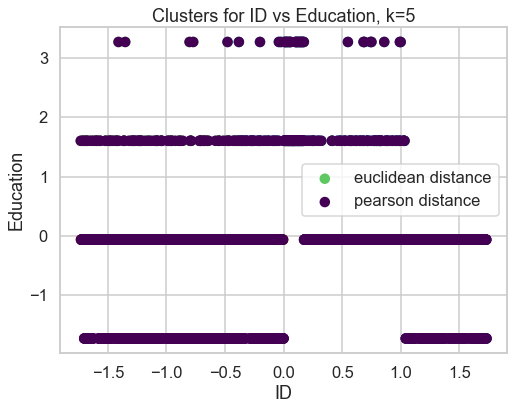


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


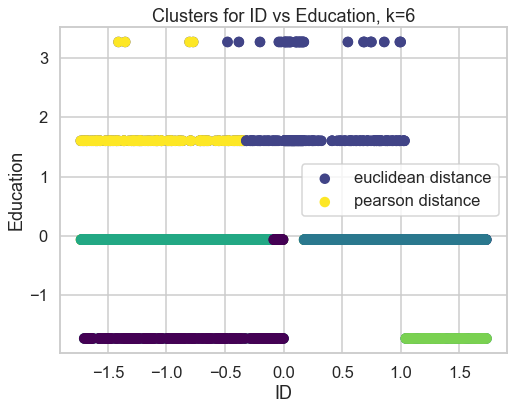


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


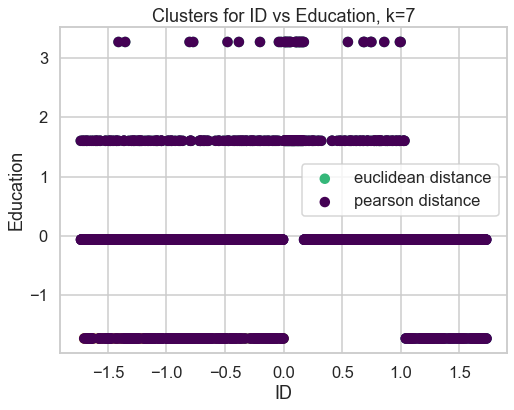


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


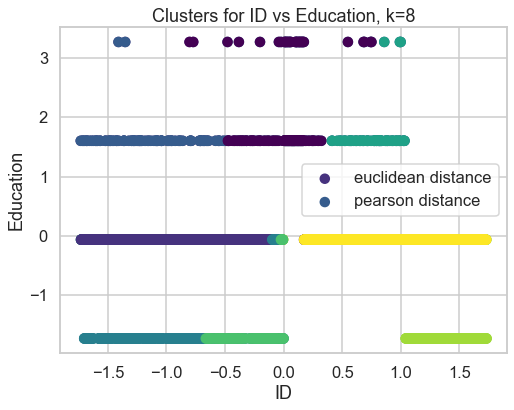


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


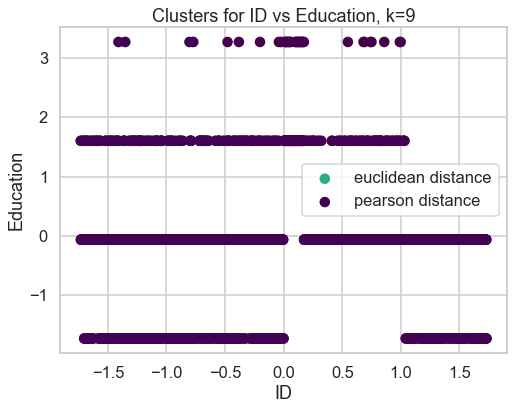


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


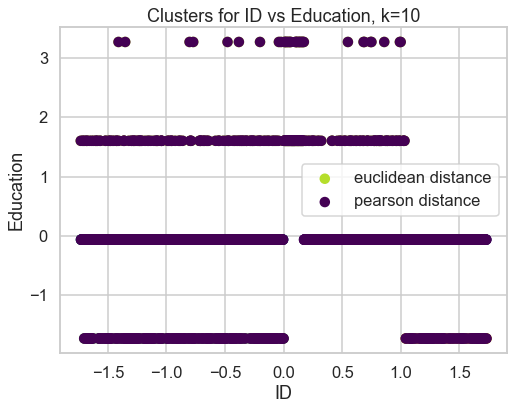


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


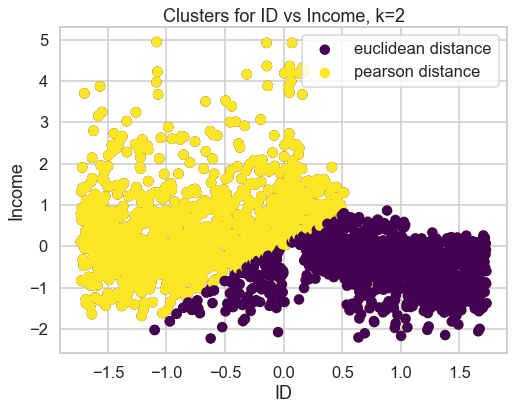


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


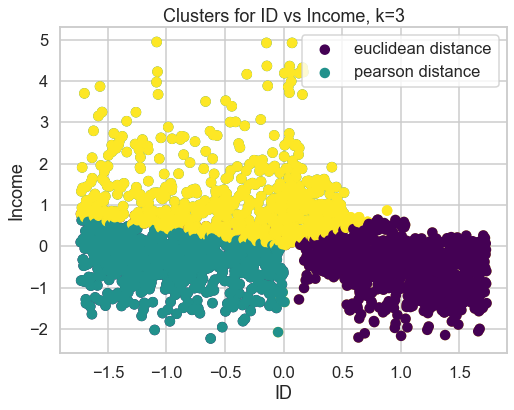


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


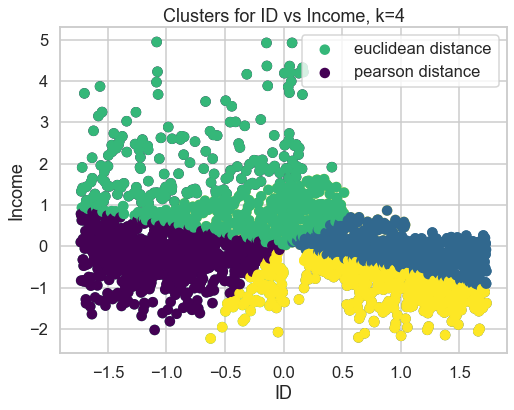


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


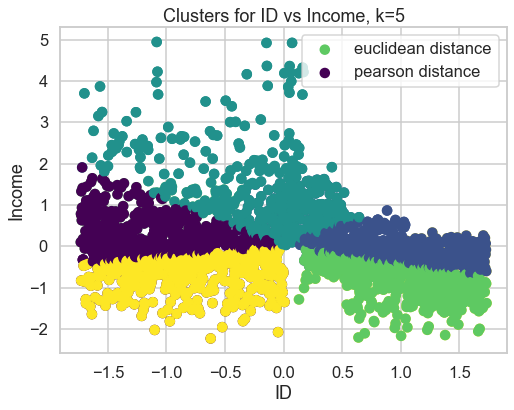


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


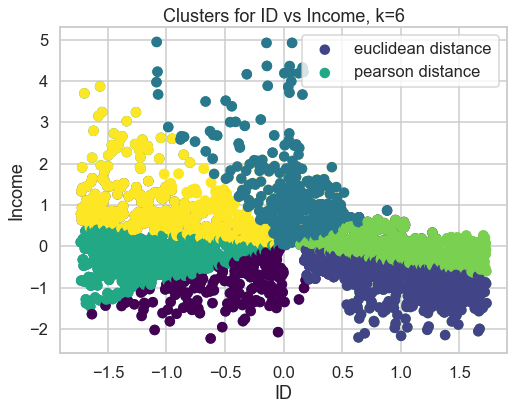


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


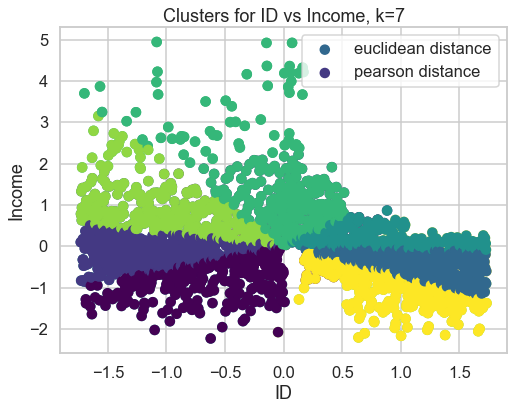


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


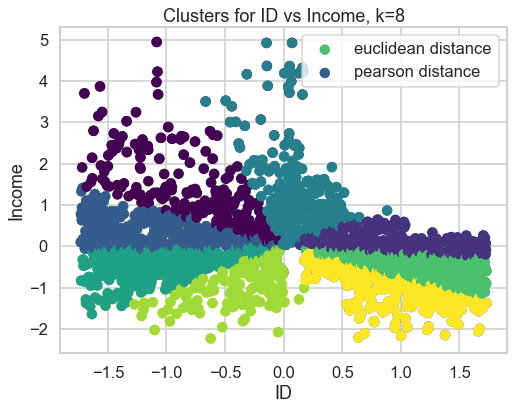


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


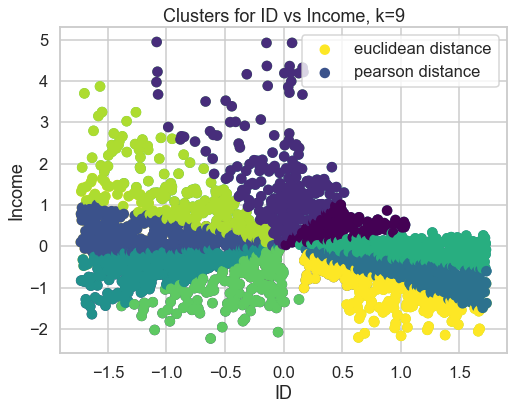


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


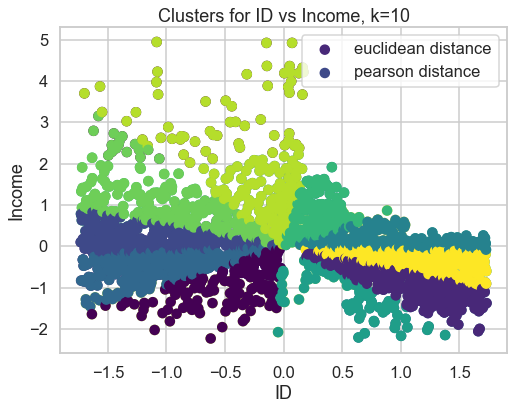


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


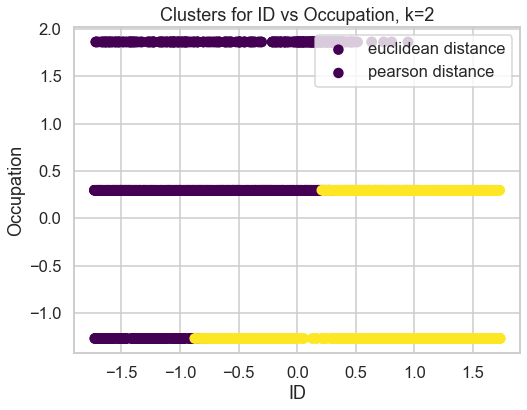


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


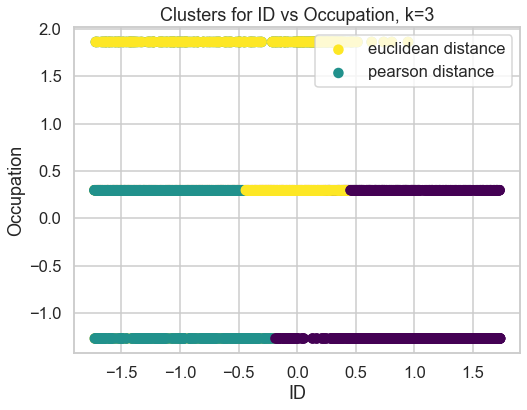


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


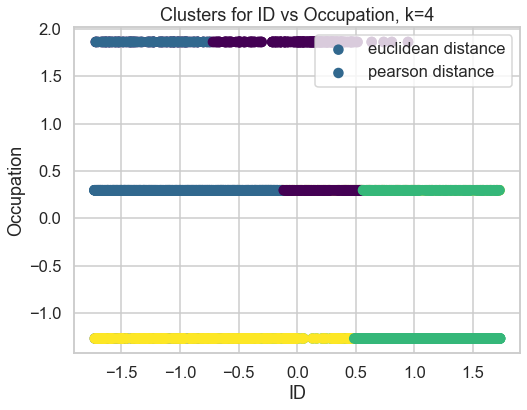


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


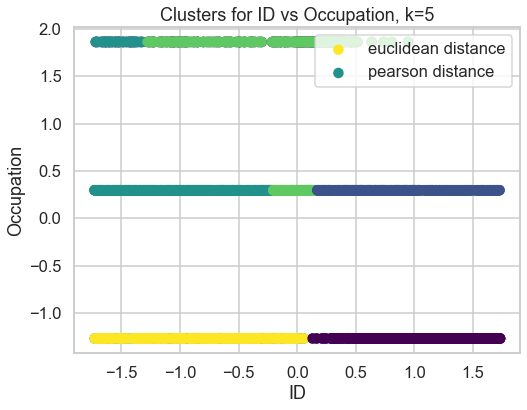


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


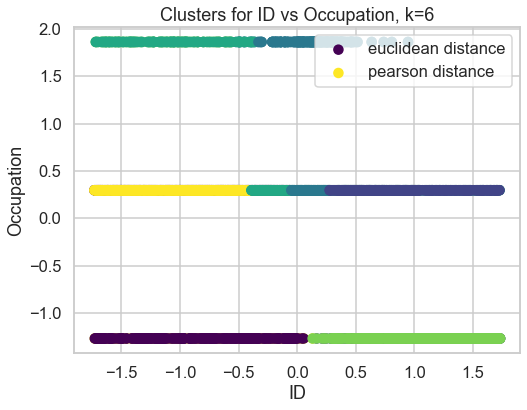


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


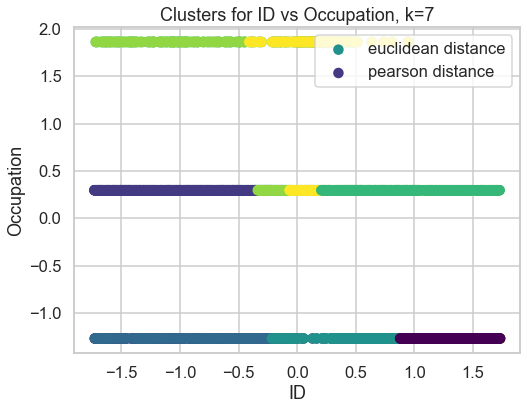


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


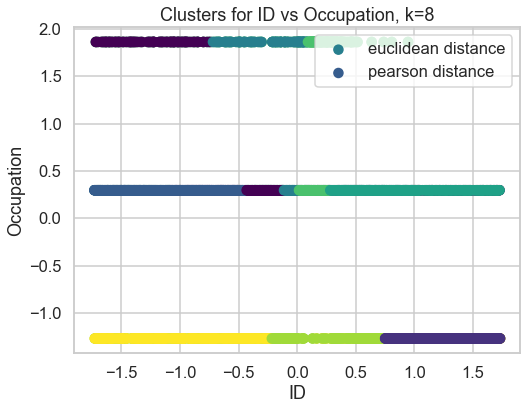


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


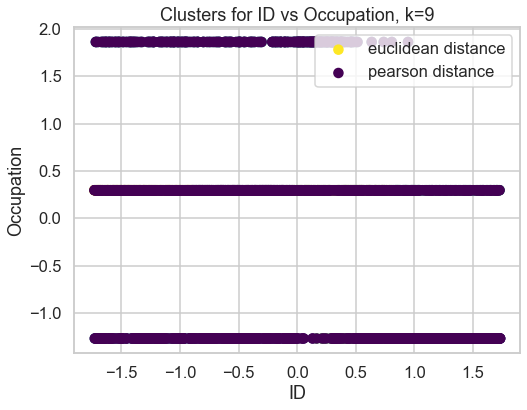


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


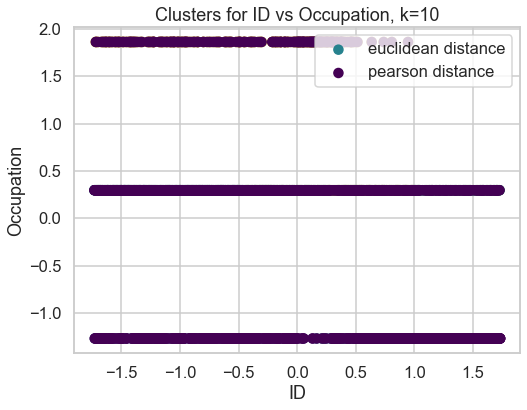


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


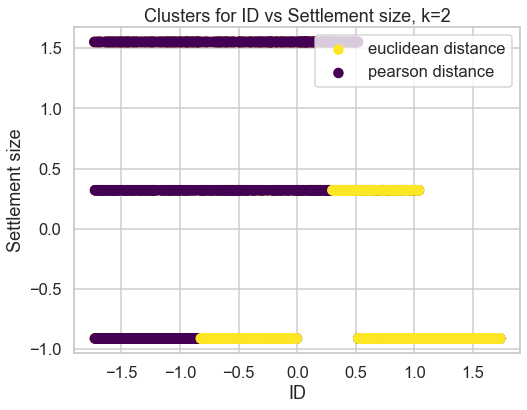


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


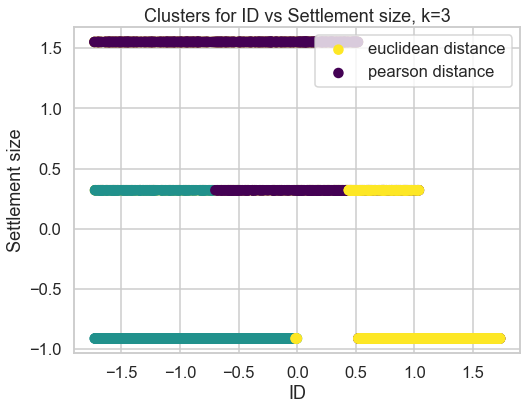


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


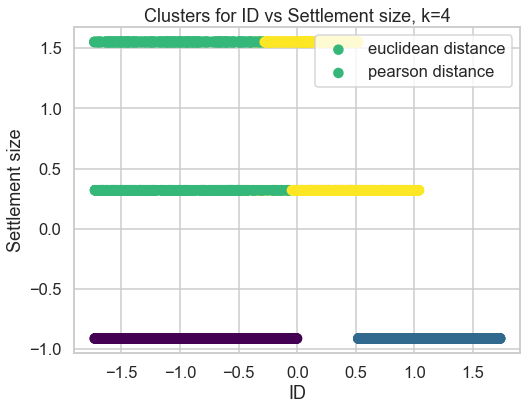


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


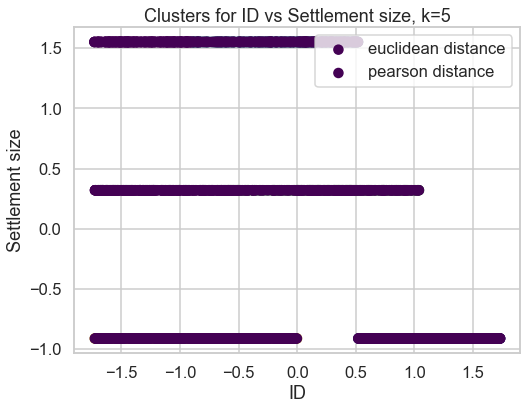


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


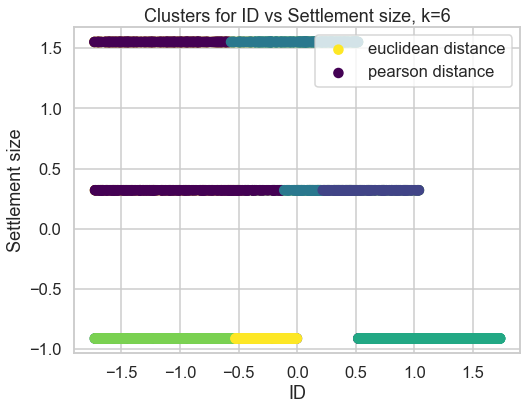


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


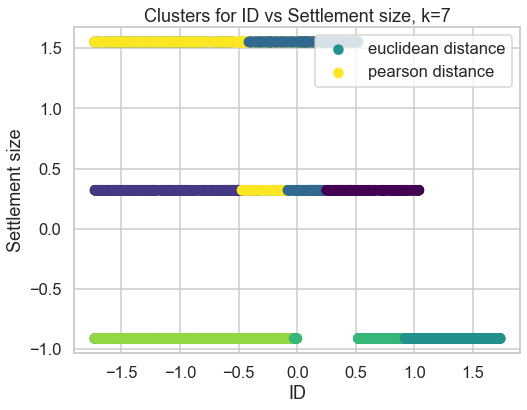


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


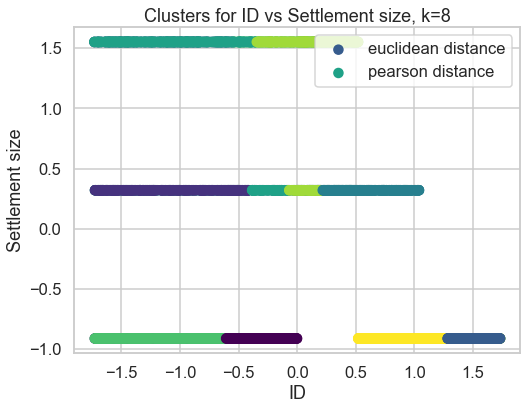


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


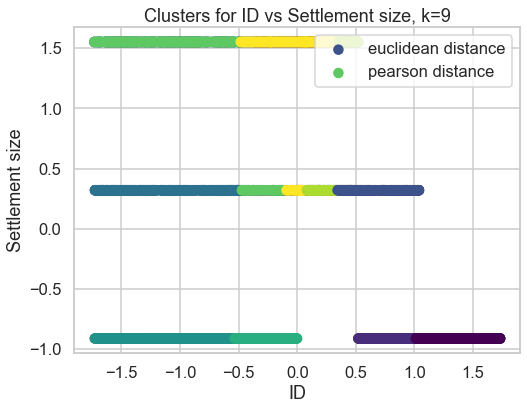


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


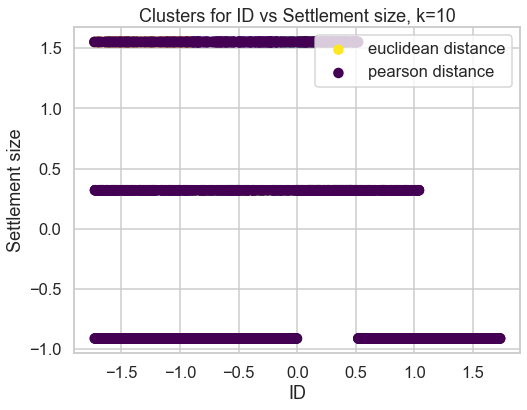


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


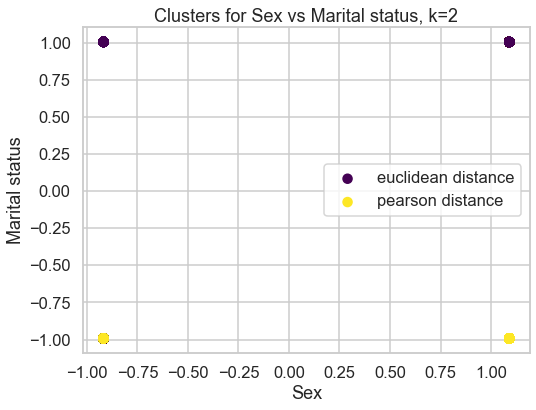


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


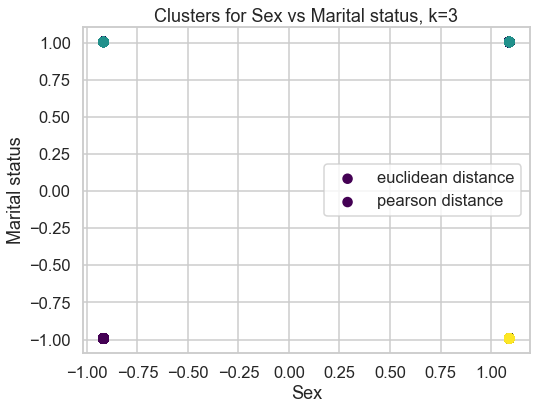

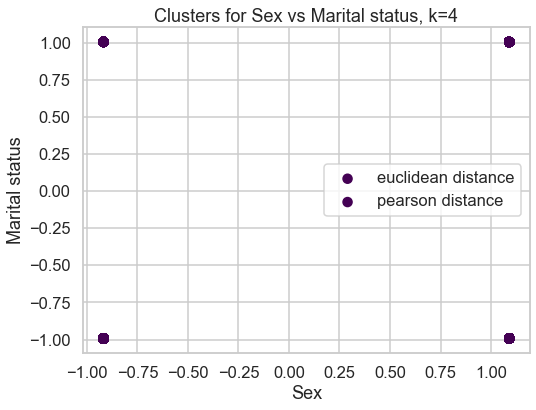

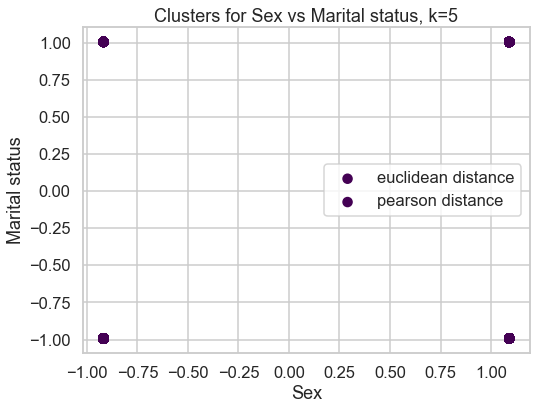

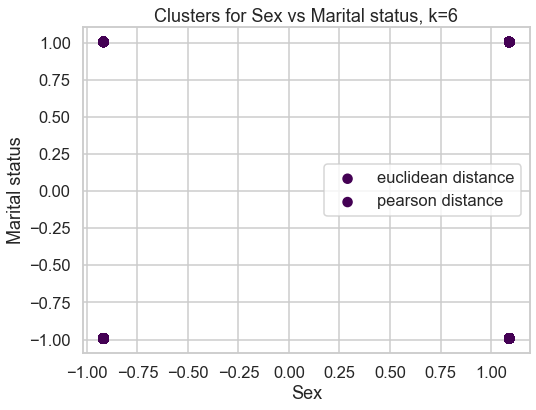

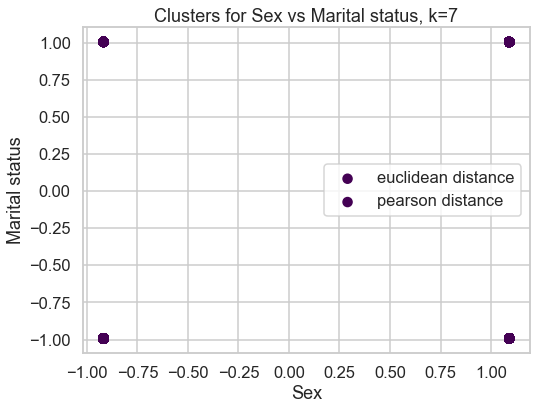

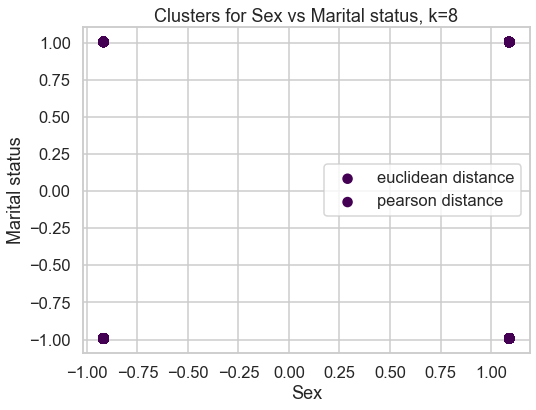

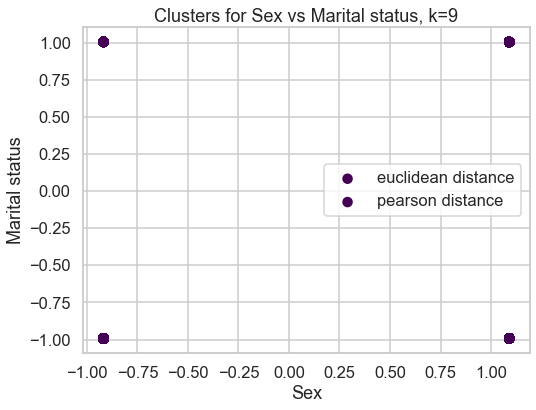

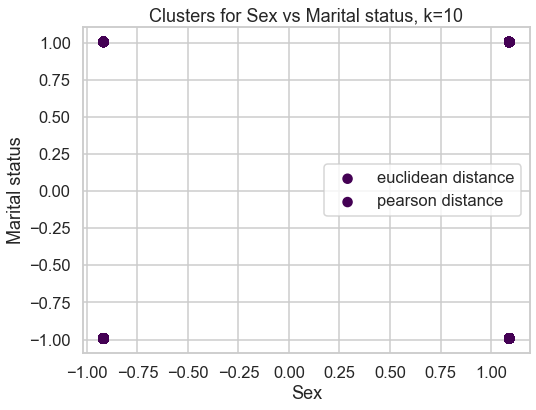


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


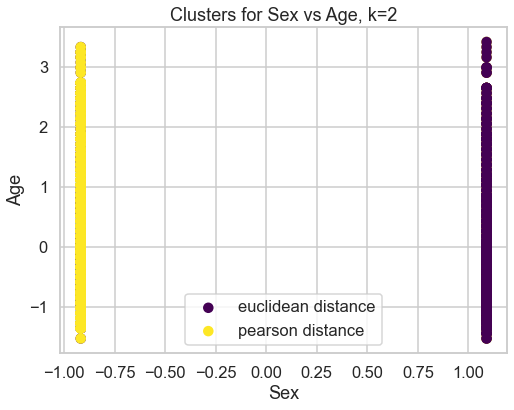


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


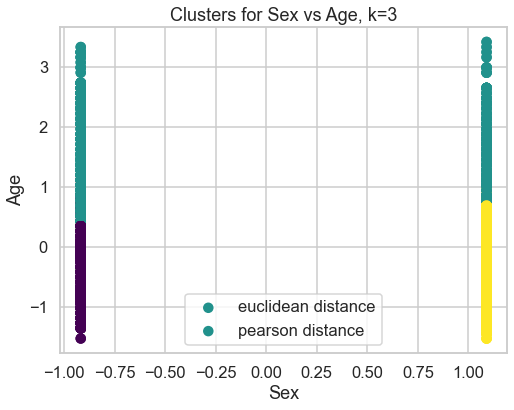


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


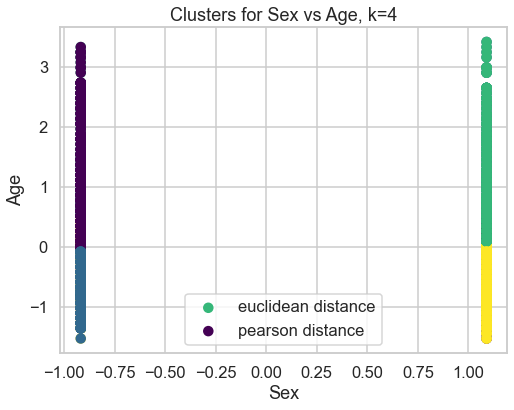


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


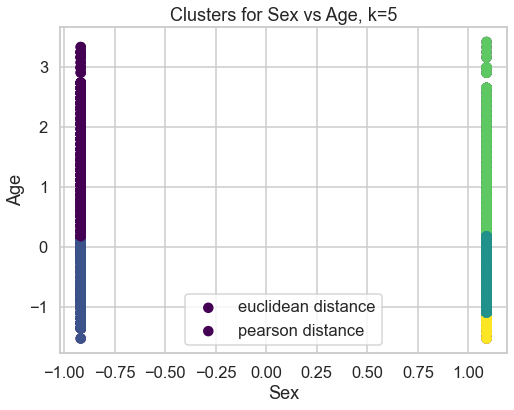


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


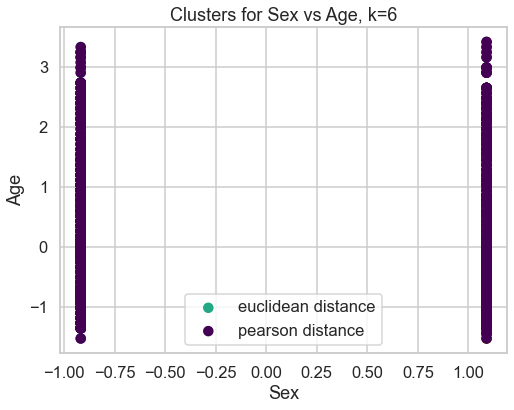


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


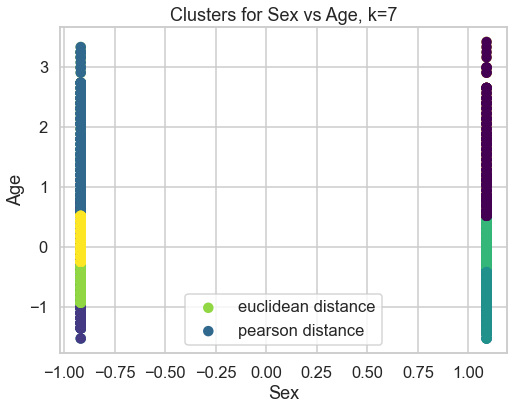


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


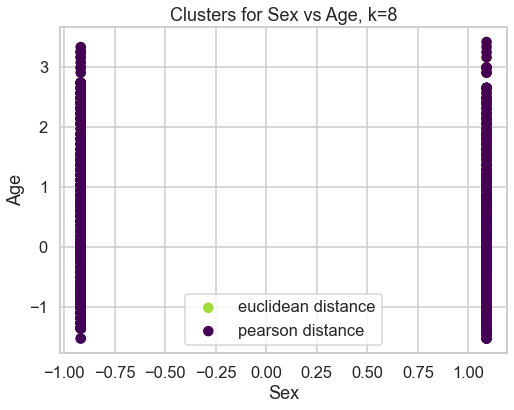


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


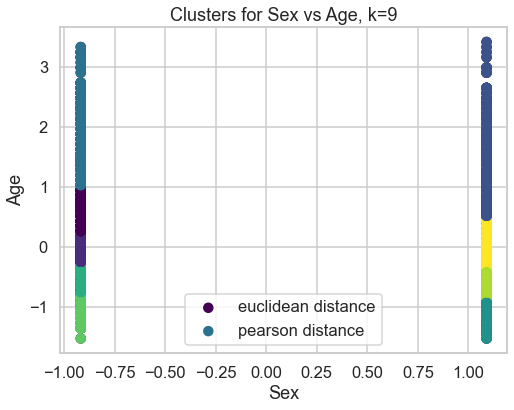


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


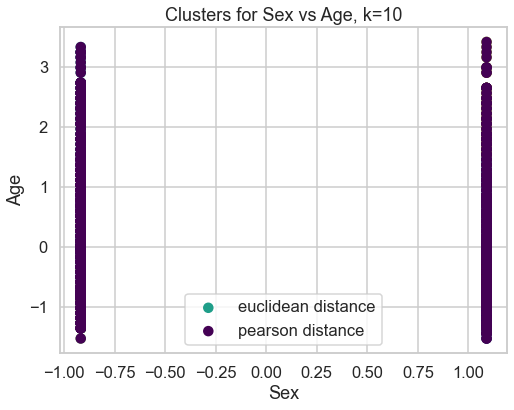


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


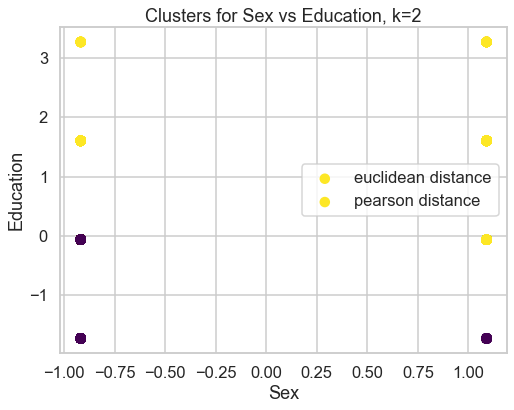


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


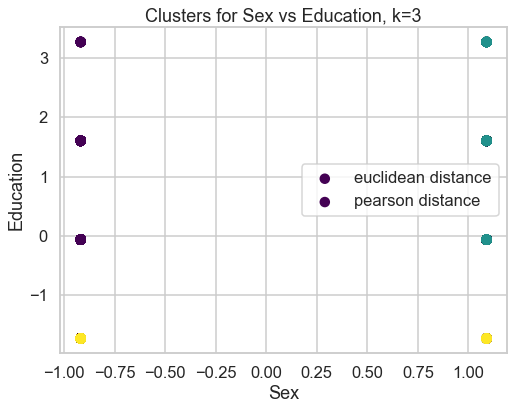

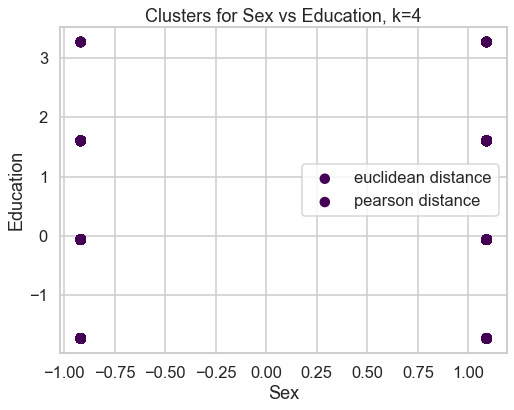

/var/folders/kh/bncmmmvx71g6hk6x8t5fqcrw0000gn/T/ipykernel_1322/2439898822.py:28: RuntimeWarning: invalid value encountered in true_divide
  distances = 1 - (numerator / denominator)


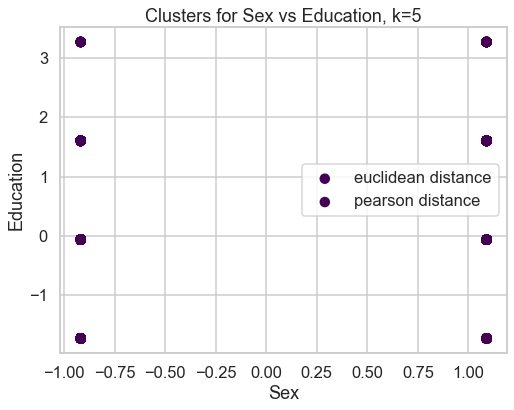

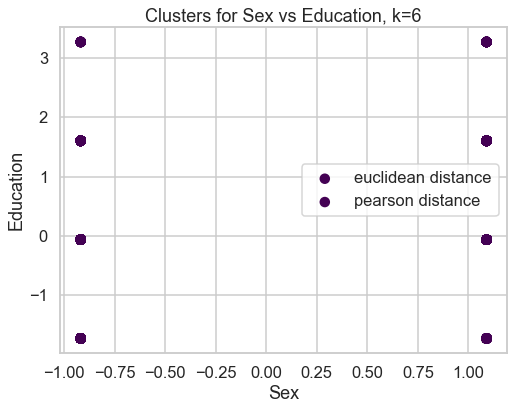

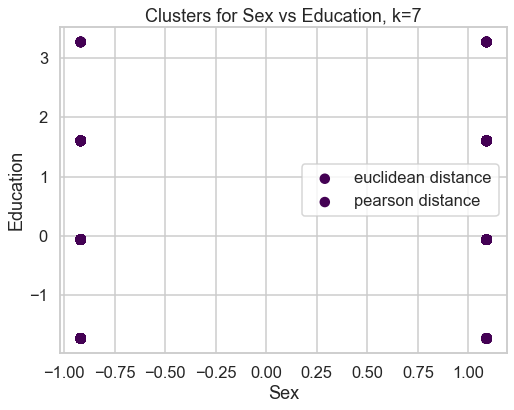

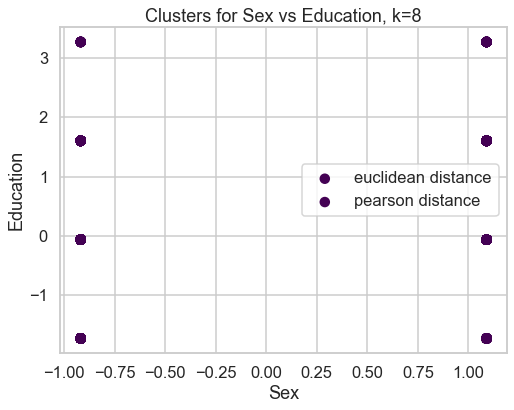

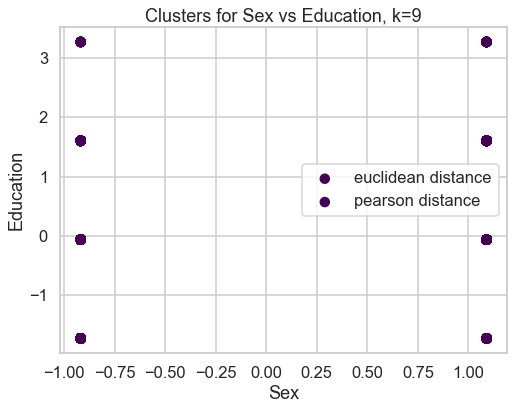

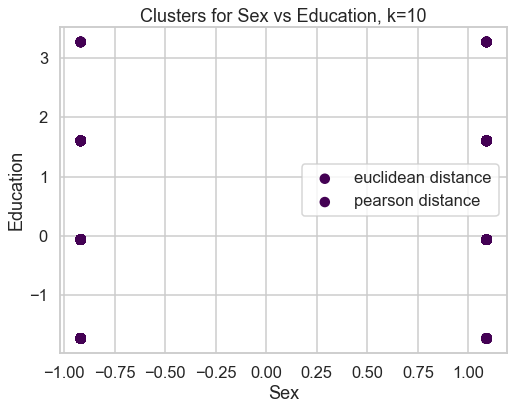


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


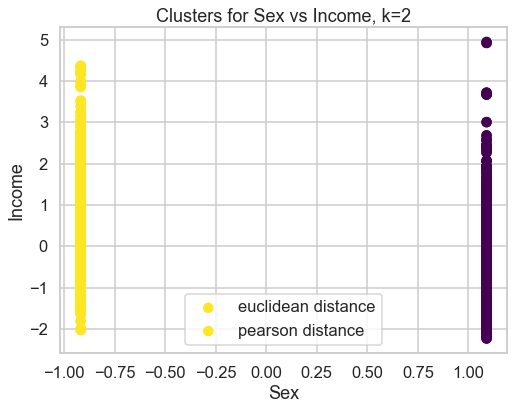


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


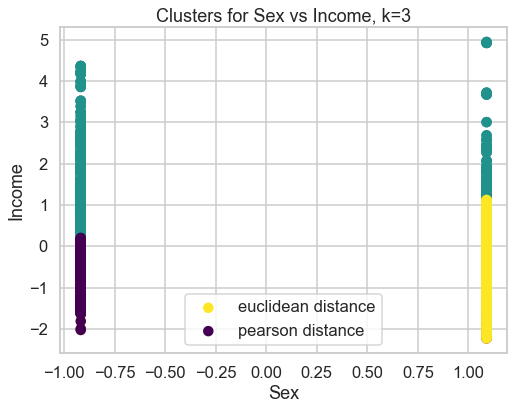


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


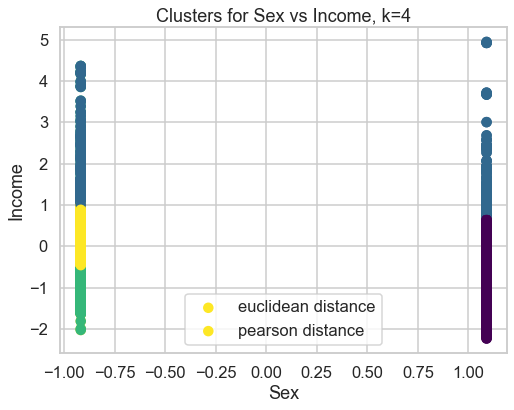


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


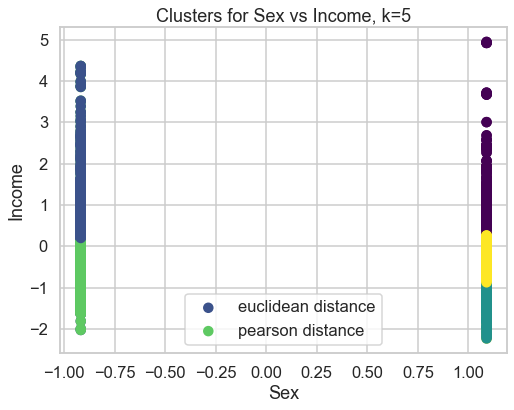


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


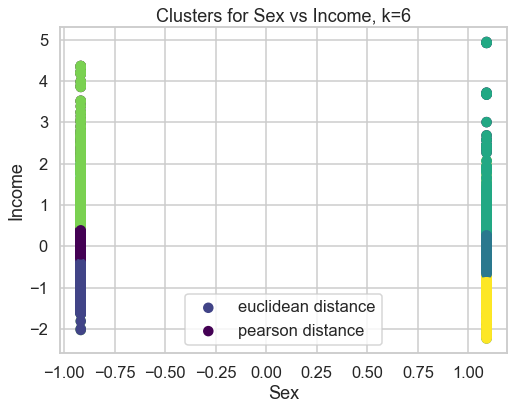


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


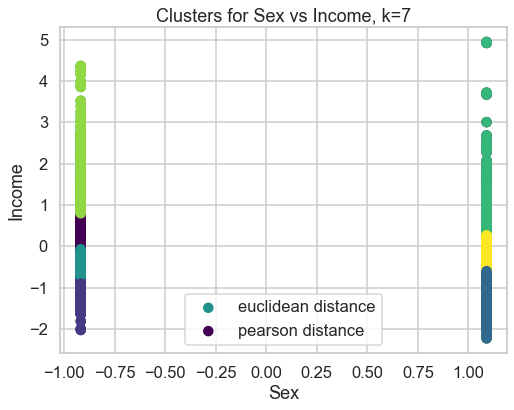


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


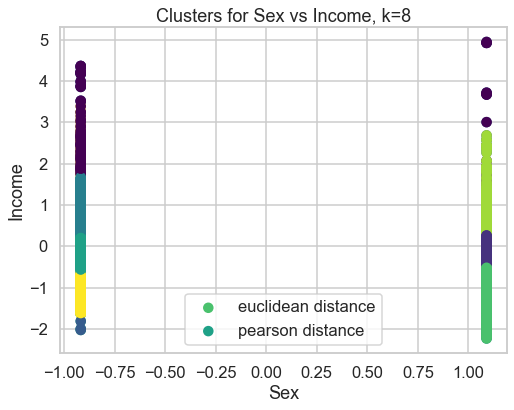


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


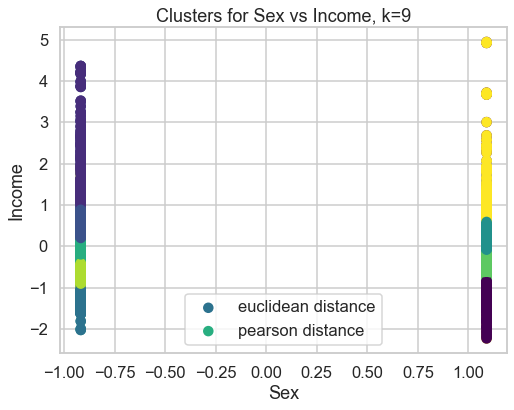


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


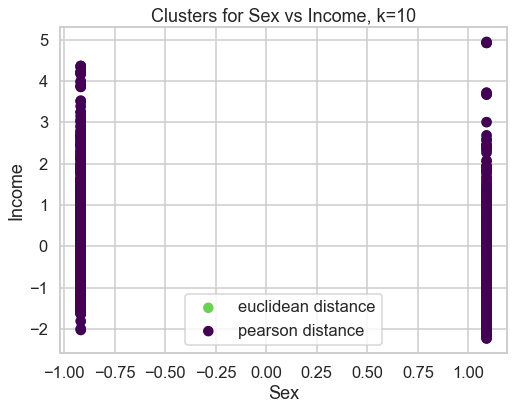


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


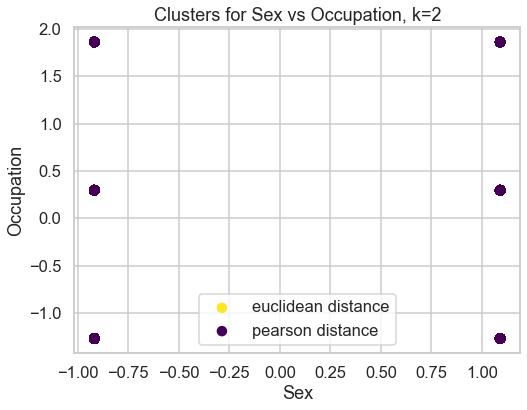


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


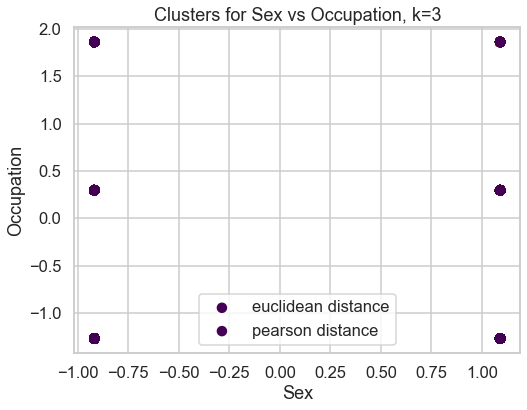

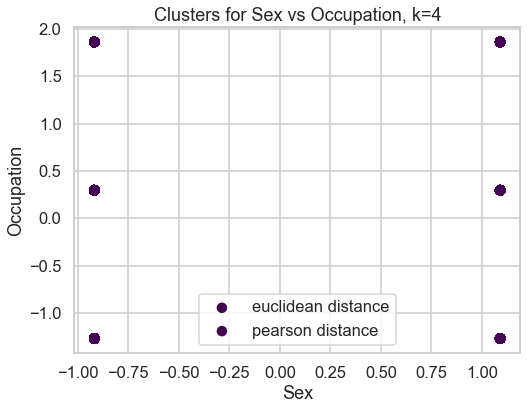

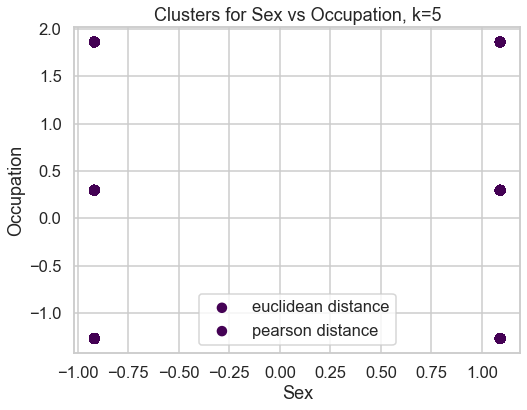

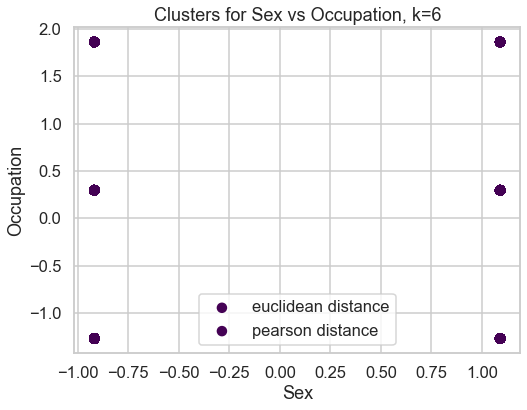

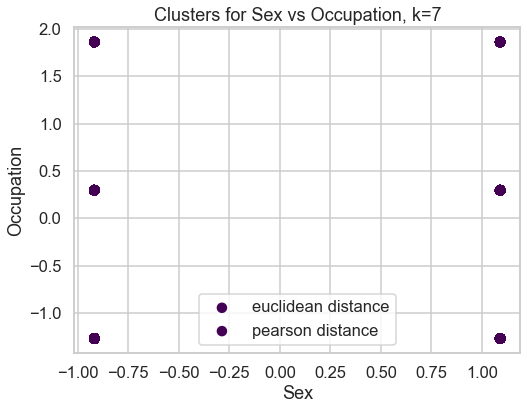

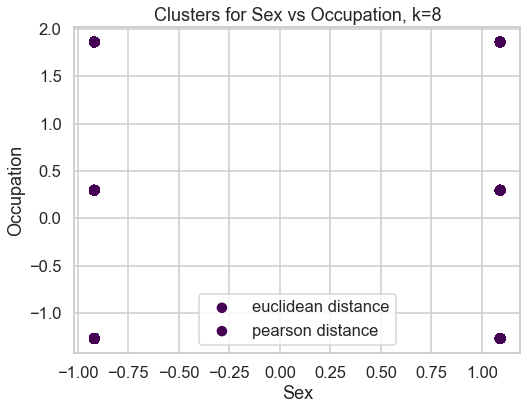

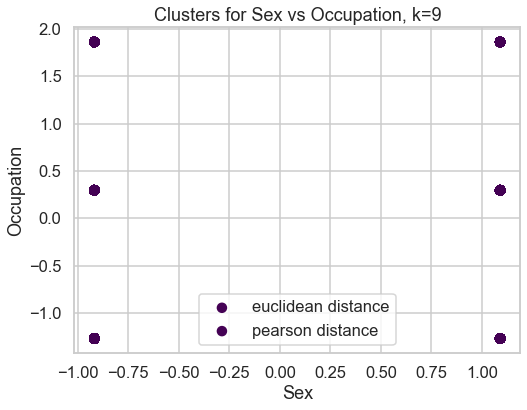

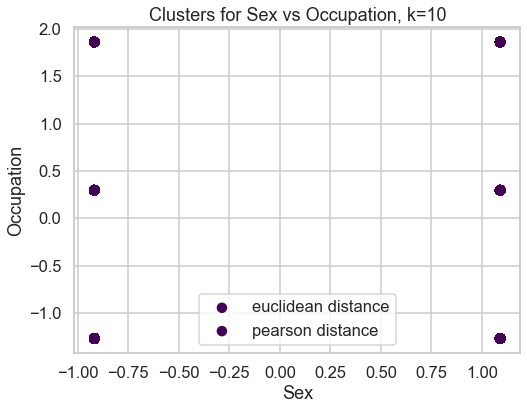


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


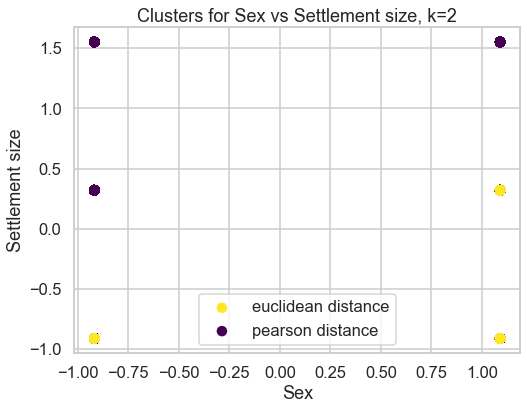

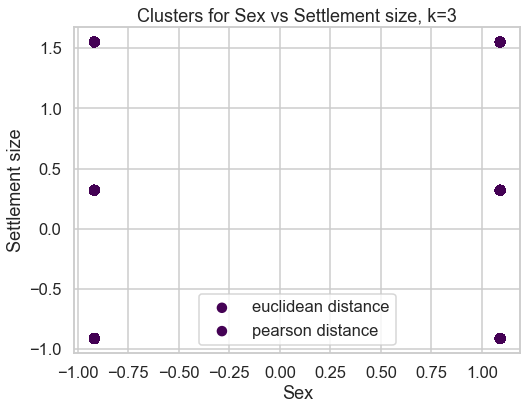

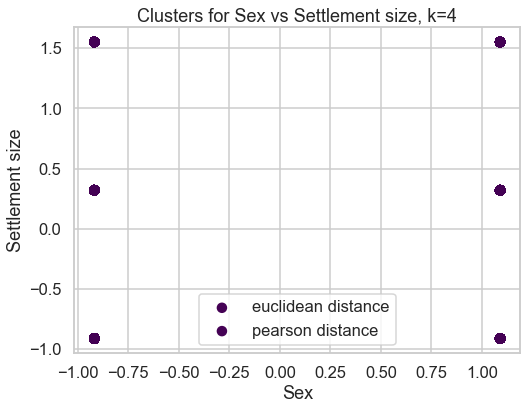


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


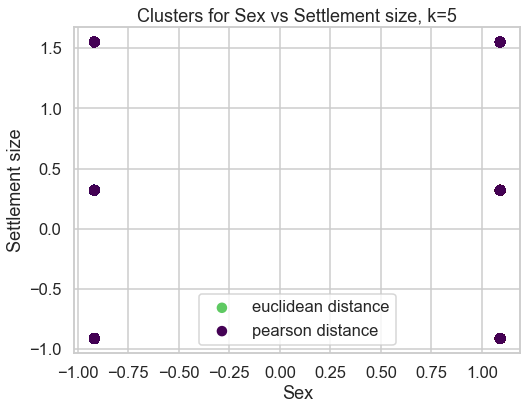

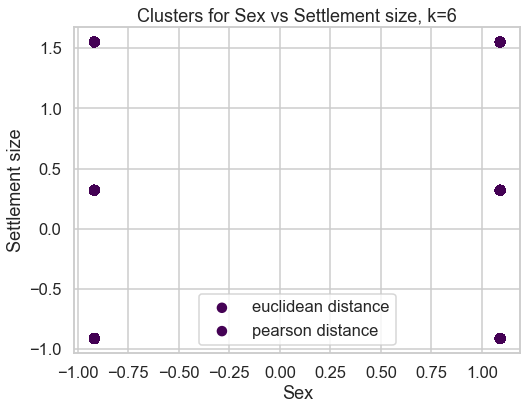

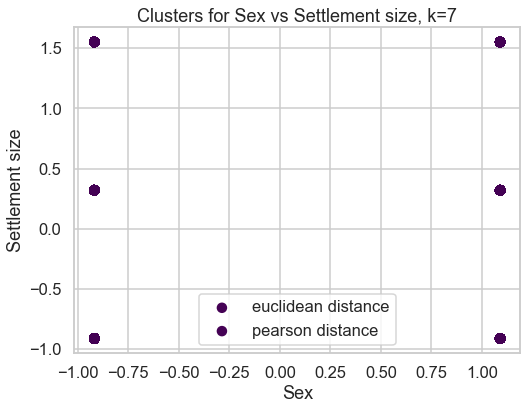

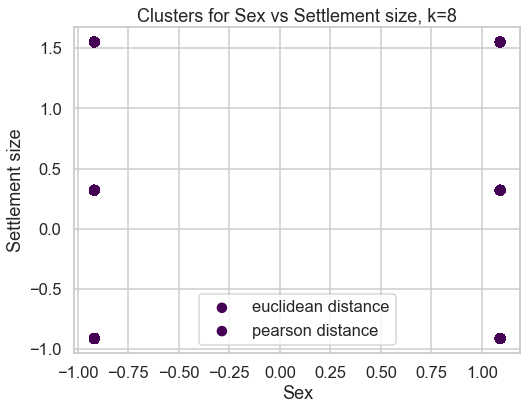

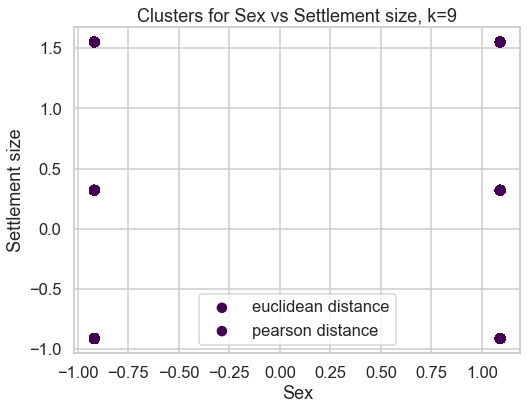

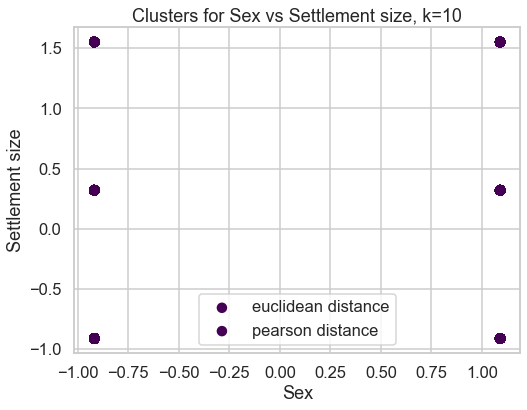


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


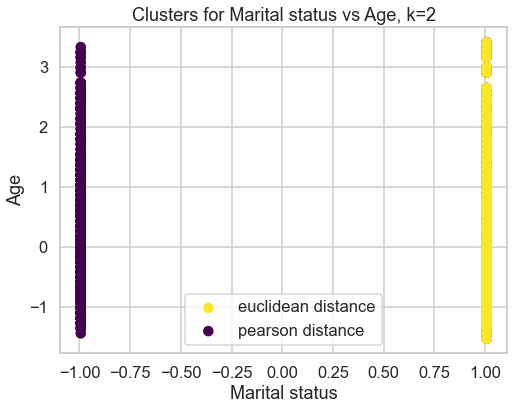


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


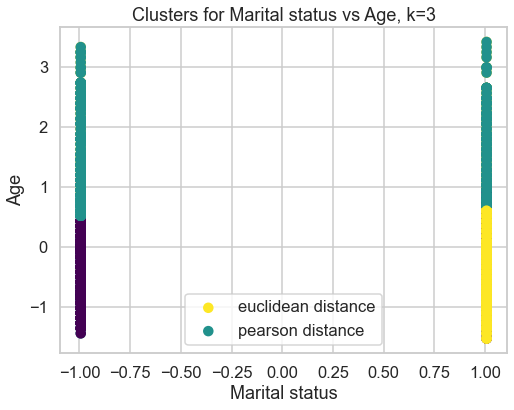

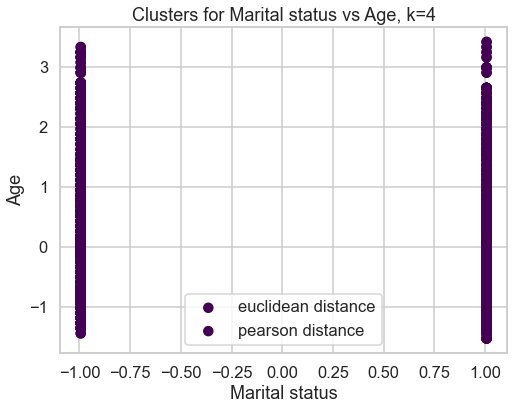


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


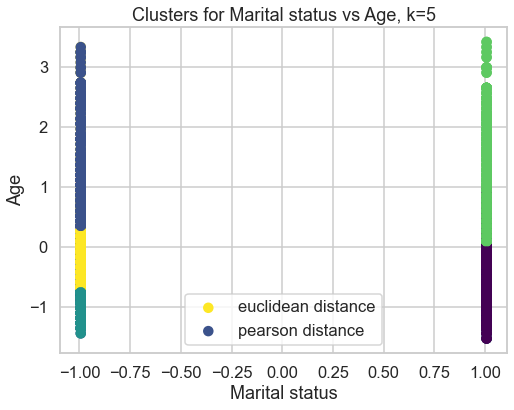


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


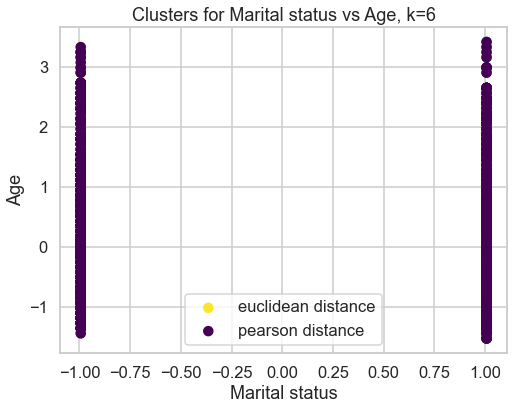


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


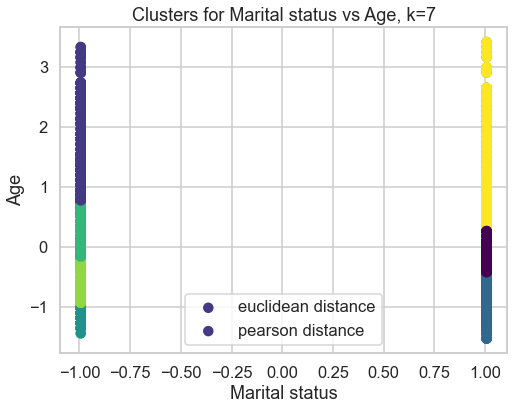

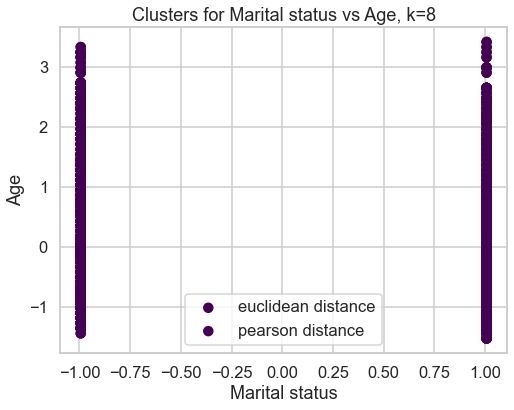


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


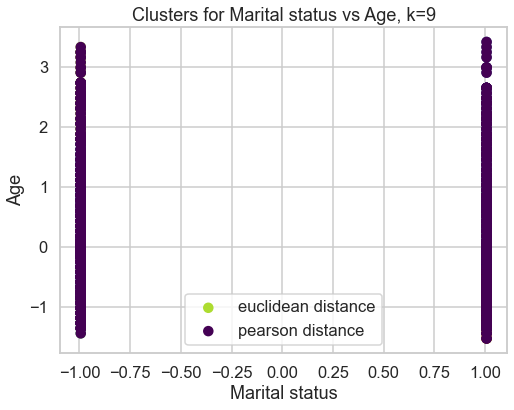


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


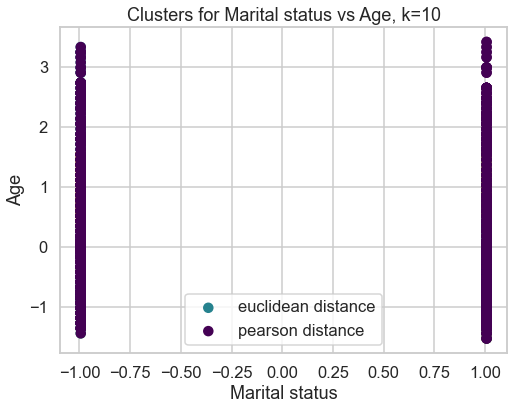


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


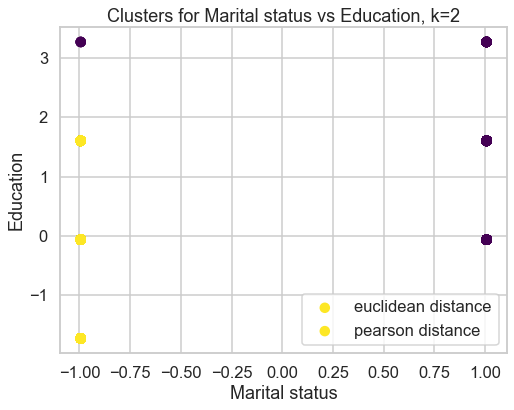

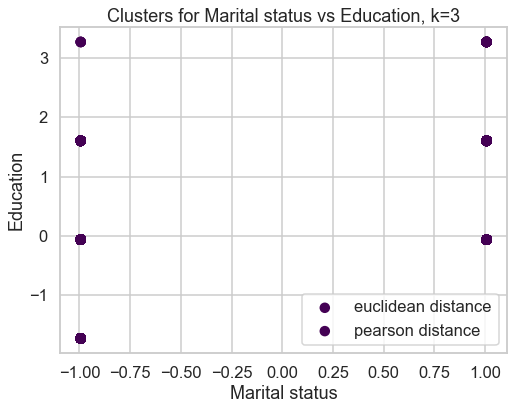

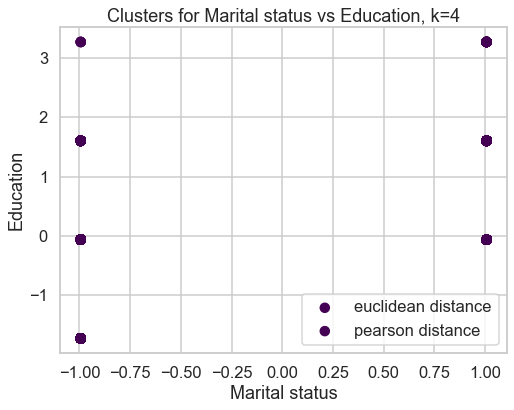

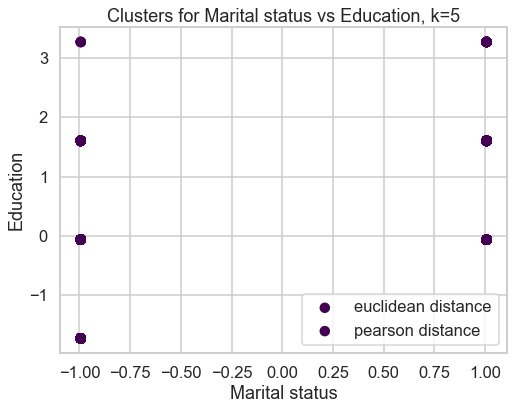

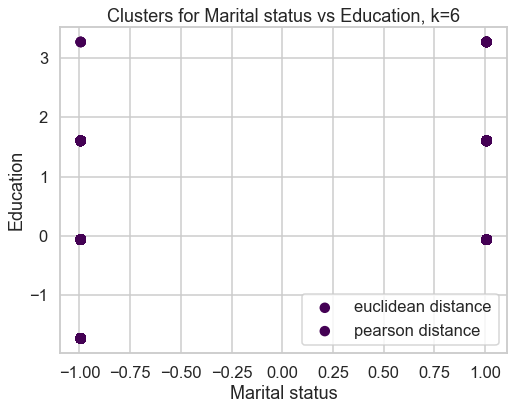

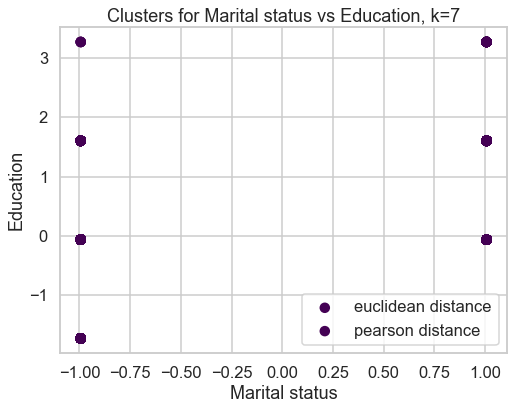

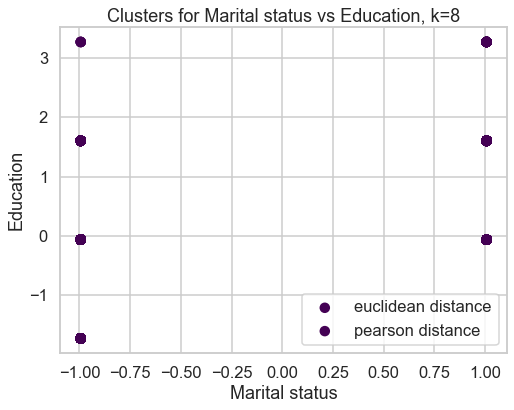

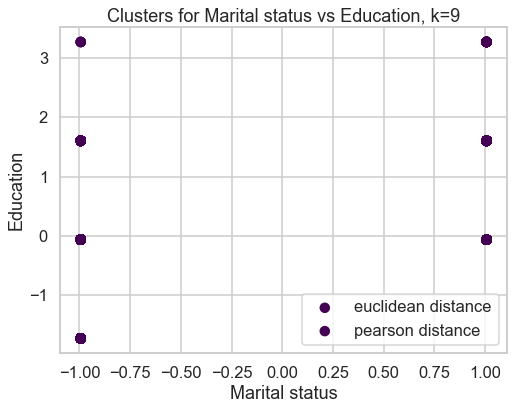

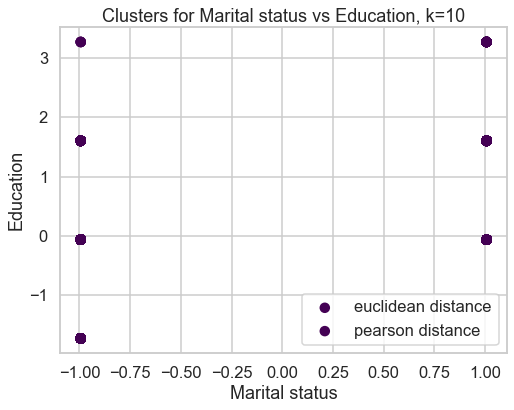


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


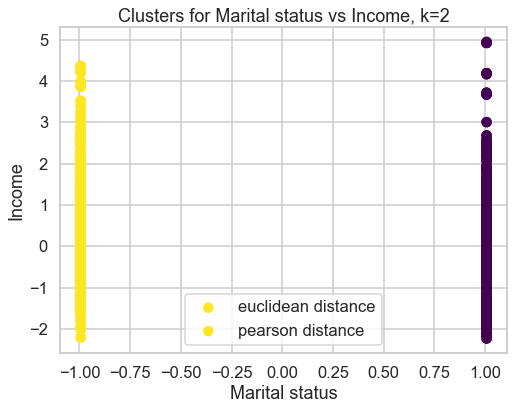


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


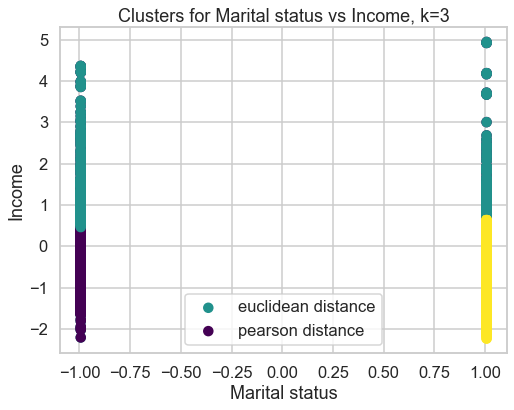


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


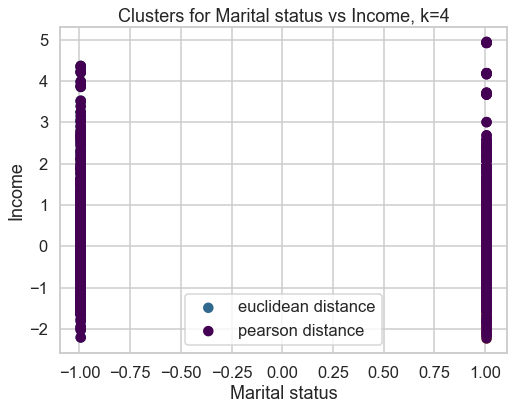


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


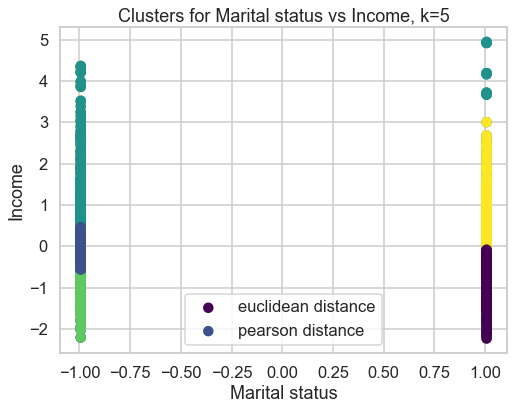


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


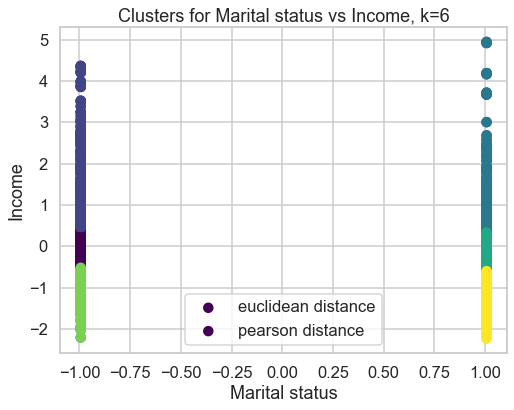


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


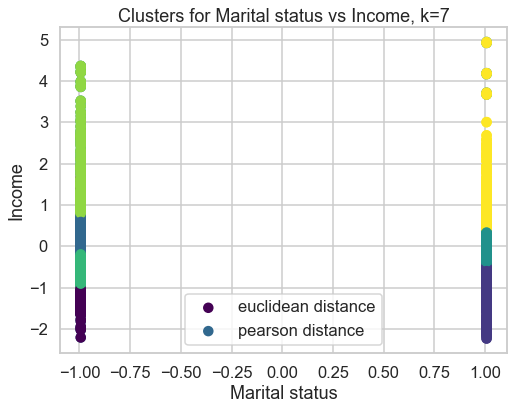


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


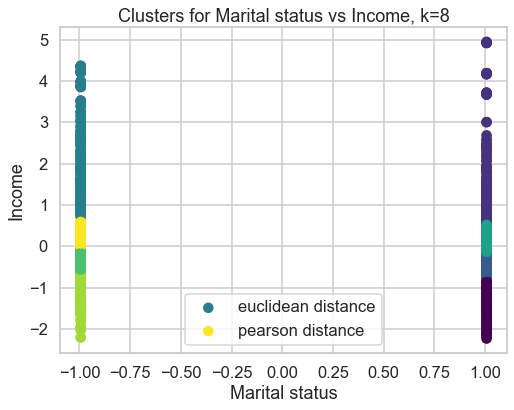


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


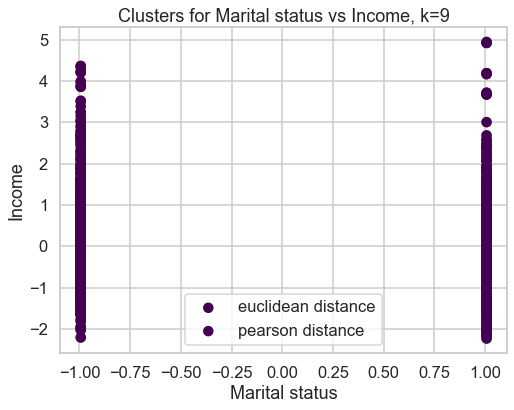


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


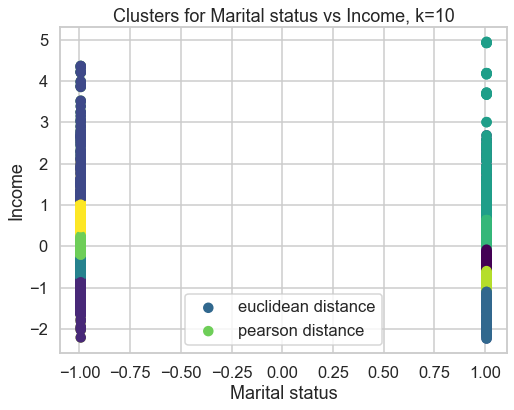


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


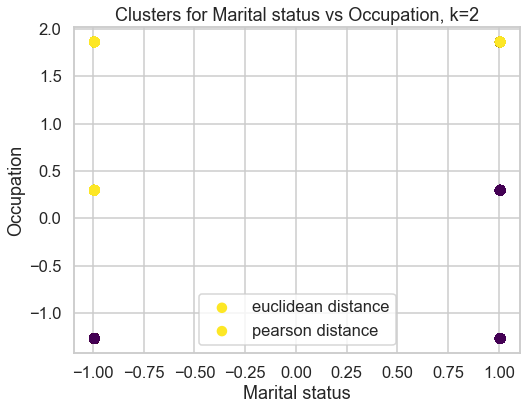

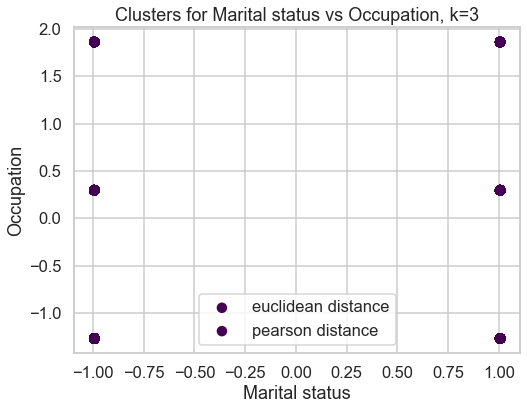

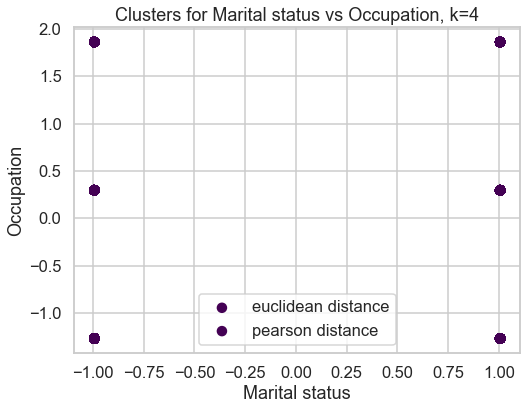

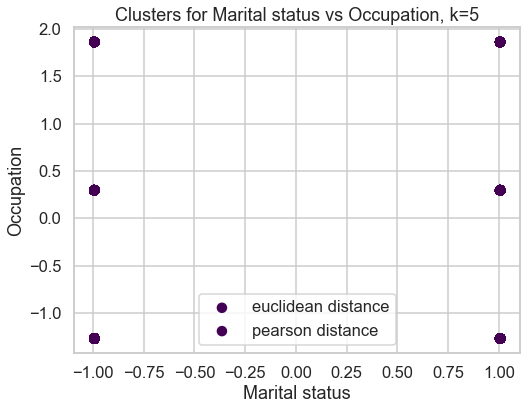

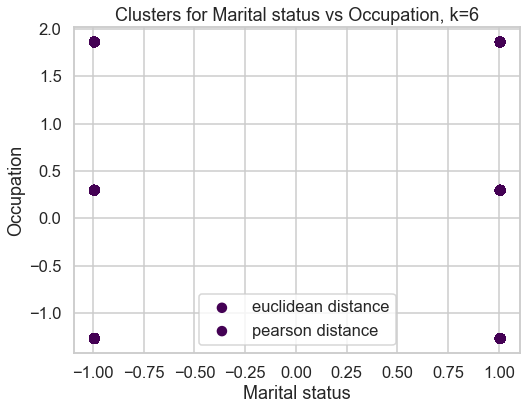

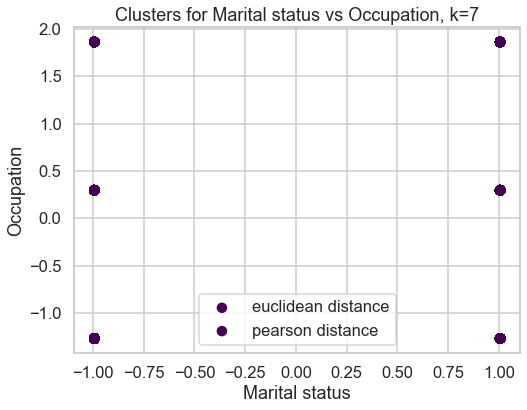

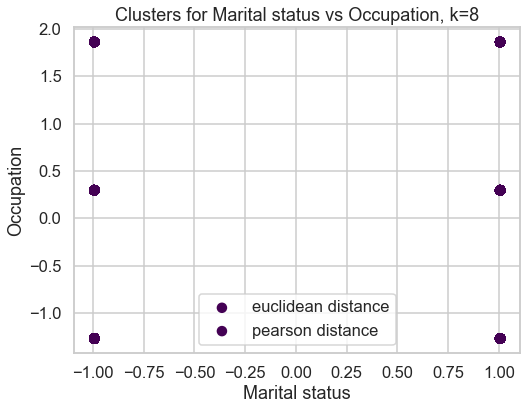

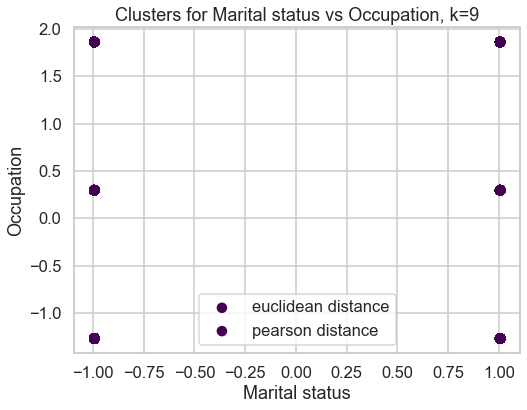

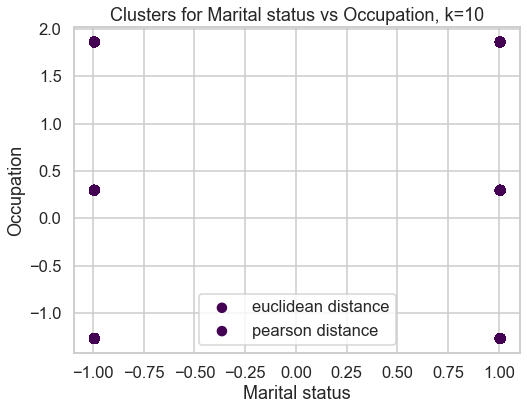


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


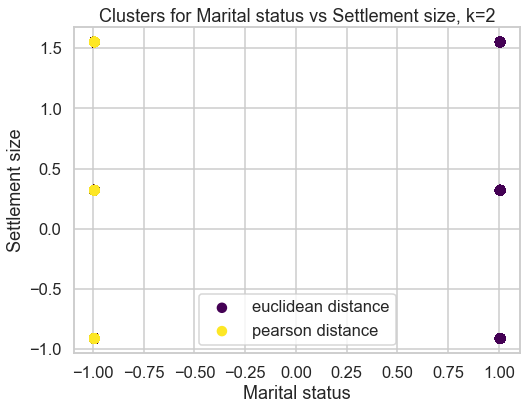


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


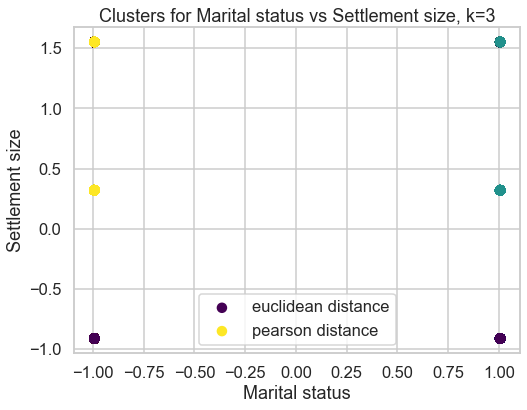


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


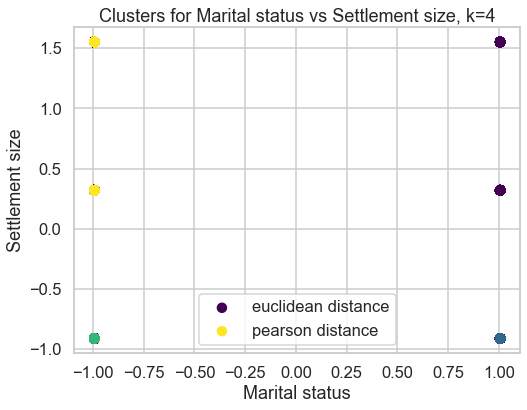

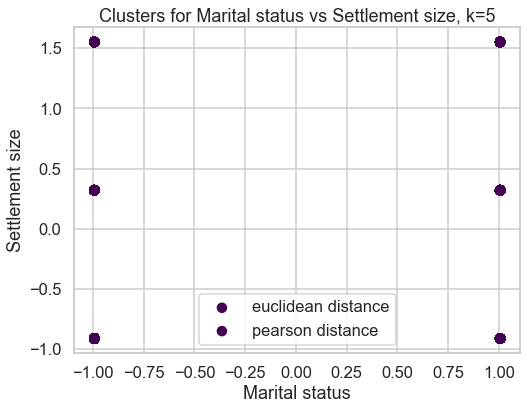

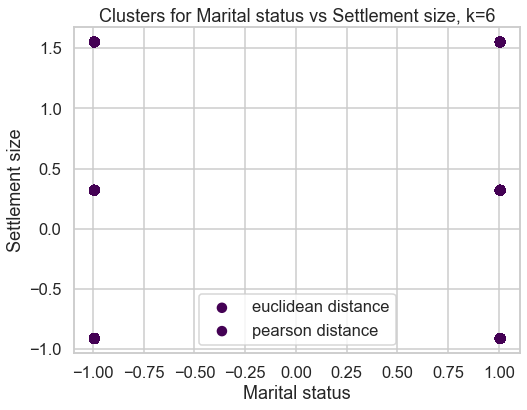

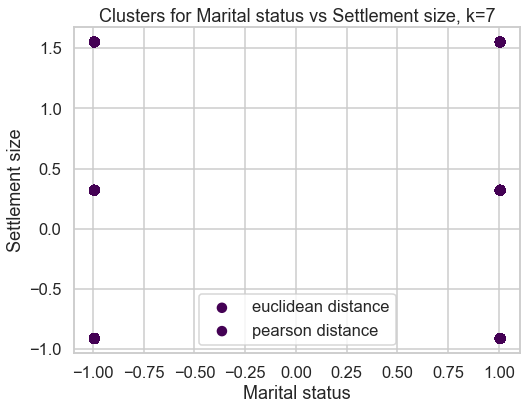

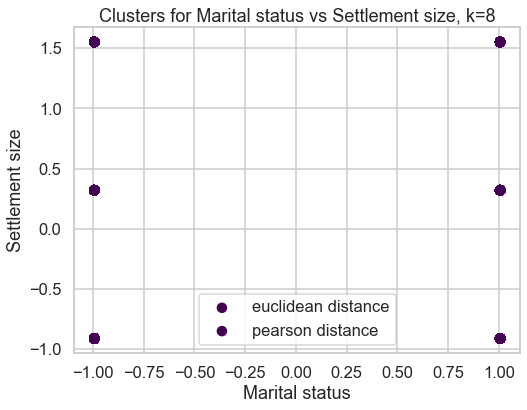

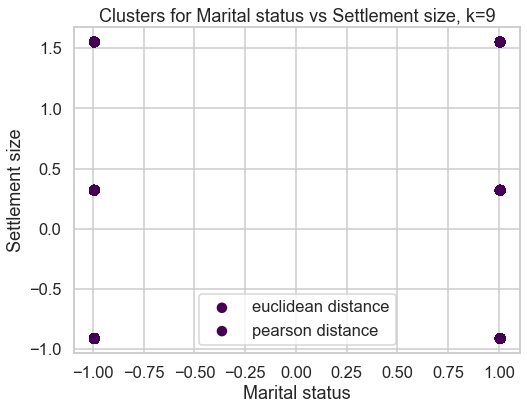

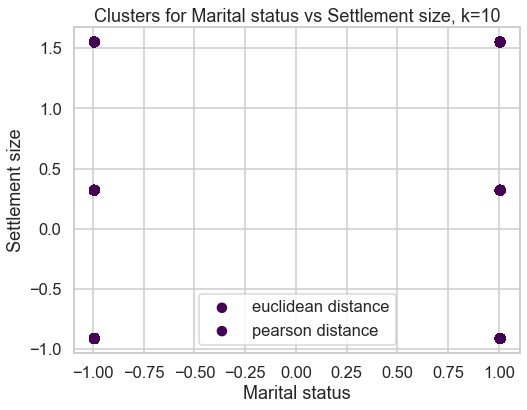


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


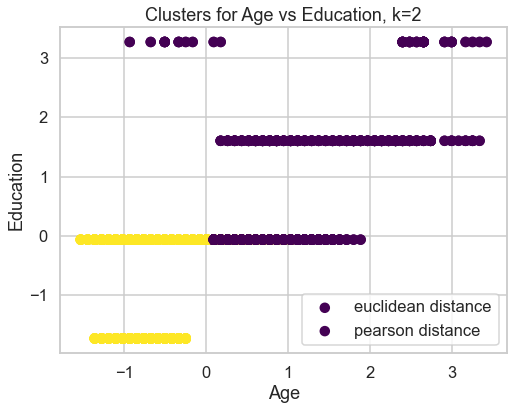


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


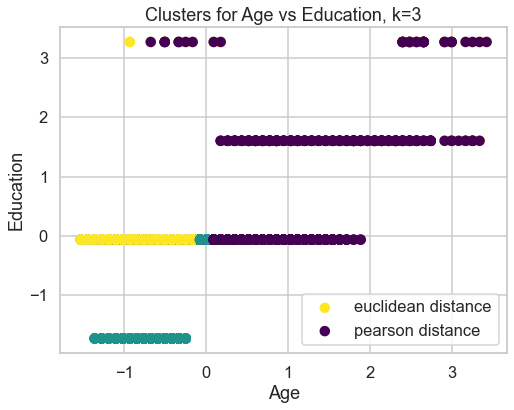


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


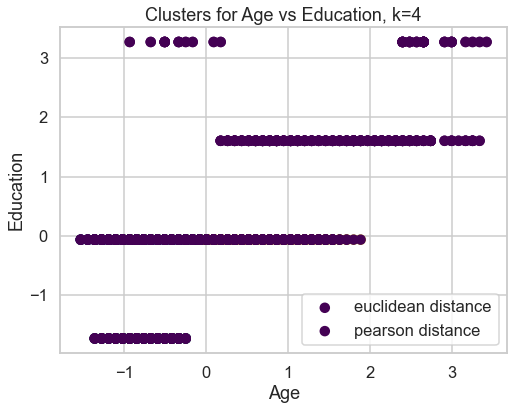


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


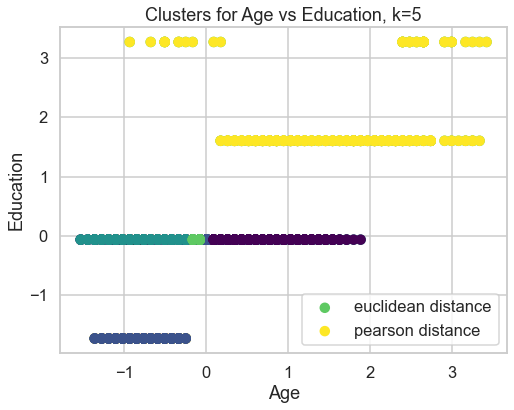

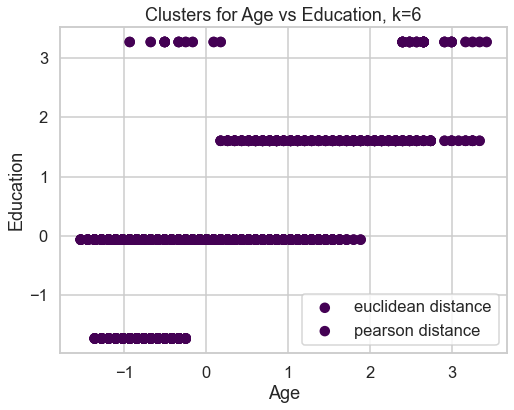

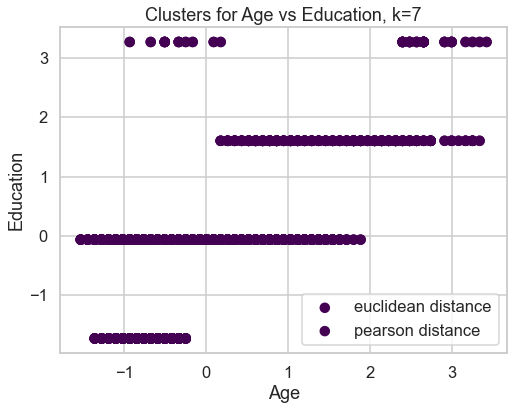

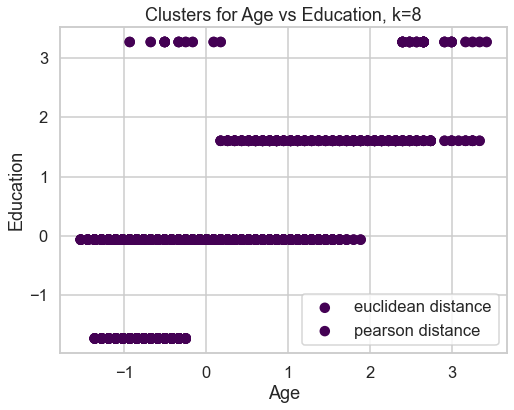

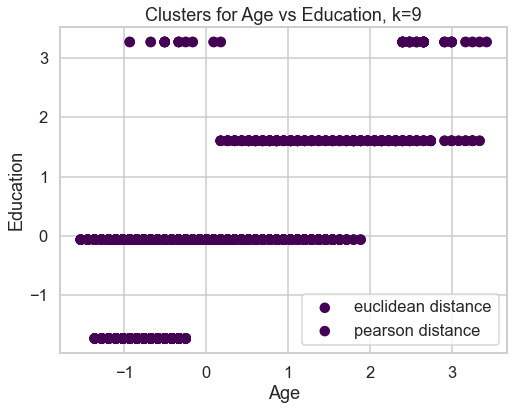

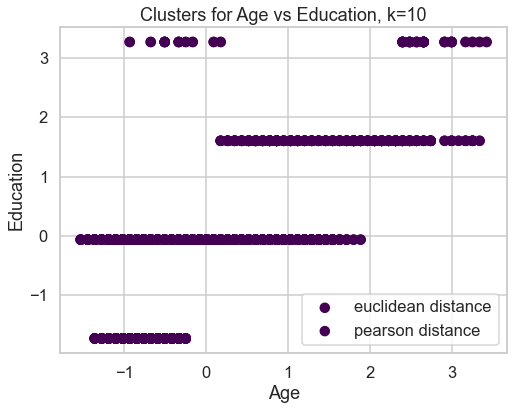


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


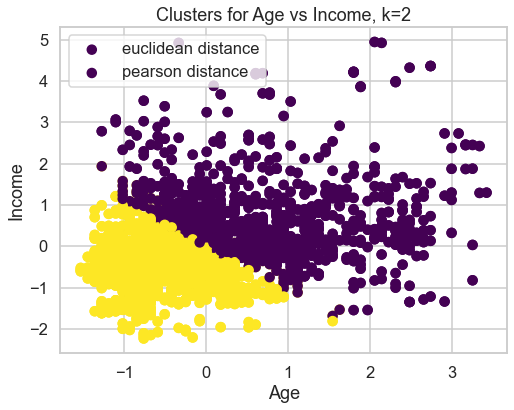


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


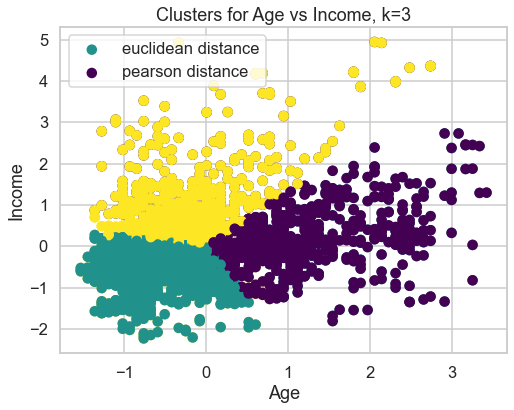


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


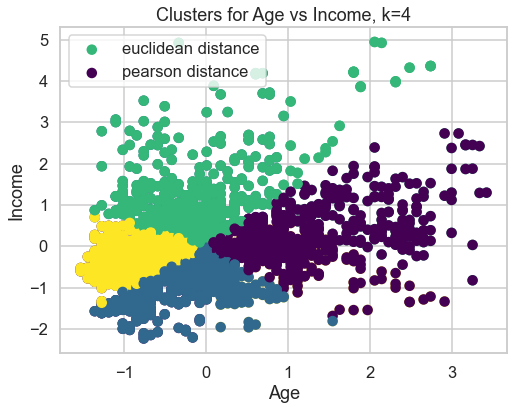


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


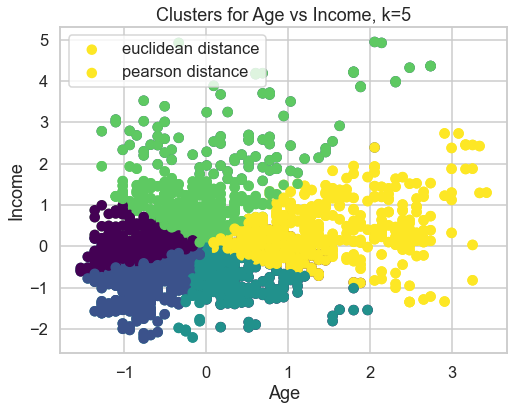


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


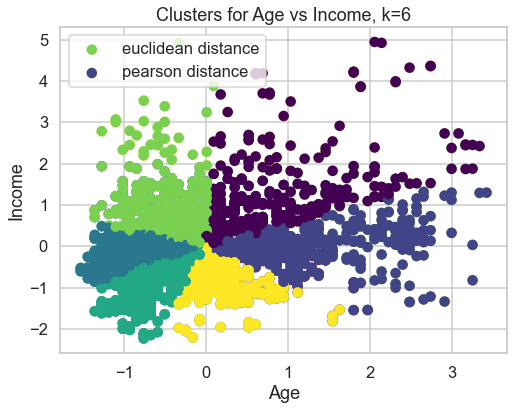


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


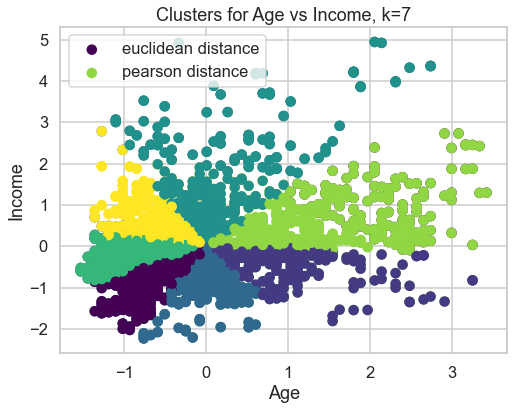


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


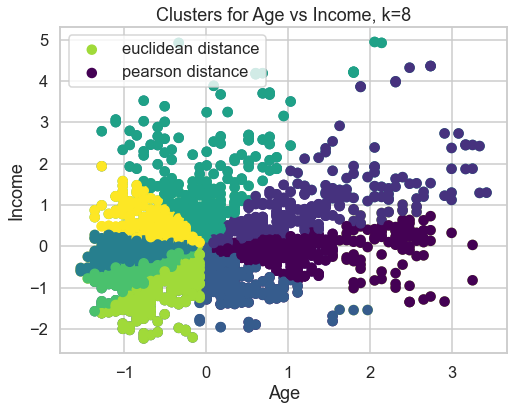


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


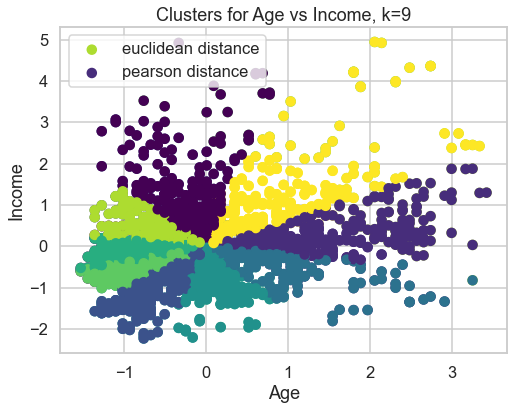


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


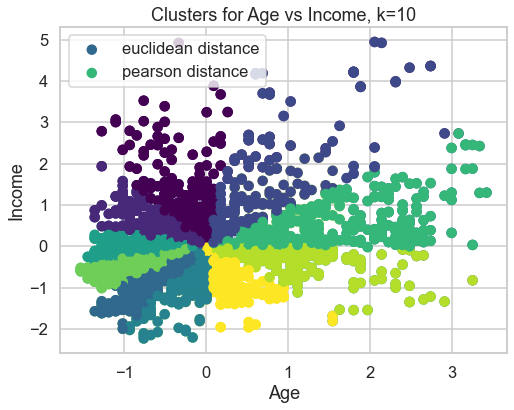


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


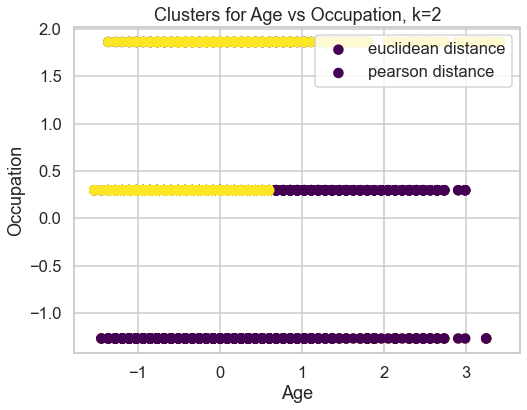


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


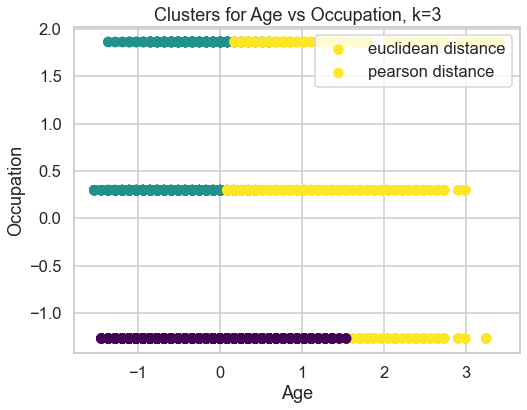


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


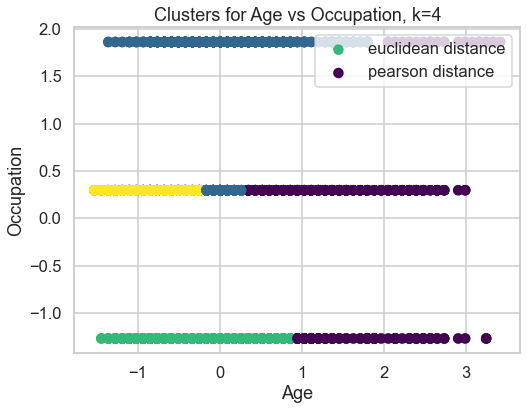


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


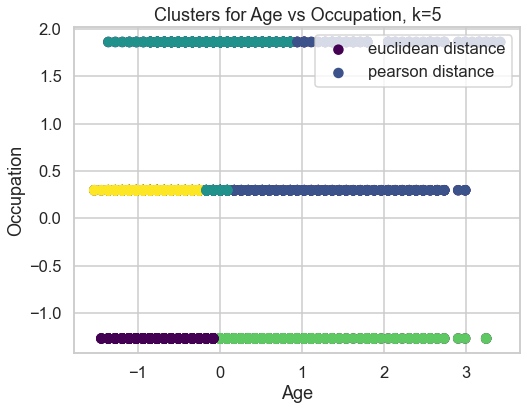


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


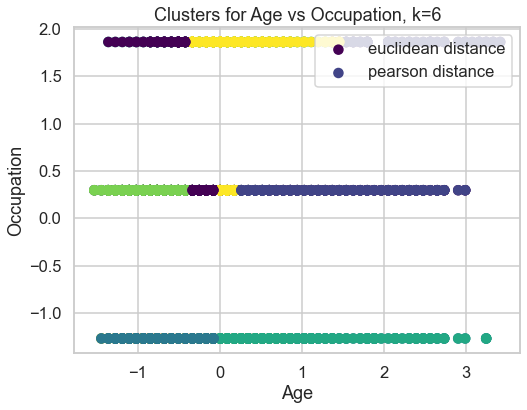


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


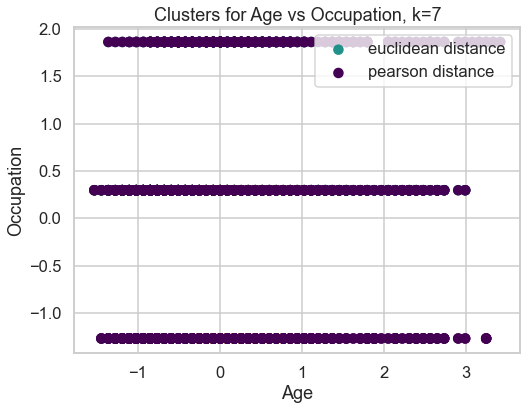


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


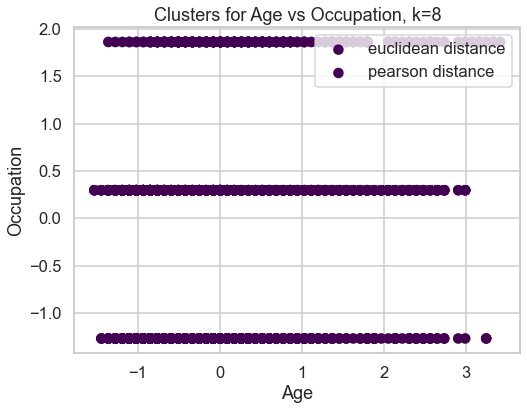


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


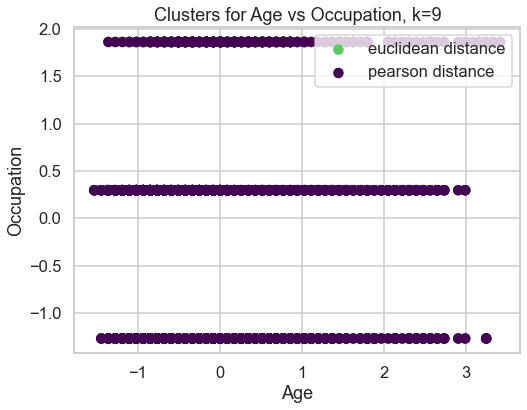


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


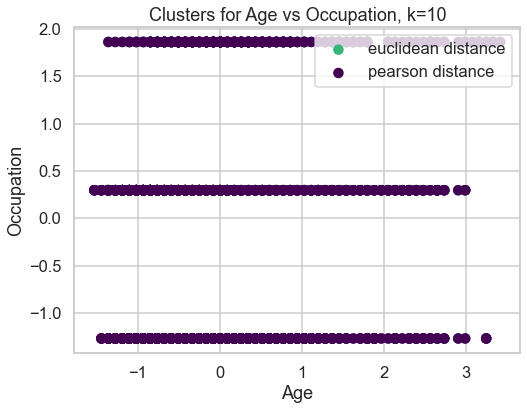


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


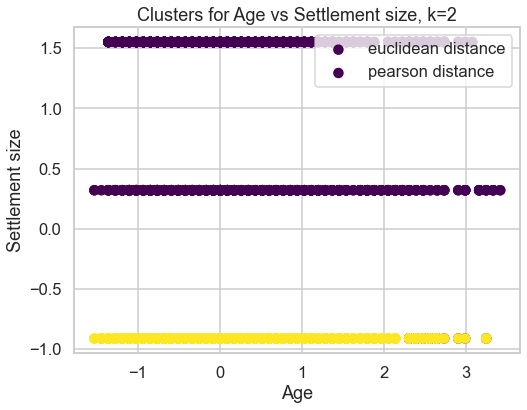


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


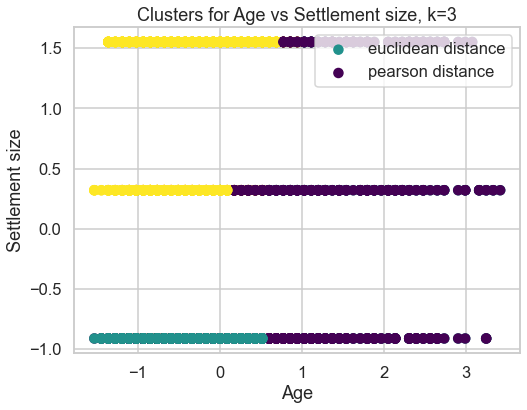


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


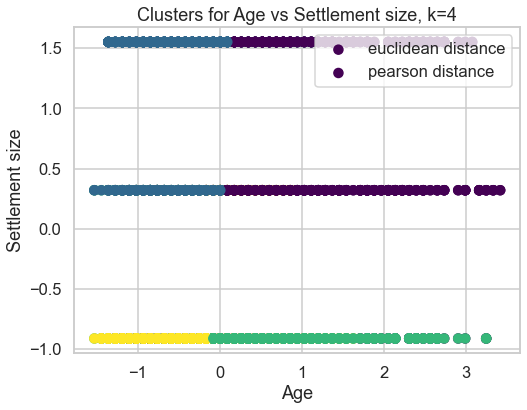


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


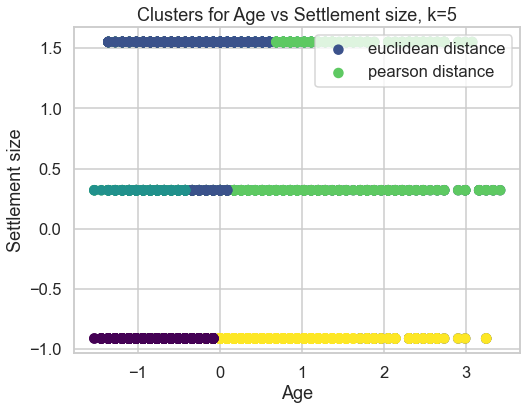


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


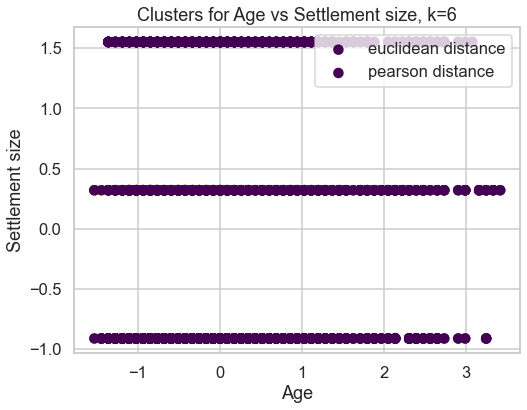


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


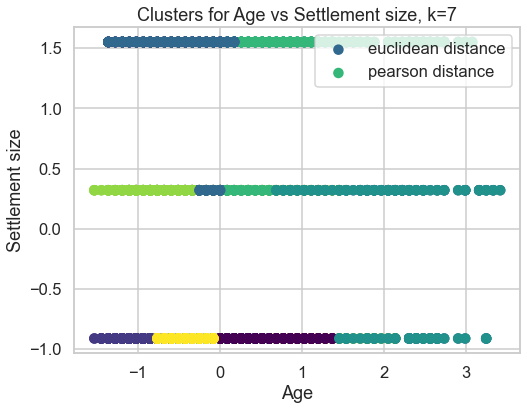


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


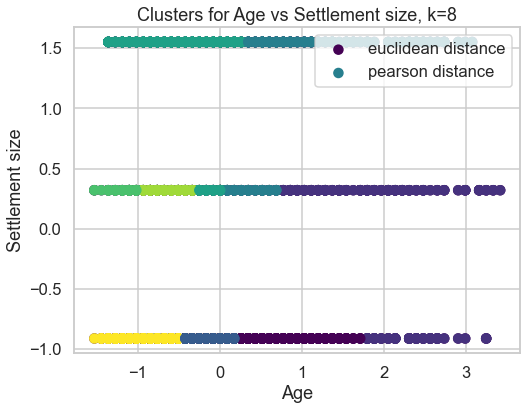

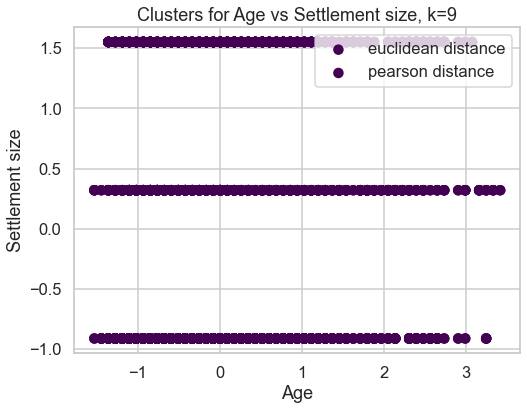


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


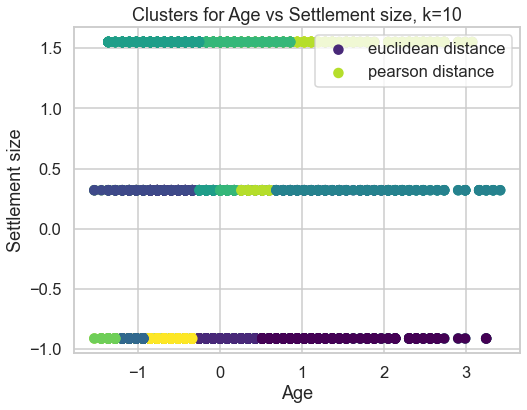


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


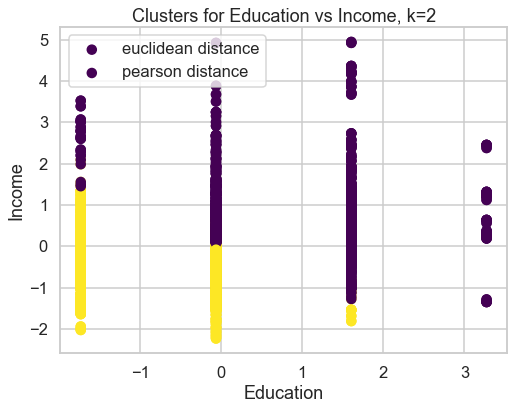


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


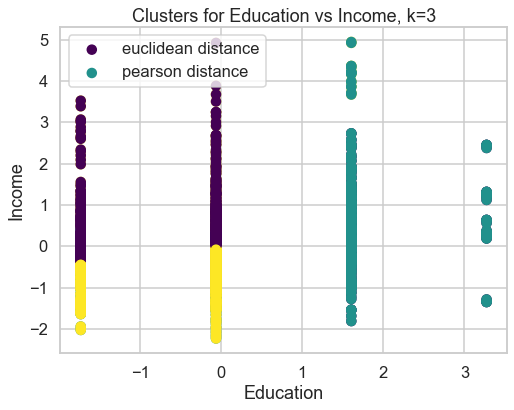


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


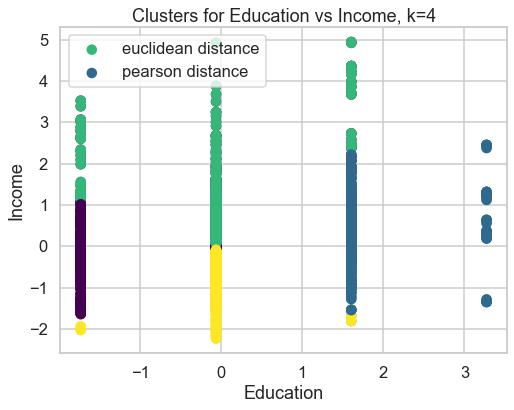


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


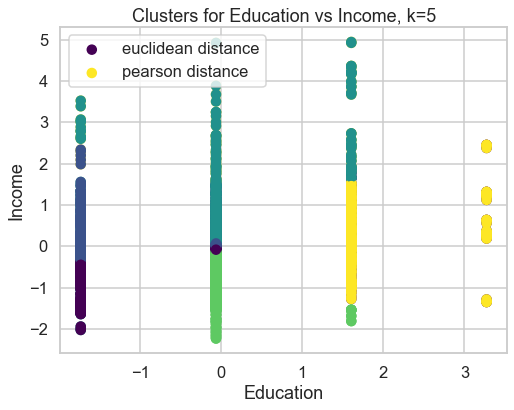


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


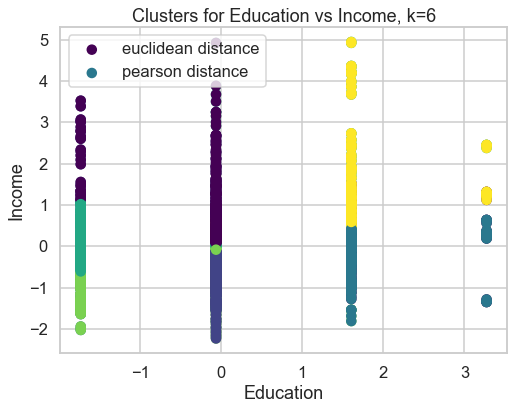


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


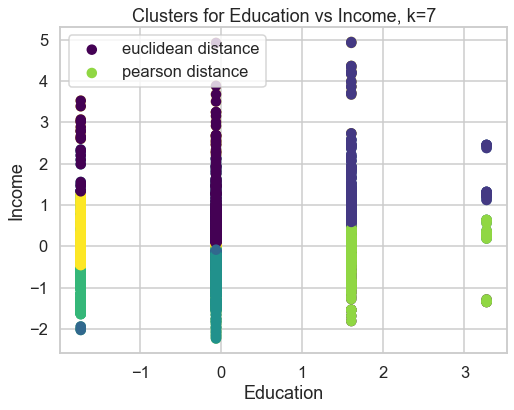


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


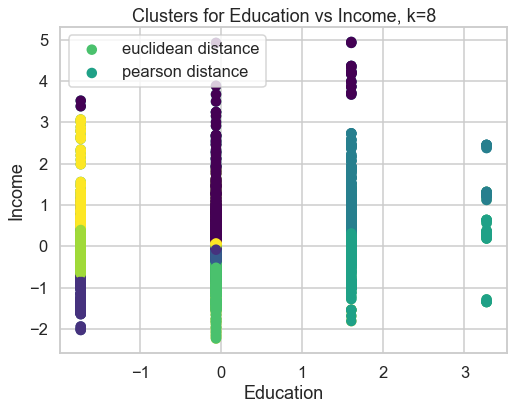


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


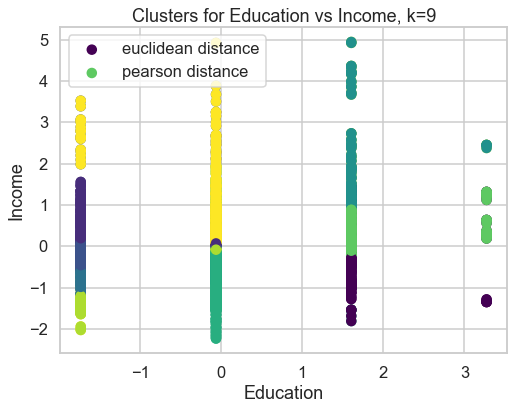


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


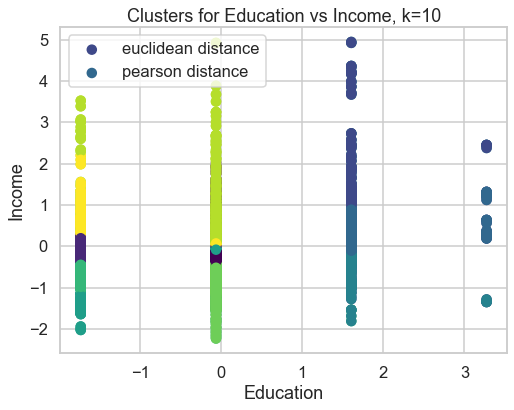


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


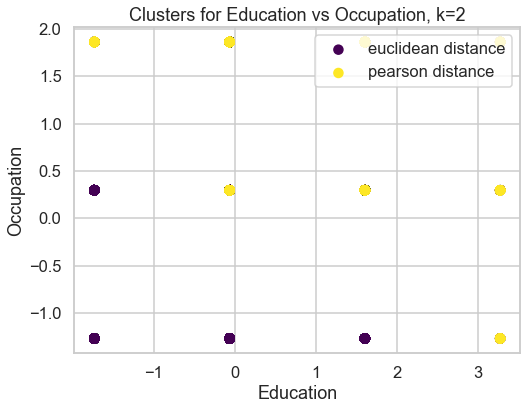

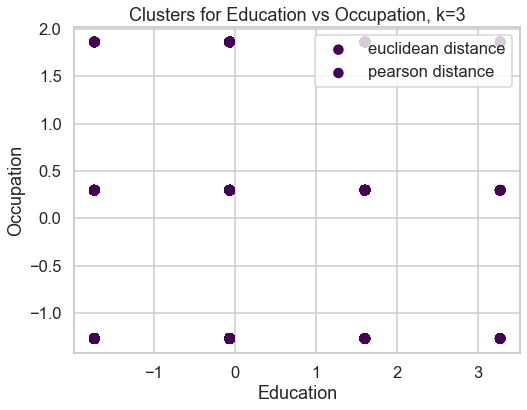


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


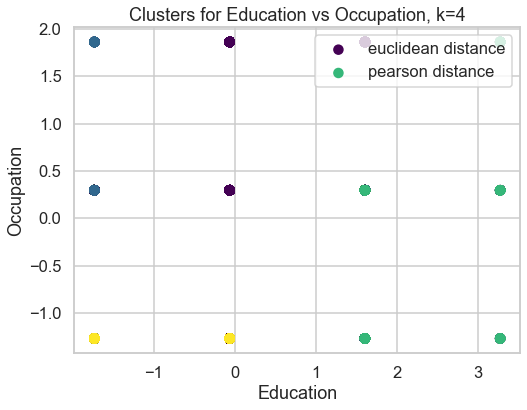

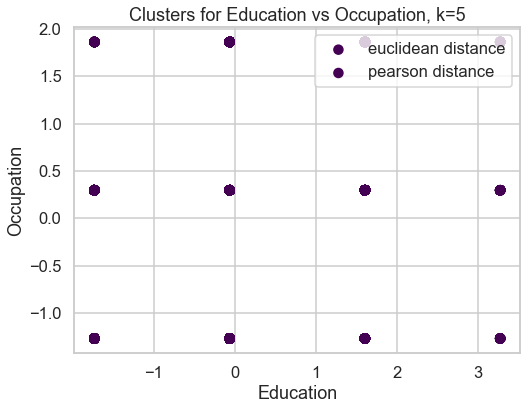

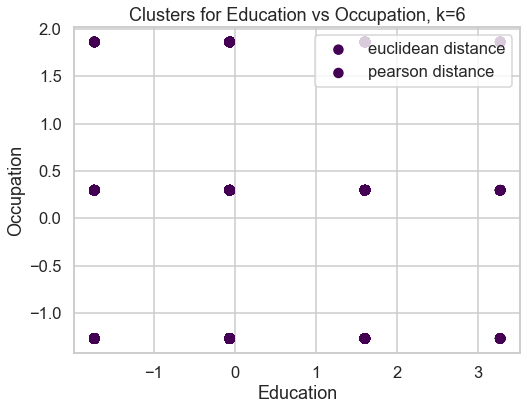

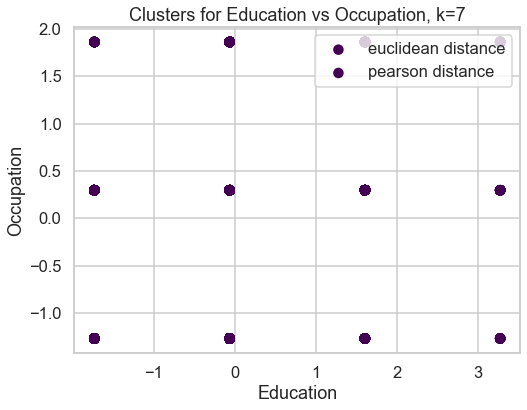

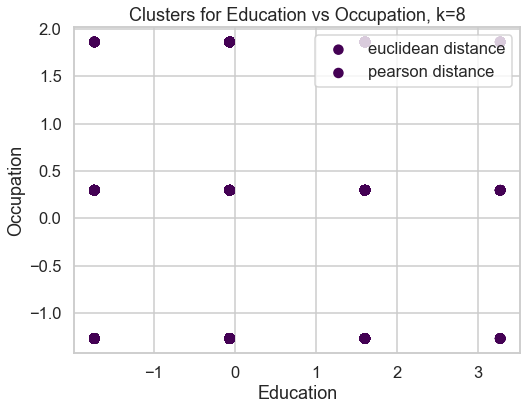

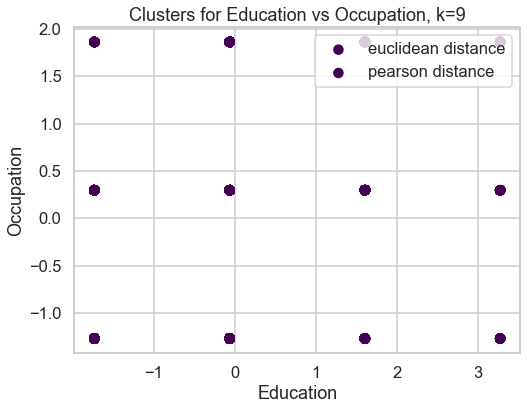

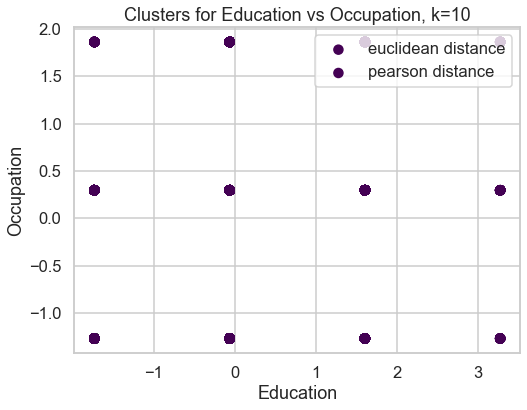


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


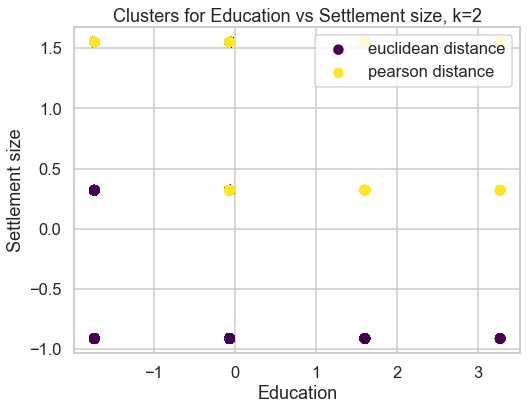


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


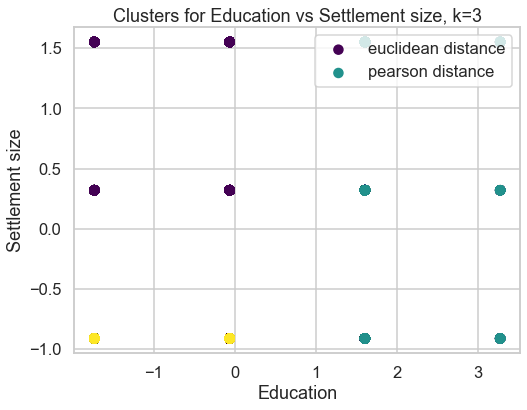


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


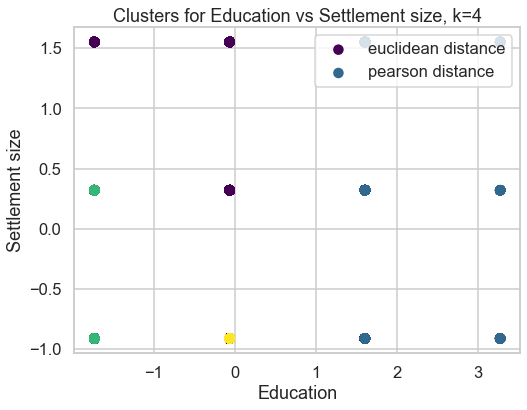

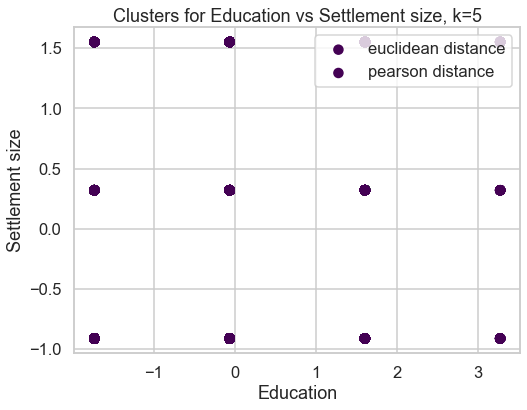


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


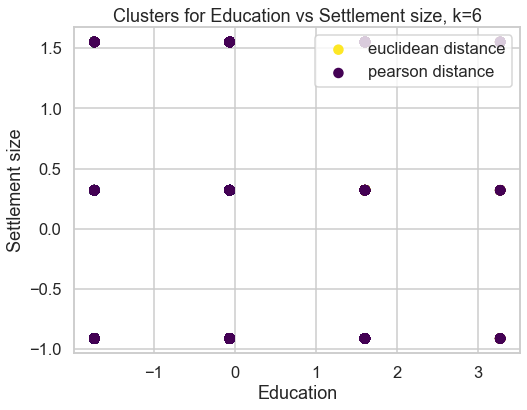

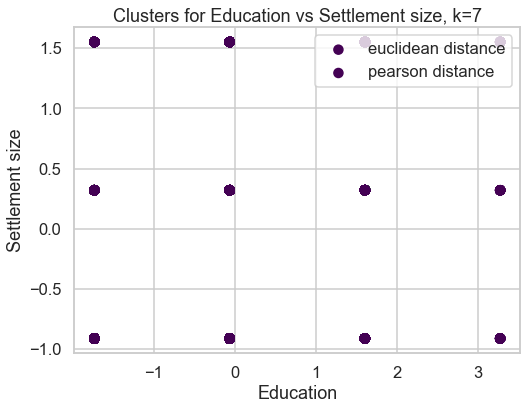

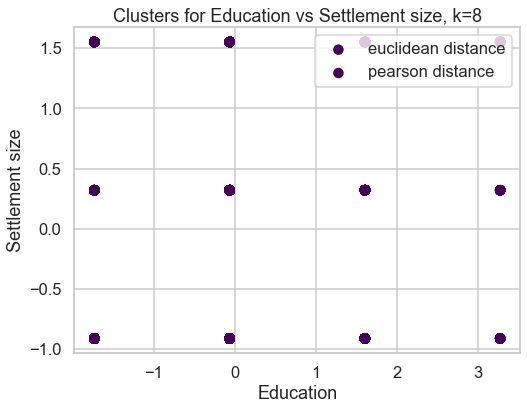

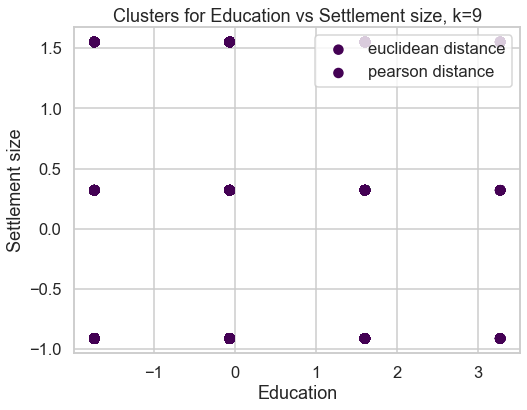

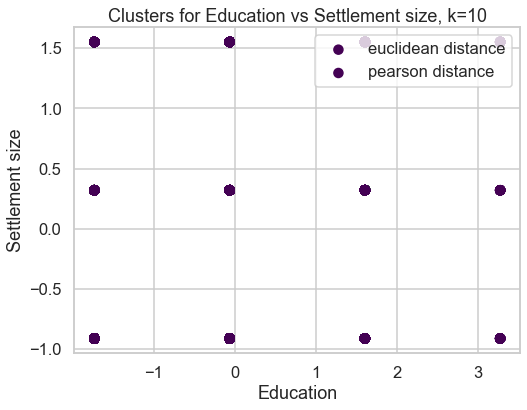


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


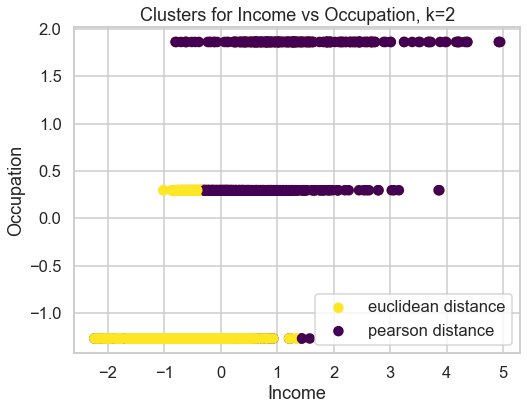


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


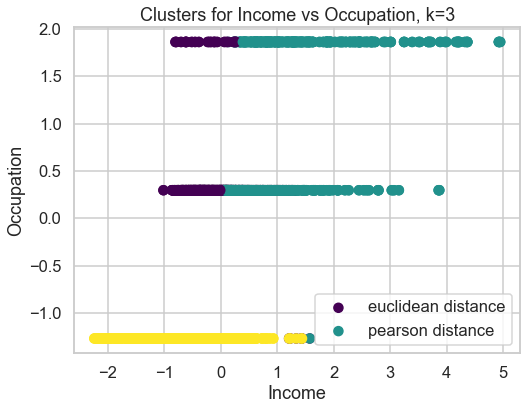


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


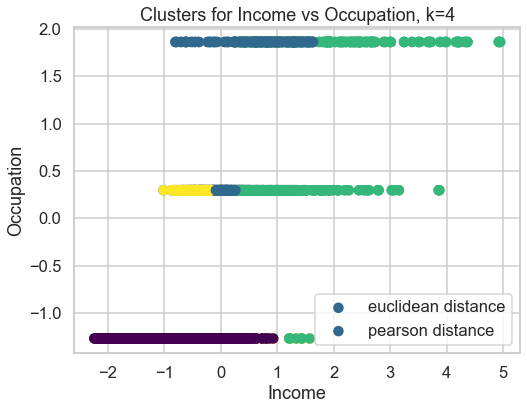


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


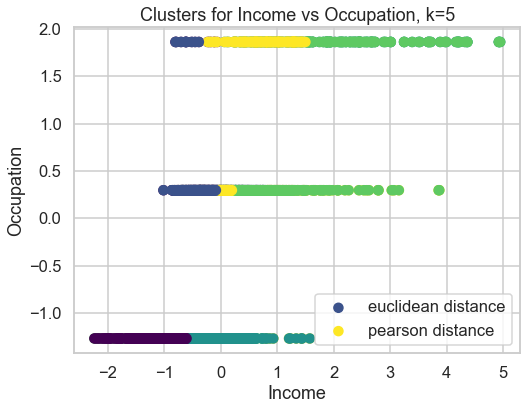


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


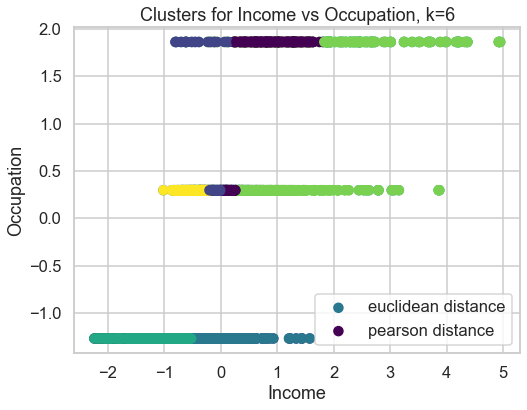


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


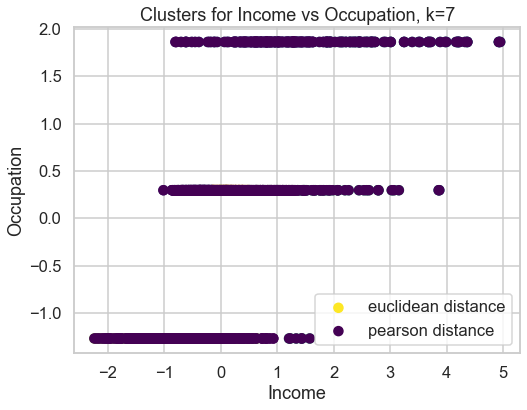


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


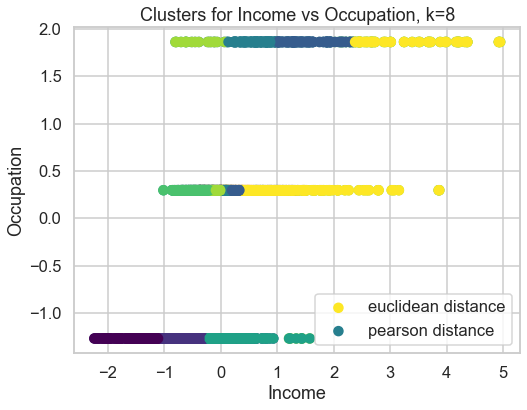


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


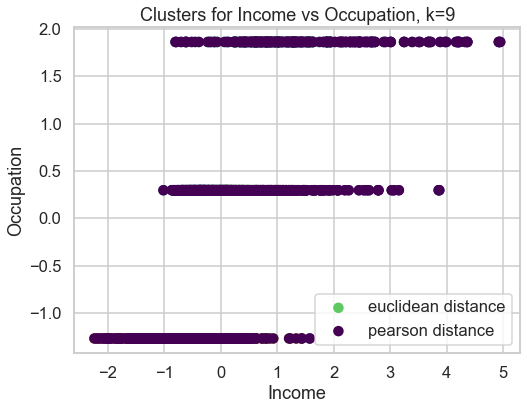


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


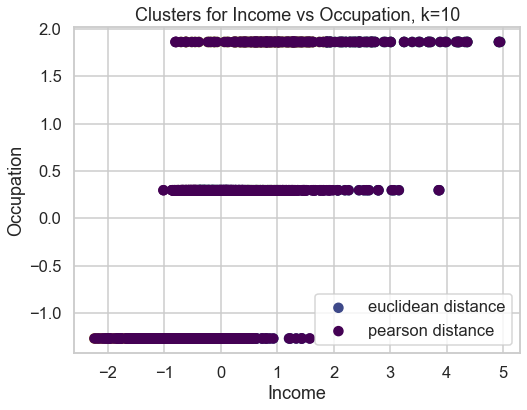


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


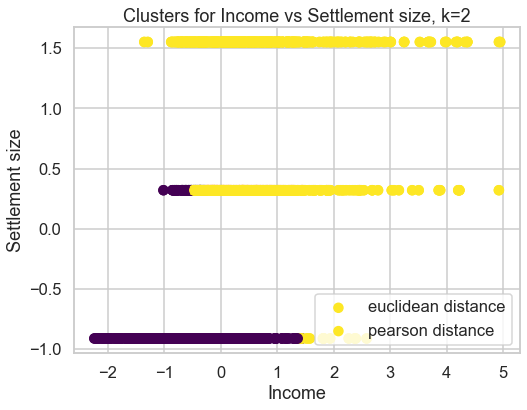


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


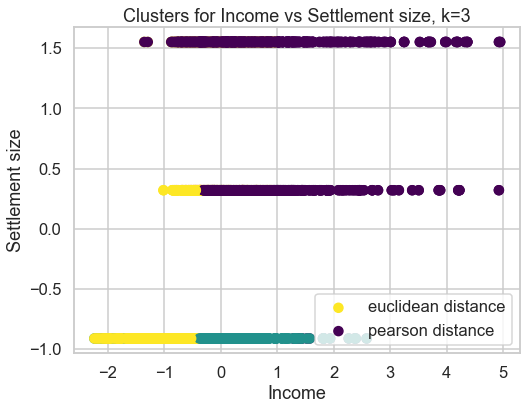


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


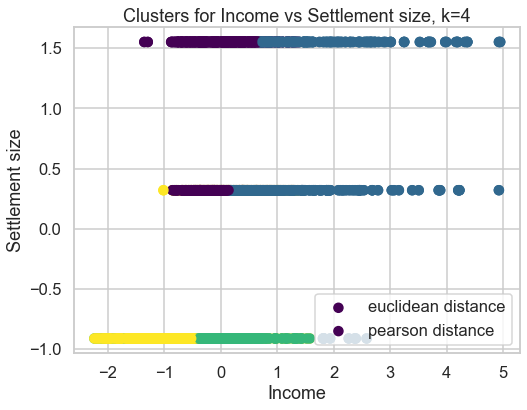


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


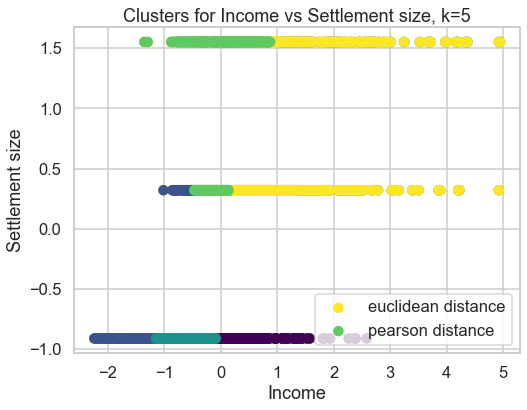


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


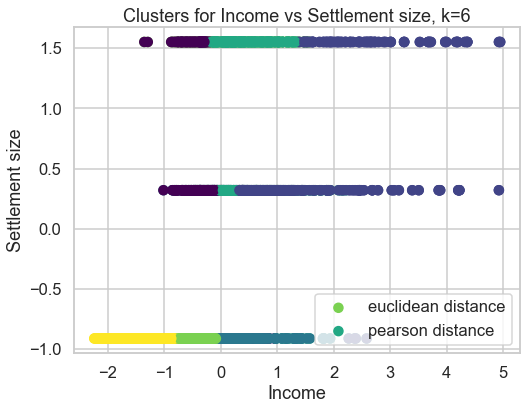


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


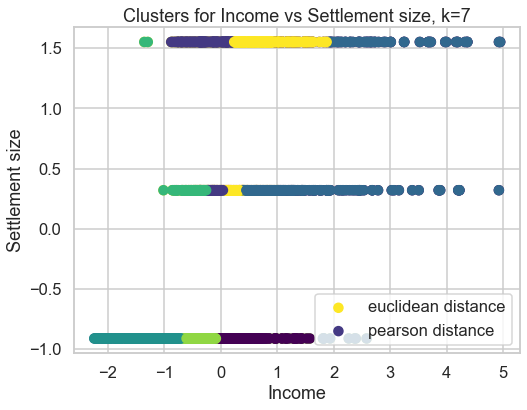


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


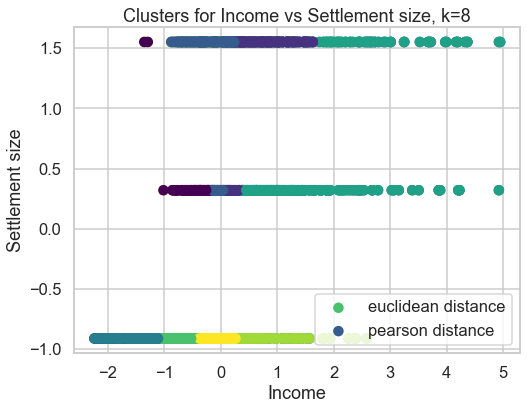


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


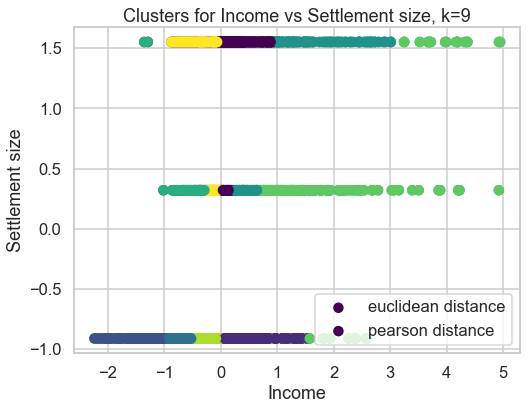


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


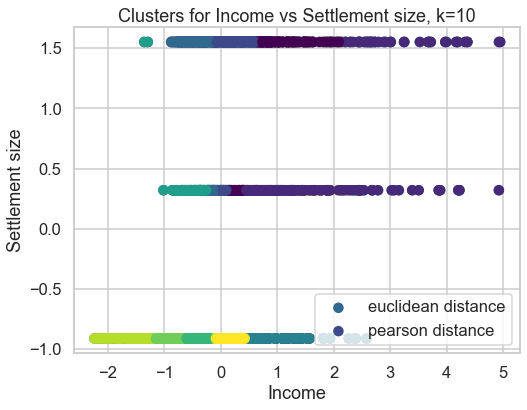


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


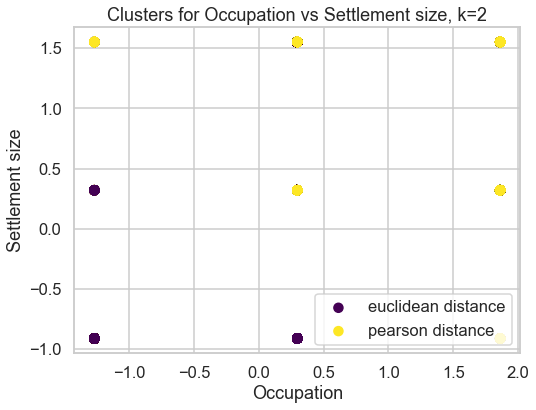


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


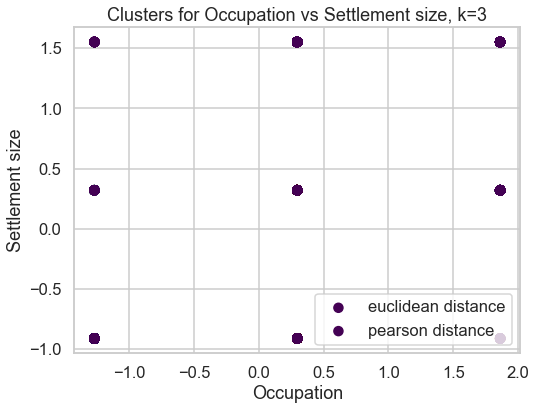


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


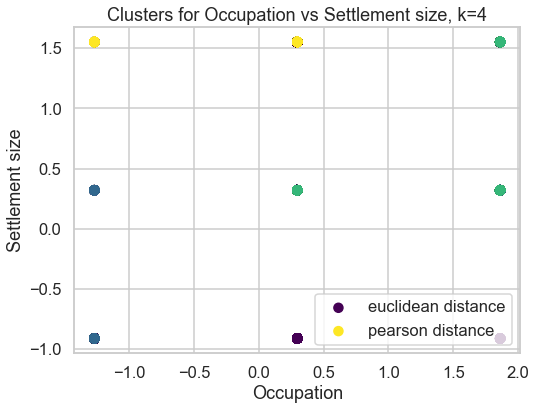

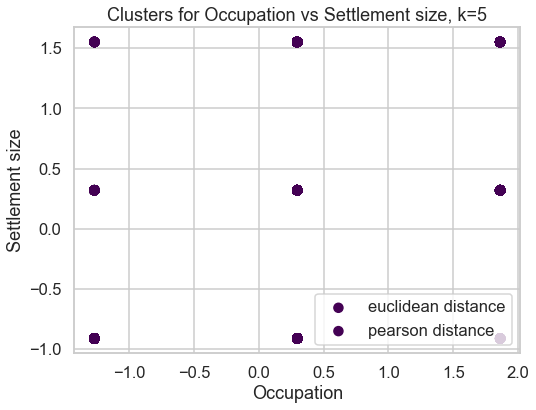

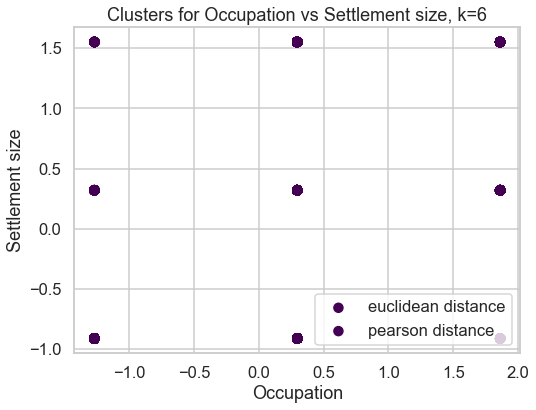

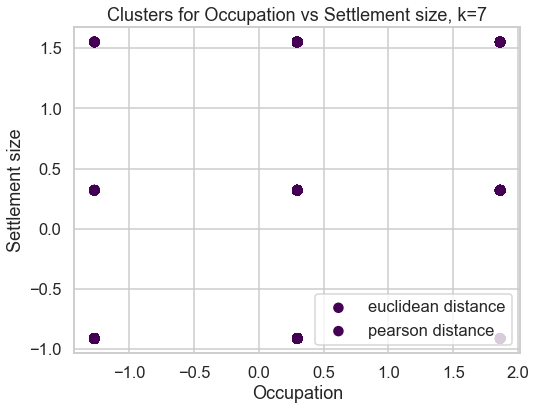

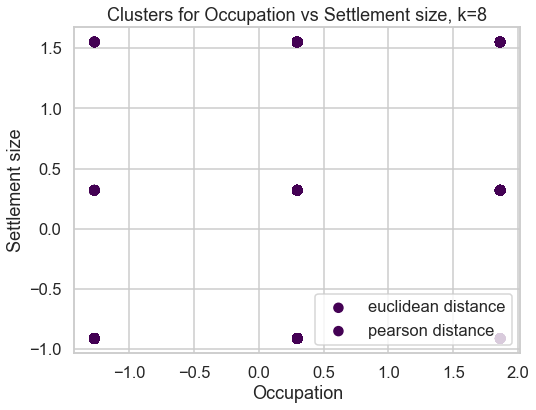

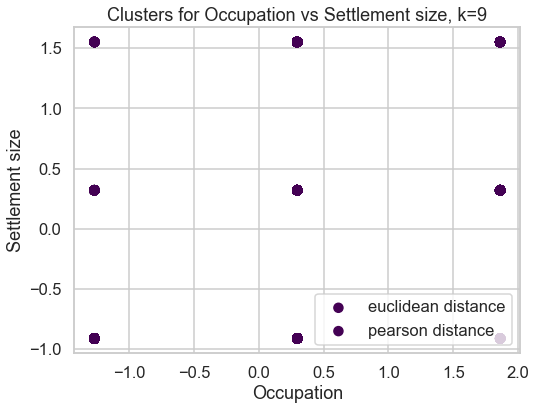

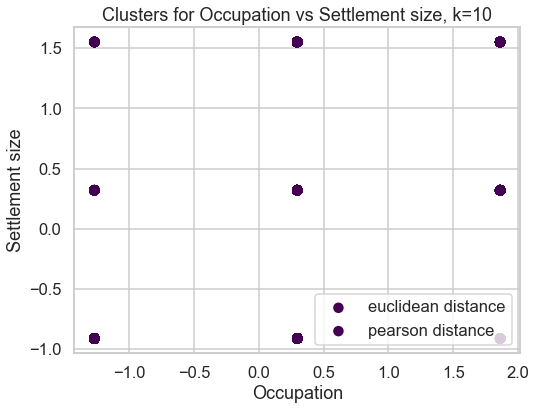

In [46]:
# Identify numerical columns
numerical_columns = customer_df.select_dtypes(include=np.number).columns

# Standardize the data using StandardScaler
scaler = StandardScaler()
customer_df_scaled = scaler.fit_transform(customer_df[numerical_columns])

# List of feature combinations
feature_combinations = [(feature1, feature2) for i, feature1 in enumerate(numerical_columns) for feature2 in numerical_columns[i + 1:]]

# Specify the range of clusters
num_clusters_range = range(2, 11)

# Distance functions to try
distance_functions = ['euclidean', 'pearson']

#Perform clustering for each combination of features and visualize the clusters
for feature1, feature2 in feature_combinations:
    for num_clusters in num_clusters_range:
        plt.figure(figsize=(8, 6))

        for distance_function in distance_functions:
            # Apply K-means clustering using GUC_Kmean
            final_cluster_distances, cluster_metric, cluster_centroids, cluster_assignments = GUC_Kmean(
                customer_df_scaled[:, [customer_df.columns.get_loc(feature1), customer_df.columns.get_loc(feature2)]],
                num_clusters, distance_function
            )

            # Plot the clustered data
            plt.scatter(customer_df_scaled[:, customer_df.columns.get_loc(feature1)],
                        customer_df_scaled[:, customer_df.columns.get_loc(feature2)],
                        c=cluster_assignments, cmap='viridis', label=f'{distance_function} distance')

        plt.title(f'Clusters for {feature1} vs {feature2}, k={num_clusters}')
        plt.xlabel(feature1)
        plt.ylabel(feature2)
        plt.legend()
        plt.show()
        




Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


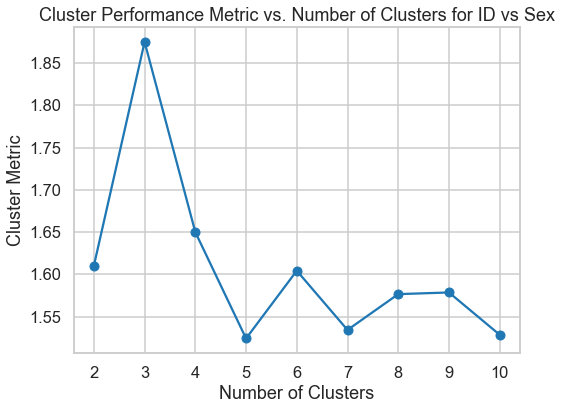


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


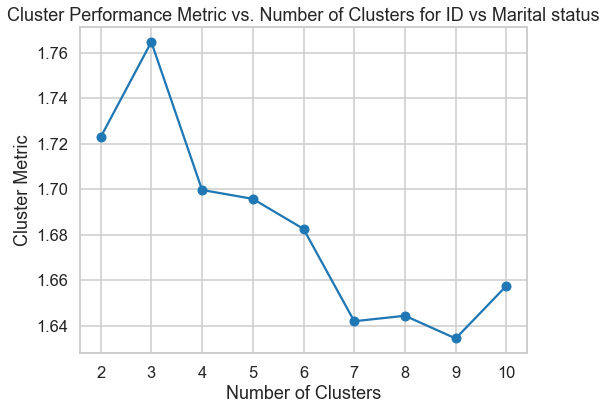


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


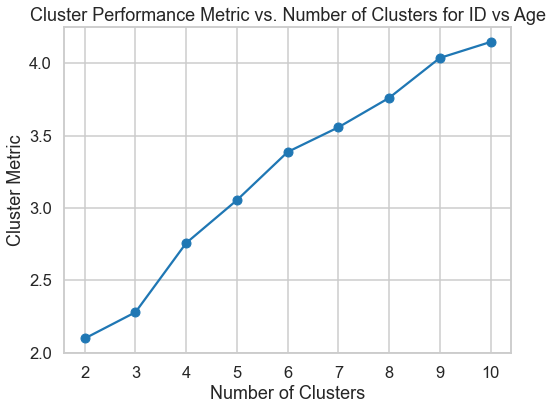


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


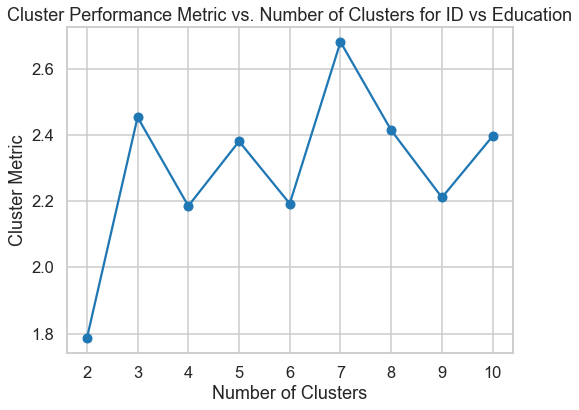


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


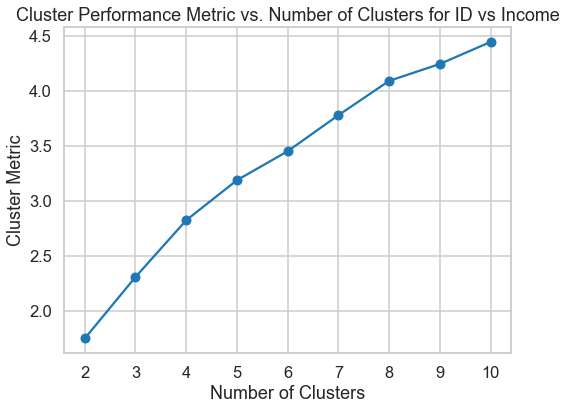


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


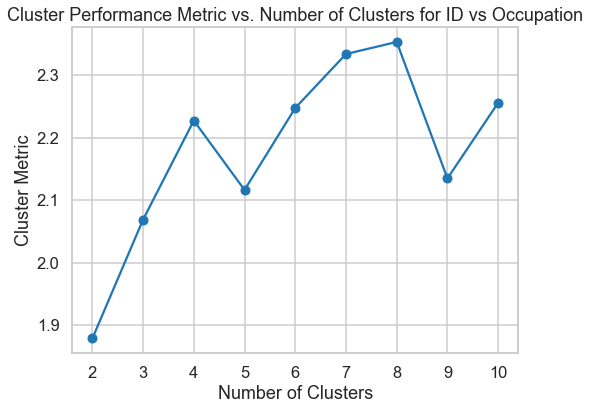


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


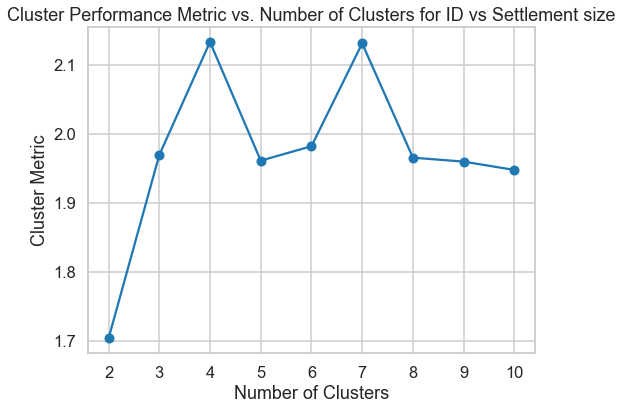


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


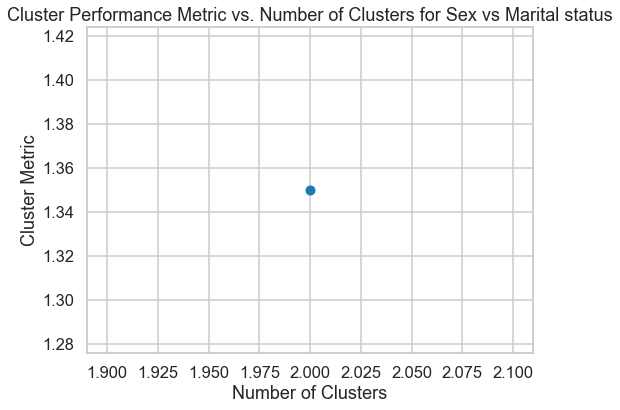


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


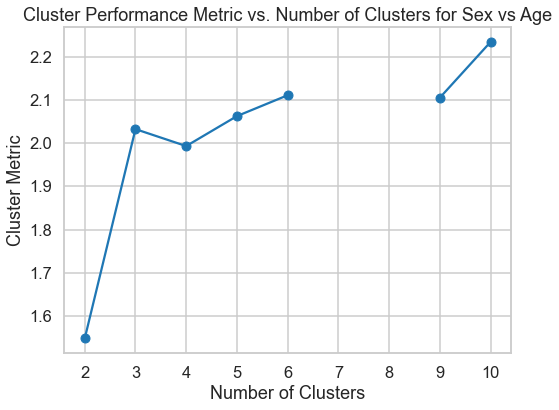


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


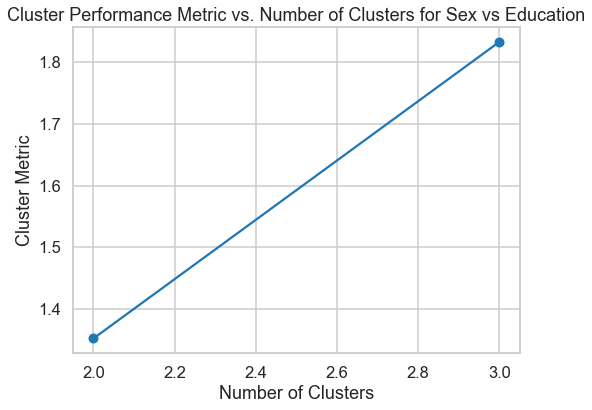


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


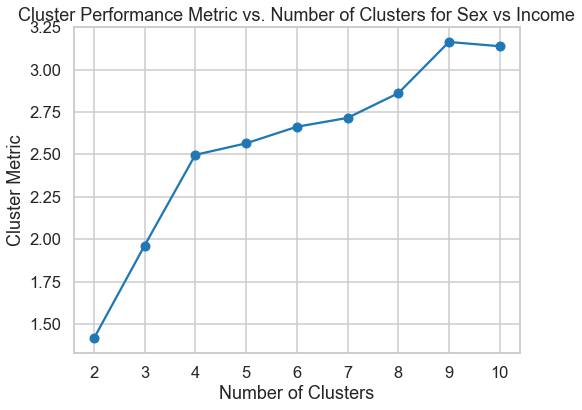


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


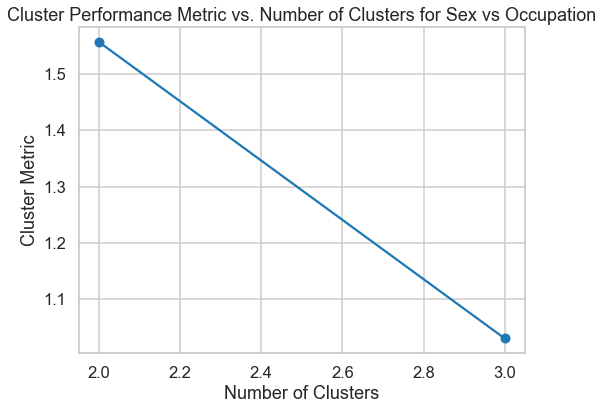


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


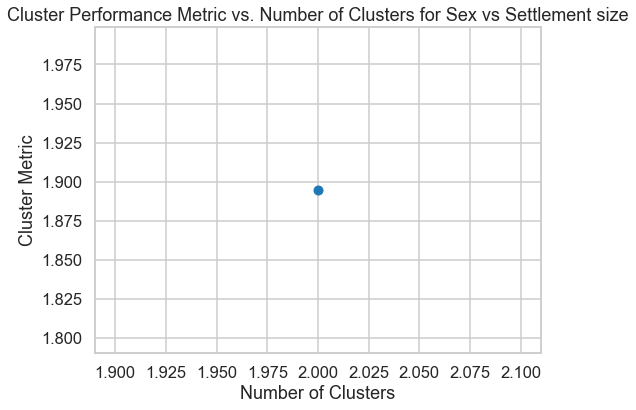


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


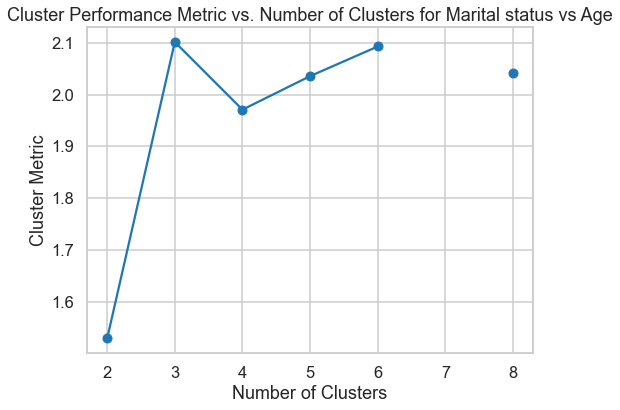


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


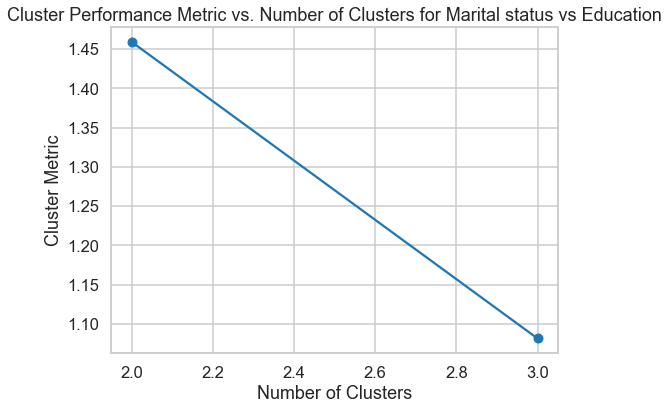


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


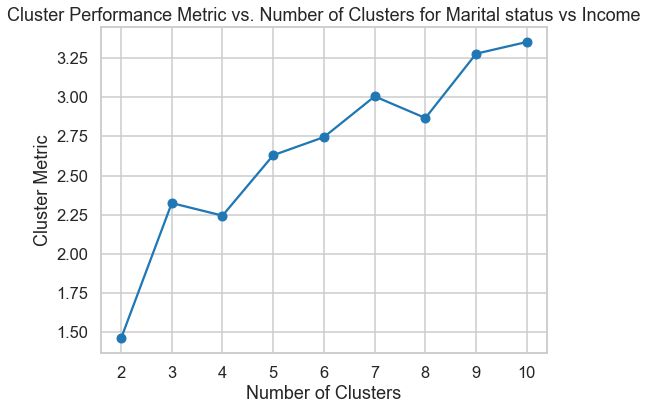


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


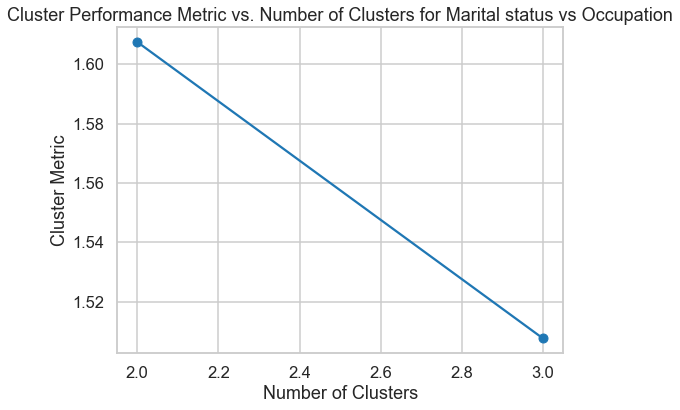


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


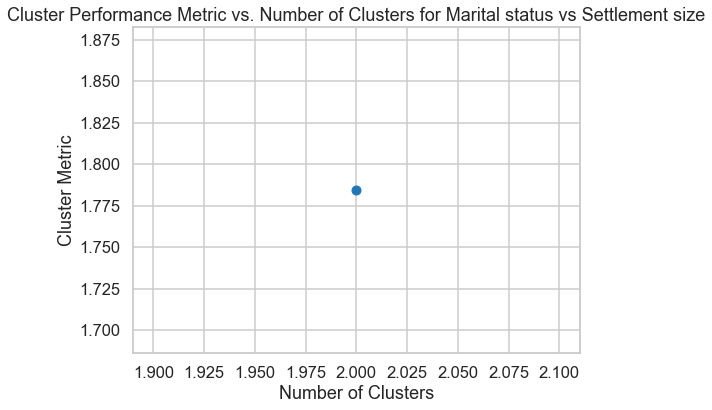


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


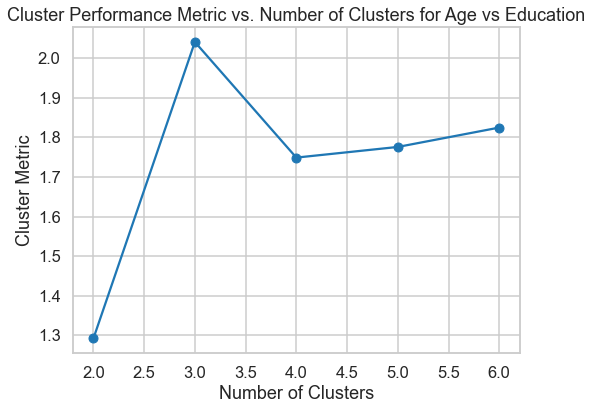


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


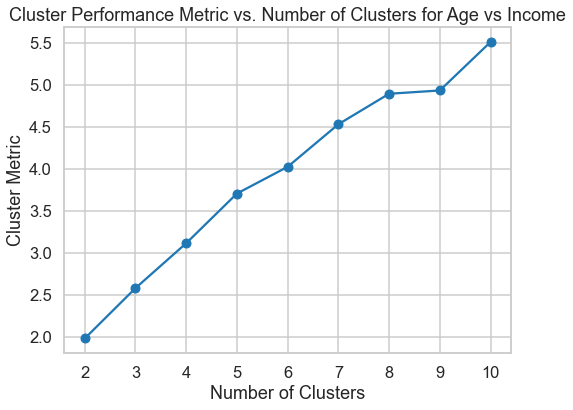


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


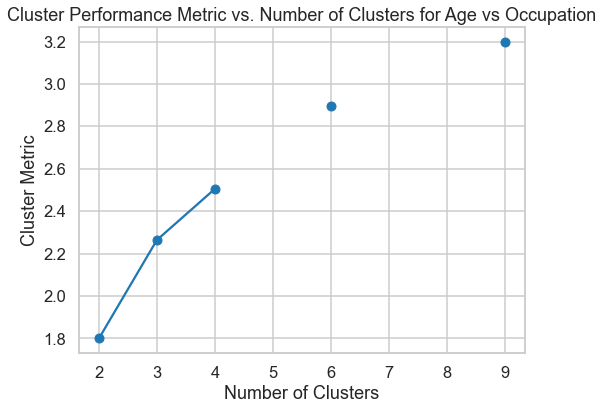


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


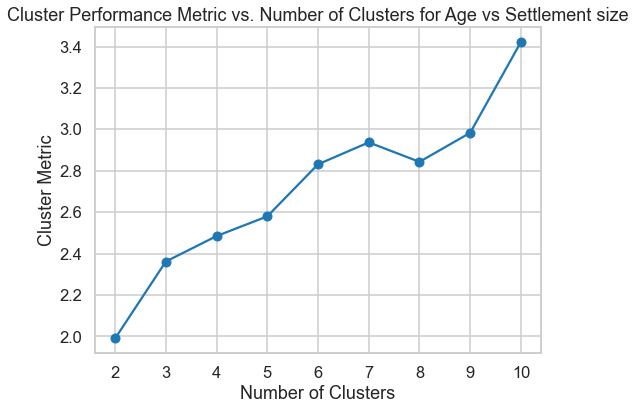


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


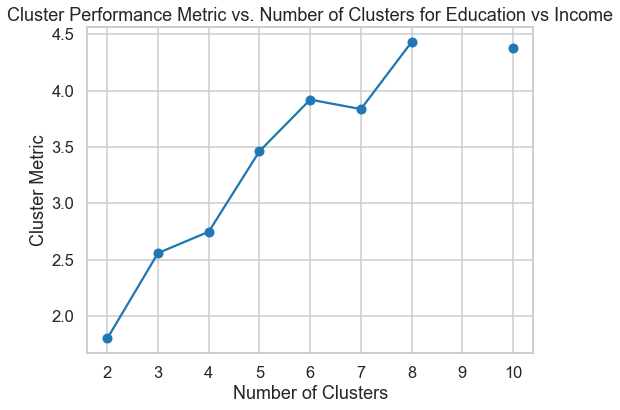

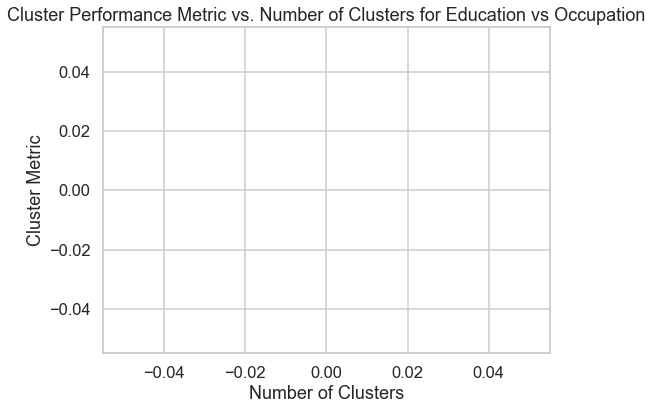


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


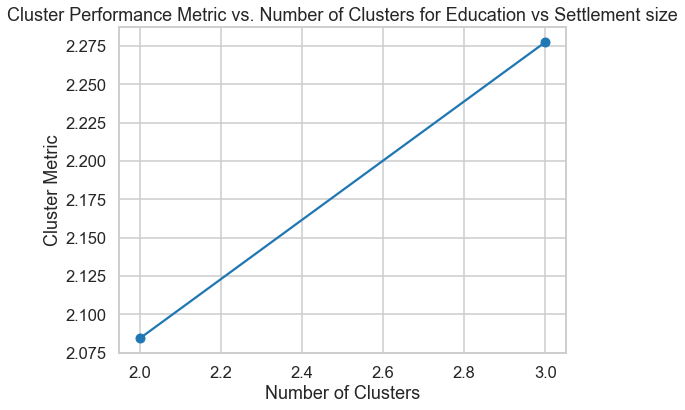


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


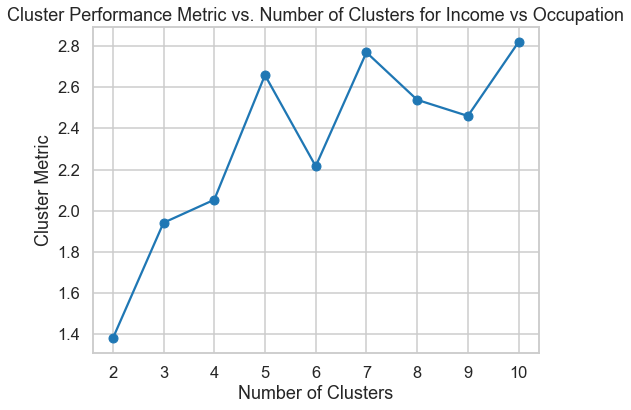


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


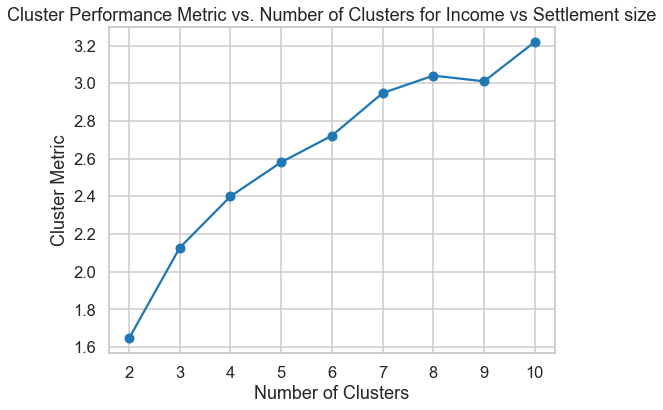


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


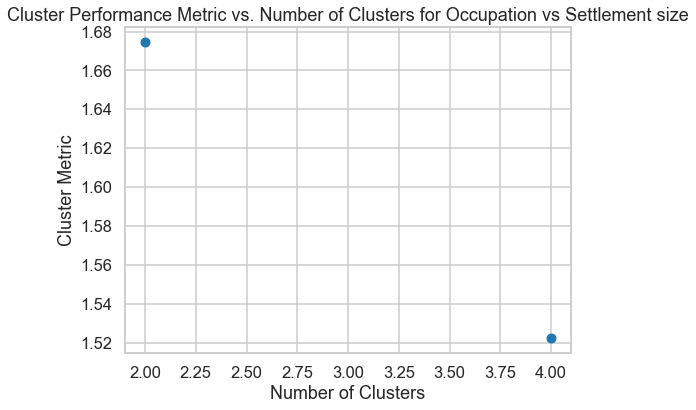

In [51]:
# Plot Cluster Performance Metric versus the Number of Clusters (Euclidean)

for feature1, feature2 in feature_combinations:
    plt.figure(figsize=(8, 6))
    clusters = []
    cluster_metric = []

    for num_clusters in num_clusters_range:
        # Apply K-means clustering using GUC_Kmean
        km = GUC_Kmean(
            customer_df_scaled[:, [customer_df.columns.get_loc(feature1), customer_df.columns.get_loc(feature2)]],
            num_clusters, "euclidean"
        )

        clusters.append(num_clusters)
        cluster_metric.append(km[1])

    # Plot Cluster Performance Metric versus the Number of Clusters for the current feature combination
    plt.plot(clusters, cluster_metric, marker='o')
    plt.title(f'Cluster Performance Metric vs. Number of Clusters for {feature1} vs {feature2}')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Cluster Metric')
    plt.show()



Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


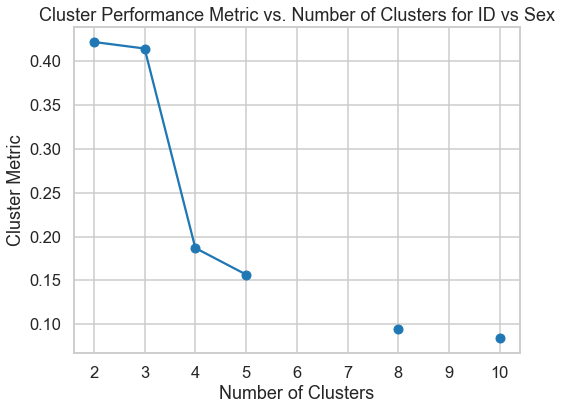


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


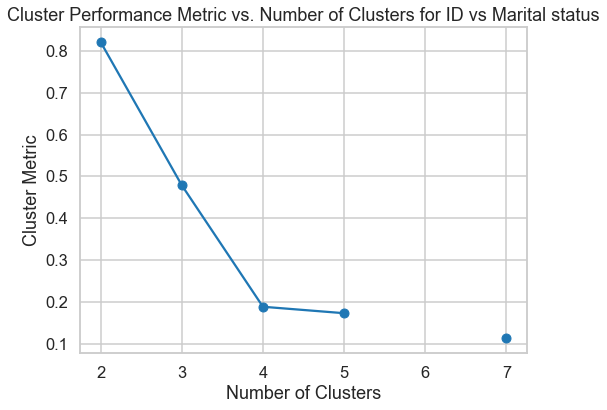


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


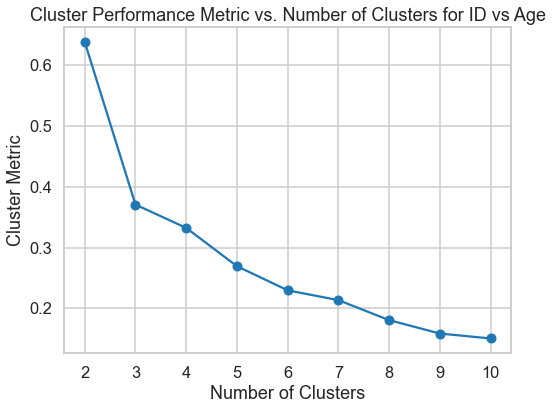


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


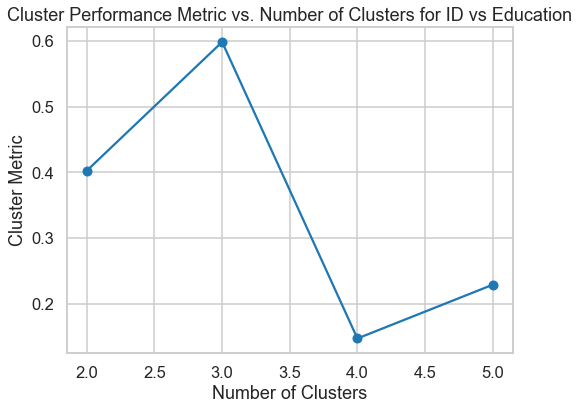


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


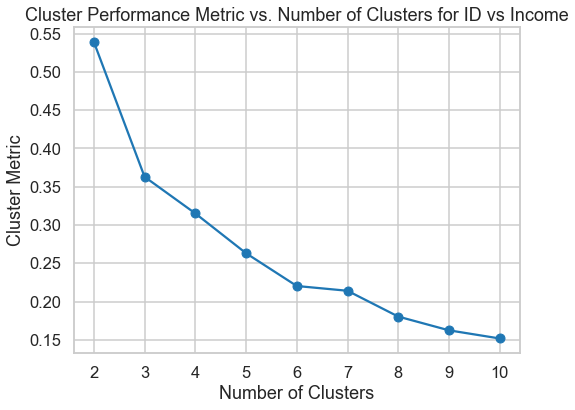


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


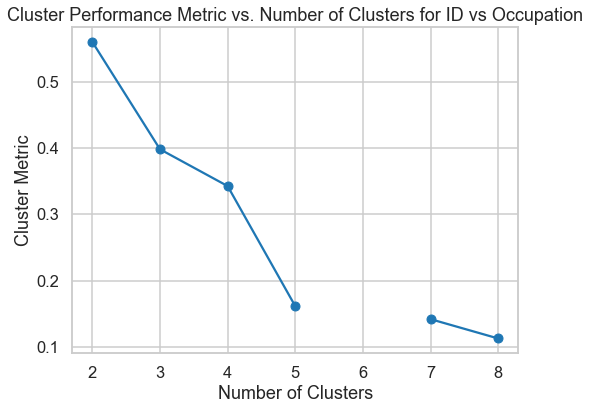


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


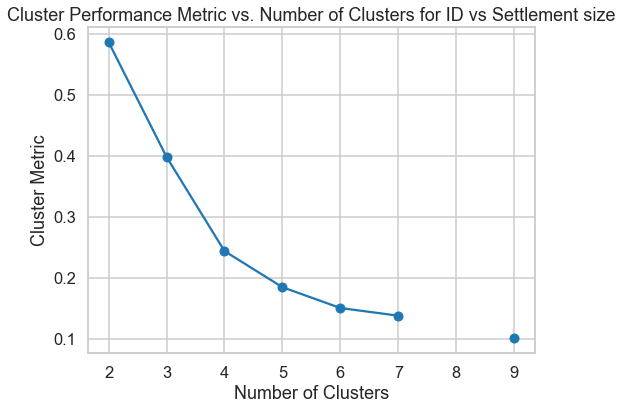

/var/folders/kh/bncmmmvx71g6hk6x8t5fqcrw0000gn/T/ipykernel_1322/2439898822.py:28: RuntimeWarning: invalid value encountered in true_divide
  distances = 1 - (numerator / denominator)


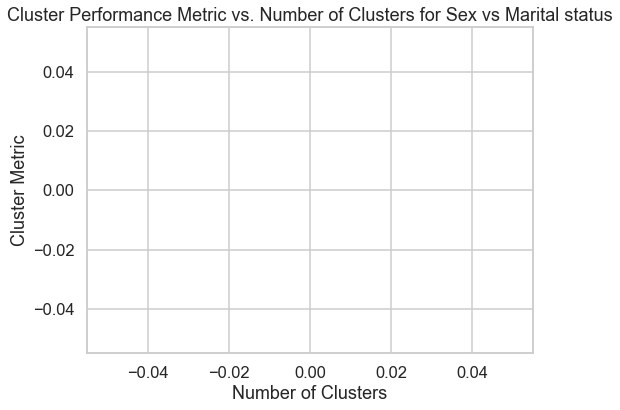


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


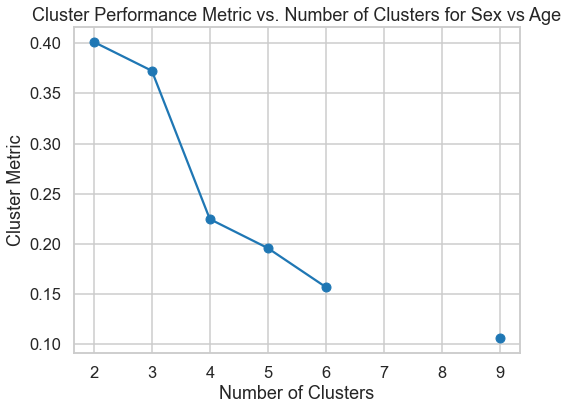


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


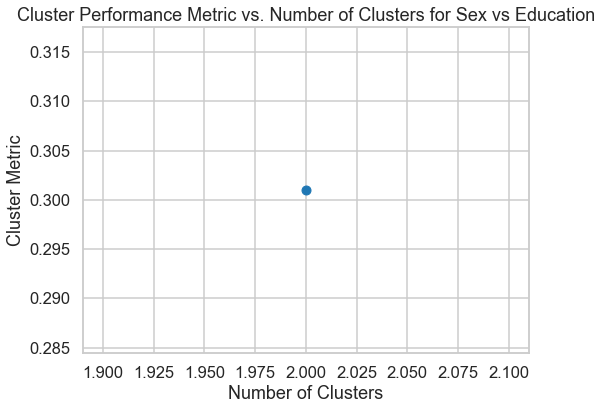


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


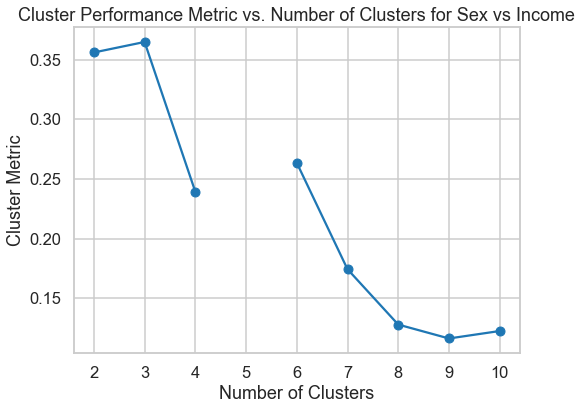


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


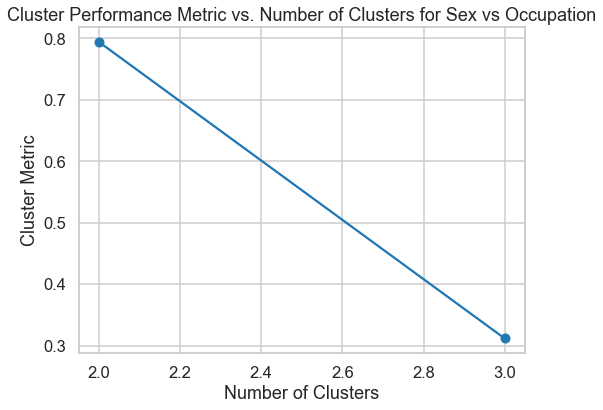


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


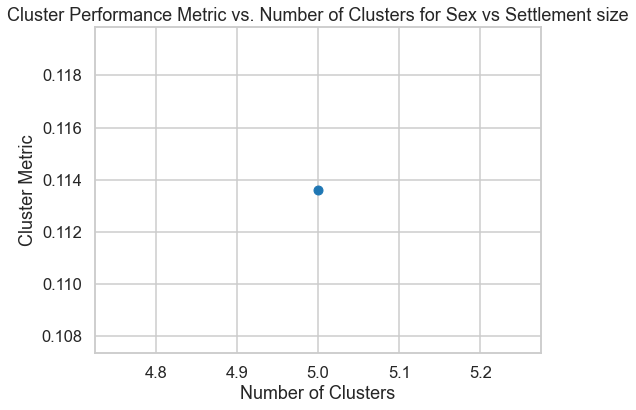


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


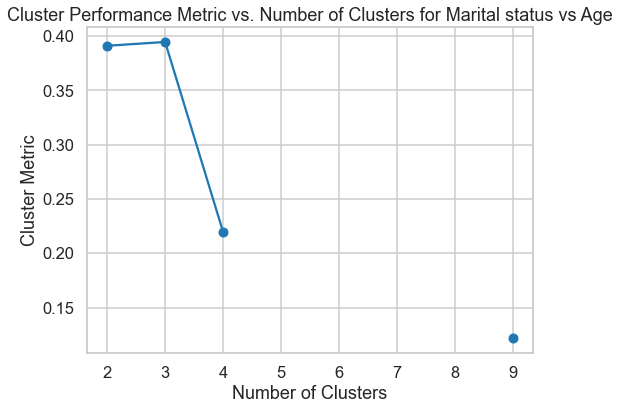


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


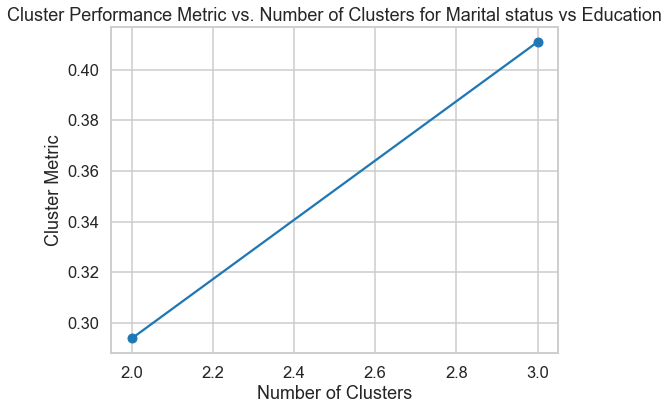


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


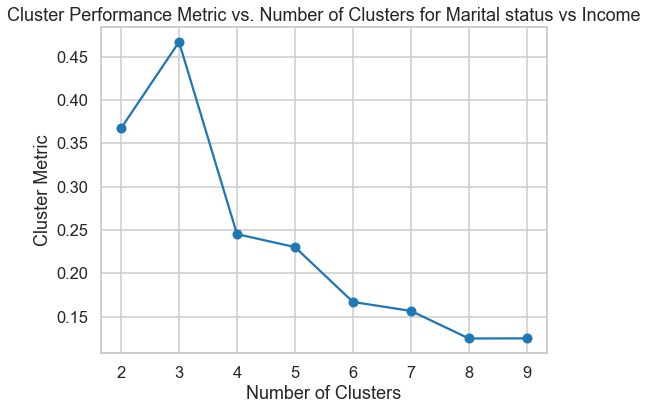


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


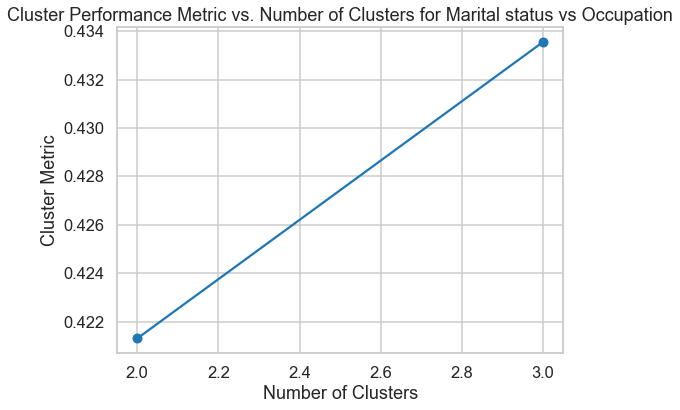


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


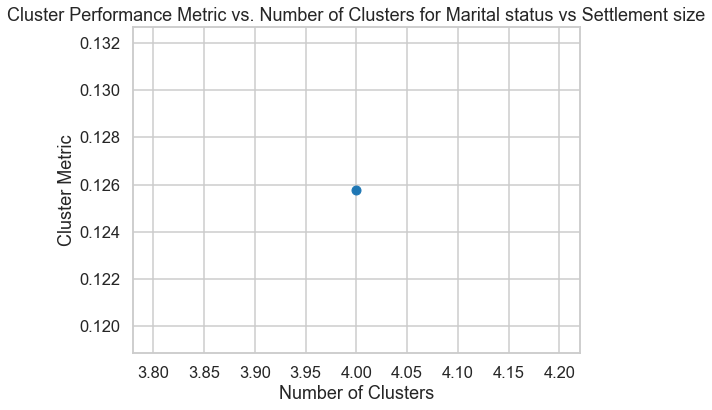


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


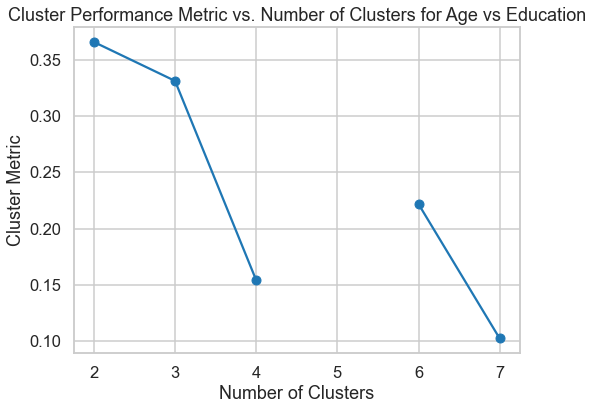


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


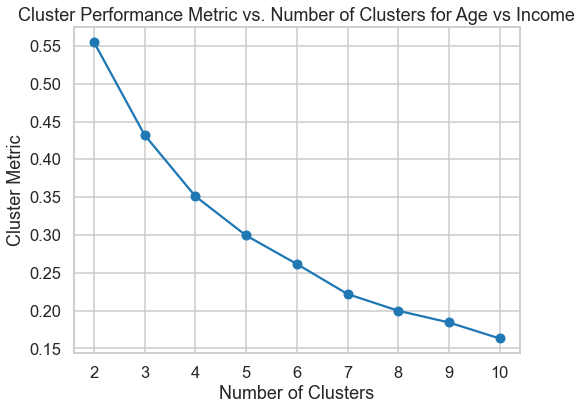


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


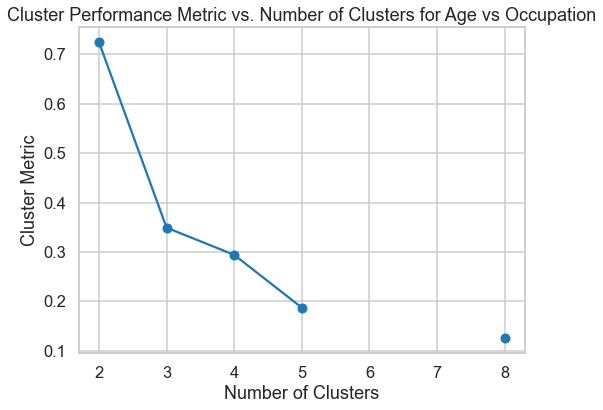


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


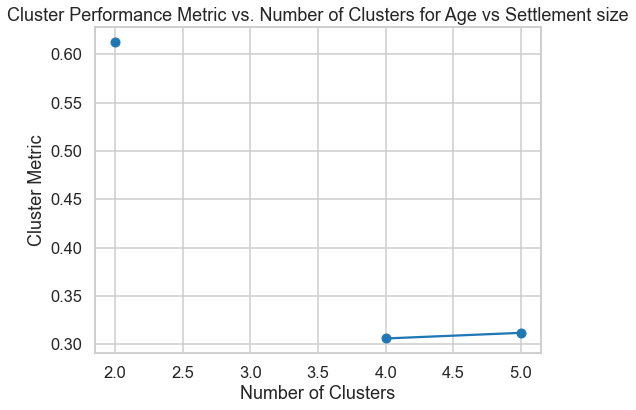


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


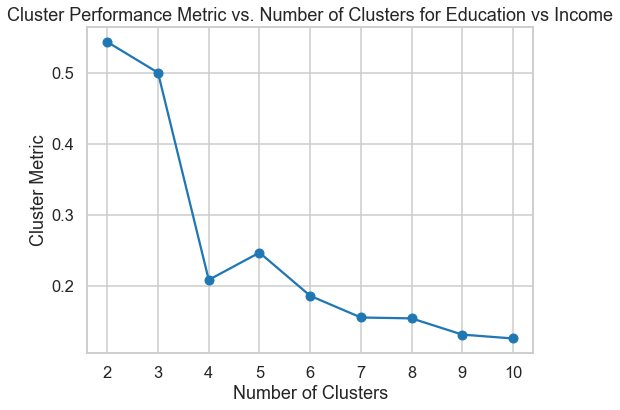


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


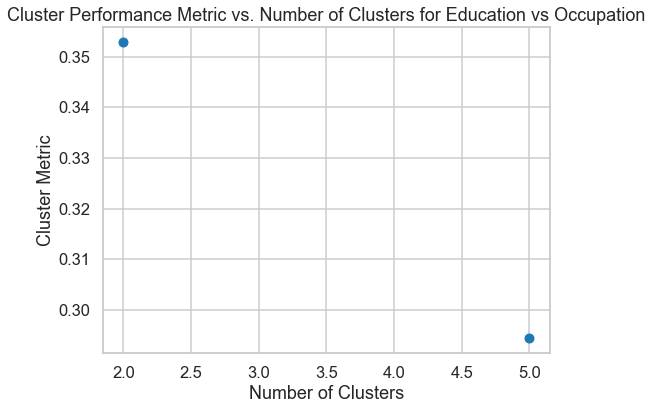


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


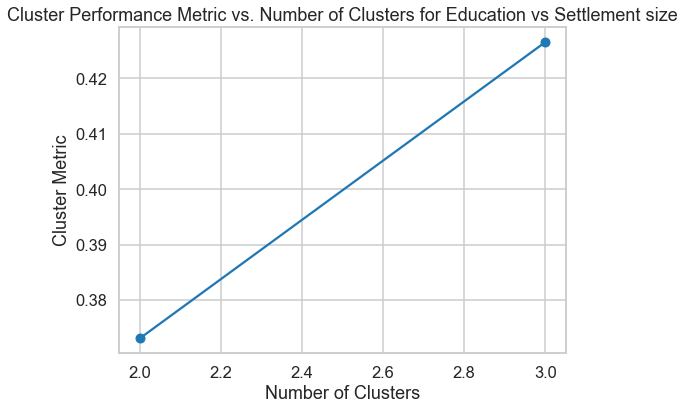


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


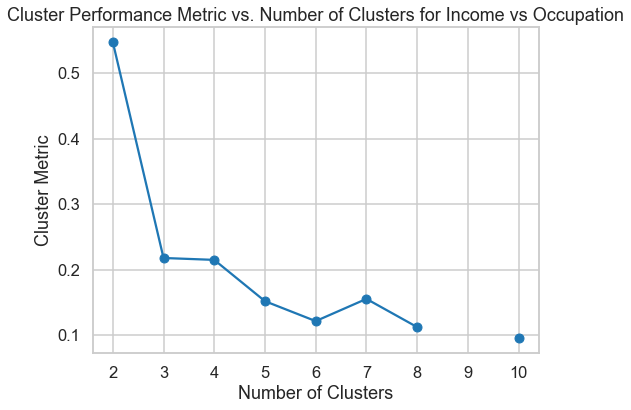


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


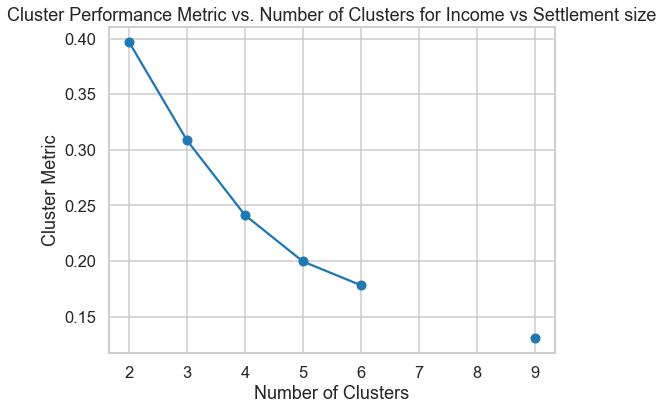


Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.

Stopping condition 1 met: Mean square distances have not changed significantly for 2 consecutive iterations.


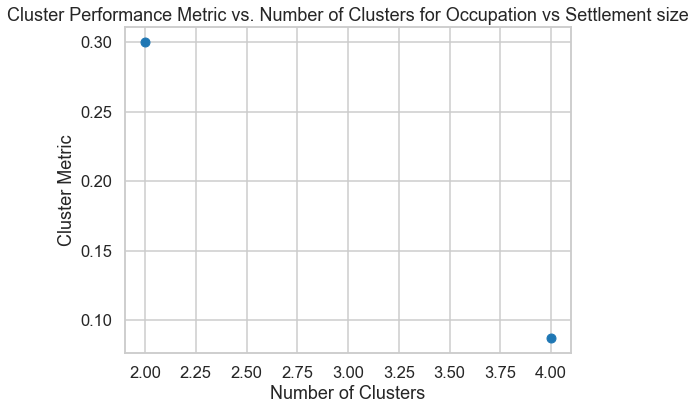

In [52]:
# Plot Cluster Performance Metric versus the Number of Clusters (Pearson)

for feature1, feature2 in feature_combinations:
    plt.figure(figsize=(8, 6))
    clusters = []
    cluster_metric = []

    for num_clusters in num_clusters_range:
        # Apply K-means clustering using GUC_Kmean
        km = GUC_Kmean(
            customer_df_scaled[:, [customer_df.columns.get_loc(feature1), customer_df.columns.get_loc(feature2)]],
            num_clusters, "pearson"
        )

        clusters.append(num_clusters)
        cluster_metric.append(km[1])

    # Plot Cluster Performance Metric versus the Number of Clusters for the current feature combination
    plt.plot(clusters, cluster_metric, marker='o')
    plt.title(f'Cluster Performance Metric vs. Number of Clusters for {feature1} vs {feature2}')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Cluster Metric')
    plt.show()
